<a href="https://colab.research.google.com/github/mcsangillo/arctic-coastal-fetch-analysis/blob/main/MichelleSangillo_MQP_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
%cd 'drive/MyDrive/2023-2024_ArcticWaves_SangilloMQP/Code'

/content/drive/.shortcut-targets-by-id/1ZK8QxuGc9GOxF7K0RYRwdzRDOUoPsYV7/2023-2024_ArcticWaves_SangilloMQP/Code


In [ ]:
#!pip install import-ipynb
#import import_ipynb

In [ ]:
from scipy.io import netcdf
import xarray as xr
import datetime as dt
import matplotlib as mpl
from matplotlib import pyplot as plt
import matplotlib.dates as mdates
import matplotlib.cm as cm
from matplotlib.ticker import (MultipleLocator,
                               FormatStrFormatter,
                               AutoMinorLocator)
import math as m
from statistics import mean
import numpy as np
from numpy import arange
from pandas import read_csv
from scipy.optimize import curve_fit

#import Functions as fun

# Colorbar code
https://matplotlib.org/stable/users/explain/colors/colorbar_only.html

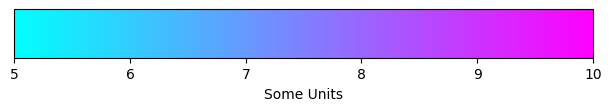

In [ ]:
fig, ax = plt.subplots(figsize=(6, 1), layout='constrained')

cmap = mpl.cm.cool
norm = mpl.colors.Normalize(vmin=5, vmax=10)

fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
             cax=ax, orientation='horizontal', label='Some Units')

# Functions | Selecting

In [ ]:
# Select location function

def sel_loc(dataset, lat, lon):
  '''
  Shortens dataset based on location
  :params dataset: xarray dataset being shortened
          lat: int, latitude in decimal form
          lon: int, longitude in decimal form
  :returns sel: xarray of the dataset to the nearest lat and lon
  '''
  return dataset.sel(longitude=lon, latitude=lat, method='nearest')

In [ ]:
# Select time function

def sel_time(dataset, start_date, diff_or_end_date):
  '''
  Shortens dataset based on start and end dates
  :params dataset: xarray dataset being shortened
          start_date: datetime of the start date for the outputted xarray
          diff_or_end_date: either int which is the difference of days from the start to end or datetime of the end date for the outputted xarray
  :returns sel: xarray of the dataset of the selected time
  '''
  if type(diff_or_end_date) == int:
    sel = dataset.sel(time=slice(start_date, start_date + dt.timedelta(days = diff_or_end_date)))
  else:
    sel = dataset.sel(time=slice(start_date, diff_or_end_date))
  return sel

# Functions | Angles

In [ ]:
def angle_between2(p2):
    North = (0, 1)
    Ang_North = np.arctan2(*North[::-1])
    ang2 = np.arctan2(*p2[::-1])
    return np.rad2deg((Ang_North - ang2) % (2 * np.pi))

# Functions | Lat & Lon

In [ ]:
# Convert a singular coordinate to degree

def coord_deg(degree, minutes):
  '''
  Converts latitude or longitude from degree and minute form to decimal form
  :params degree: degree portion of latitude or longitude
          minutes: minute portion of latitude or longitude
  :return decimal for of input
  '''
  return degree + (minutes / 60)

In [ ]:
# Convert location coordinates to degrees

def loc_degree(lat_deg, lat_min, lon_deg, lon_min):
  '''
  Converts latitude and longitude from degree and minute form to decimal form using coord_deg
  :params lat_deg: degree portion of latitude
          lat_min: minute portion of latitude
          lon_deg: degree portion of longitude
          lon_min: minute portion of longitude
  :returns tuple of lat and lon in decimal form as coordinate
  '''
  return (coord_deg(lat_deg, lat_min), coord_deg(lon_deg, lon_min))

# Functions | Time Series

In [ ]:
def time_series_axis(ax):
  ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
  ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
  ax.tick_params(axis='y')
  plt.setp(ax.get_xticklabels(), verticalalignment='top', horizontalalignment='center', rotation=30)
  ax.xaxis.set_minor_formatter(mdates.DateFormatter('%-d'))
  ax.xaxis.set_minor_locator(mdates.DayLocator(interval=2))
  ax.grid(which='major', linewidth=0.8)
  ax.grid(which='minor', color='#CCCCCC', linewidth=0.5)
  ax.grid(True)
  #ax.set_xlabel('2023', fontsize=12)

In [ ]:
def log_axis(ax):
  ax.set_yscale('log')
  y_major = mpl.ticker.LogLocator(base = 10.0, numticks = 15)
  ax.yaxis.set_major_locator(y_major)
  y_minor = mpl.ticker.LogLocator(base = 10.0, subs = np.arange(1.0, 10.0) * 0.1, numticks = 10)
  ax.yaxis.set_minor_locator(y_minor)
  ax.yaxis.set_minor_formatter(mpl.ticker.NullFormatter())

In [ ]:
def time_series_singular(ax, moor, dataset, variable):
  data = moor[dataset]
  ax.scatter(data.time, data[variable], marker='.', s=60, color=moor['fig color'], label=data[variable].attrs['long_name'])
  time_series_axis(ax)
  y_label = data[variable].attrs['long_name'] + ' (' + data[variable].attrs['units'] + ')'
  ax.set_ylabel(y_label, fontsize=14)
  return ax

In [ ]:
color1 = '#b2abf2'
color2 = '#89043d'
color3 = '#036016'
color4 = '#47624f'
color5 = '#447604'
color6 = '#226d5a'
color7 = '#b2d373'
era5_color = '#8dba3b'

In [ ]:
def time_series_singular_era5(ax, moor, dataset, variable):
  data = moor[dataset]
  ax.scatter(data.time, data[variable], marker='.', s=60, color=era5_color, label=data[variable].attrs['long_name'])
  time_series_axis(ax)
  y_label = data[variable].attrs['long_name'] + ' (' + data[variable].attrs['units'] + ')'
  ax.set_ylabel(y_label, fontsize=14)
  return ax

In [ ]:
def time_series_singular_log(ax, moor, dataset, variable):
  data = moor[dataset]
  ax.scatter(data.time, data[variable], marker='.', s=60, color=moor['fig color'], label=data[variable].attrs['long_name'])
  time_series_axis(ax)
  log_axis(ax)
  y_label = data[variable].attrs['long_name'] + ' (' + data[variable].attrs['units'] + ')'
  ax.set_ylabel(y_label, fontsize=14)
  return ax

In [ ]:
def time_series(rows, columns, moor, dataset, variable_list):
  data = moor[dataset]
  graph_num = rows * columns
  if len(variable_list) > graph_num:
    return "The desired area is not large enough for the desired variables. Please adjust rows and/or columns accordingly."
  else:
    fig, ax_order = plt.subplots(rows, columns, figsize =(15, 15))
    var_index = 0
    for row in ax_order:
      for spot in row:
        if var_index < len(variable_list):
          time_series_singular(spot, moor, dataset, variable_list[var_index])
          var_index = var_index + 1
        else:
          spot.axis('off')
    return fig

# Functions | Exponential Fitting

In [ ]:
# Exponential equation for fitting data
def exp_eq(x, b, m):
	return 10**b * x**m

In [ ]:
def exp_fit(x, y):
  '''
  uses curve_fit to exp_eq to fit supplied x and y
  Params: x, y: lists or xarray variables
  Returns: b, m: two number that can be put into exp_eq for equation of fit
  '''
  idx = np.isfinite(x) & np.isfinite(y)
  # curve fit
  popt, _ = curve_fit(exp_eq, x[idx], y[idx])

  # summarize the parameter values
  b, m = popt
  return b, m

In [ ]:
def exp_plot(x, b, m):
  '''
  plots exponential fit from list of x values, b, and m
  Params: x: lists or xarray variables, b: intercept in log log plot, m: slope in log log plot
  Returns: plot of fitted exponential
  '''
  # define a sequence of inputs between the smallest and largest known inputs
  x_line = arange(min(x), max(x), 1)

  # calculate the output for the range
  y_line = exp_eq(x_line, b, m)

  # create a line plot for the mapping function
  plt.plot(x_line, y_line, '--', color='red')

In [ ]:
def exp_print(b, m):
  '''
  prints fitted exponential equation
  Params: b, m: intercept and slope in log log plot
  Returns: string equation
  '''
  strb = str(round(b, 2))
  strm = str(round(m, 2))
  return r'$(y = 10^{%s} * x^{%s})$' %(strb, strm)
  #(r'$(\frac{%s - \frac{1}{x}}{%s})$' %(str(a), str(b)))

In [ ]:
exp_print(4,3)

'$(y = 10^{4} * x^{3})$'

In [ ]:
a = 5
b = 4
mathext_demos = (r'$(\frac{%s - \frac{1}{x}}{%s})$' %(str(a), str(b)))
print(mathext_demos)

$(\frac{5 - \frac{1}{x}}{4})$


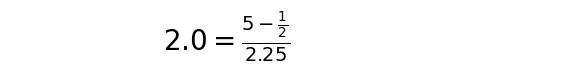

In [ ]:
import matplotlib.pylab as plt

def make_equation(code,fsize=20,imgheight=70):
    fig=plt.figure(figsize=(7, 0.1))

    plt.annotate(code,
               xy=(.4, 0.1), ha='center', fontsize=fsize)
    plt.axis('off')


def create_mathtext(a="a",b="b",x="x"):
    c="c"
    if type(a)!=str:
        c = (a-1/x)/b
    return r'$%s=\frac{%s - \frac{1}{%s}}{%s}$' %(str(c), str(a),str(x), str(b))

make_equation( create_mathtext(5,2.25,2))

In [ ]:
def exp_print_10b(b, m):
  '''
  prints fitted exponential equation
  Params: b, m: intercept and slope in log log plot
  Returns: string equation
  '''
  eq = 'y = 10^' + str(round(b, 2)) + ' * x^' + str(round(m, 2))
  return eq

In [ ]:
def exp_print(b, m):
  '''
  prints fitted exponential equation
  Params: b, m: intercept and slope in log log plot
  Returns: string equation
  '''
  A = 10**b
  eq = 'y = ' + str(round(A, 2)) + ' * x^' + str(round(m, 2))
  return eq

In [ ]:
def exp_fit_agevfetch(moor_dict, xarray):
  x, y = moor_dict[xarray]['x_km'], moor_dict[xarray]['C/wspd']
  b, m = exp_fit(x, y)
  return b, m

# Data

In [ ]:
# Data dictionary for Mooring 1
moor_1 = {'Site': 1,
          'Moor': 'Mooring 1',
          'file': 'Moorings/ArcticCable_Site1_Apr-Sep2023_18-Apr-2023_22-Sep-2023_depthcorrectedextrapolated.nc'}

In [ ]:
# Data dictionary for Mooring 2
moor_2 = {'Site': 2,
          'Moor': 'Mooring 2',
          'file': 'Moorings/ArcticCable_Site2_Apr-Sep2023_18-Apr-2023_22-Sep-2023_depthcorrectedextrapolated.nc'}

In [ ]:
# Data dictionary for Mooring 3
moor_3 = {'Site': 3,
          'Moor': 'Mooring 3',
          'file': 'Moorings/ArcticCable_Site3_Apr-Sep2023_18-Apr-2023_22-Sep-2023_depthcorrectedextrapolated.nc'}

In [ ]:
data_direct = '/content/drive/MyDrive/2023-2024_ArcticWaves_SangilloMQP/Data/'
save_direct = '/content/drive/MyDrive/2023-2024_ArcticWaves_SangilloMQP/Drafts/Results/Figures/'
file_era5 = 'ERA5/ERA5_75N_-155W_65S_-145E_22-23.nc'

In [ ]:
sites = (moor_1, moor_2, moor_3)

# Datasets

In [ ]:
for site in sites:
  moor_full = xr.open_dataset(data_direct+site['file'])
  site['ds'] = moor_full

In [ ]:
# Original poster colors with moor_1 changed a little
moor_1['fig color'] = '#93DDCB' # original A8EDDB'
moor_2['fig color'] = '#00B7BD'
moor_3['fig color'] = '#004D93'

In [ ]:
moor_1['darker color'] = '#36AB8D'
moor_2['darker color'] = '#003B3D'
moor_3['darker color'] = '#000B14'

In [ ]:
moor_1['lighter color'] = '#c1ebe1'
moor_2['lighter color'] = '#5cfaff'
moor_3['lighter color'] = '#0074e0'

Past color options:<br>
*   '#66DD9B'<br>
*   '#04CC46'<br>
*   color_winter = '#00B7BD'<br>
*   color_events = '#B7BF10'

In [ ]:
moor_1

{'Site': 1,
 'Moor': 'Mooring 1',
 'file': 'Moorings/ArcticCable_Site1_Apr-Sep2023_18-Apr-2023_22-Sep-2023_depthcorrectedextrapolated.nc',
 'ds': <xarray.Dataset>
 Dimensions:    (time: 3723, frequency: 1799)
 Coordinates:
   * time       (time) datetime64[ns] 2023-04-18T18:00:00 ... 2023-09-20T20:00:00
   * frequency  (frequency) float64 0.0008333 0.001389 0.001944 ... 0.9992 0.9997
 Data variables:
     E          (time, frequency) float64 ...
     Lat        (time) float64 ...
     Lon        (time) float64 ...
     Temp       (time) float64 ...
     Hs         (time) float64 ...
     Tp         (time) float64 ...
     Hig        (time) float64 ...
     Tig        (time) float64 ...
     D          (time) float64 ...
 Attributes:
     creation_date:  2024/02/08
     author:         M Sangillo
     email:          mcsangillo@wpi.edu
     Site:           Site 1,
 'fig color': '#93DDCB',
 'darker color': '#36AB8D',
 'lighter color': '#c1ebe1'}

In [ ]:
era5_full = xr.open_dataset(data_direct+file_era5)

In [ ]:
#moor_1['ds']
era5_full

<xarray.Dataset>
Dimensions:    (time: 15885, latitude: 41, longitude: 41)
Coordinates:
  * time       (time) datetime64[ns] 2022-01-01 ... 2023-10-24T20:00:00
  * longitude  (longitude) float32 -155.0 -154.8 -154.5 ... -145.5 -145.2 -145.0
  * latitude   (latitude) float32 75.0 74.75 74.5 74.25 ... 65.5 65.25 65.0
Data variables:
    u10        (time, latitude, longitude) float32 ...
    v10        (time, latitude, longitude) float32 ...
    t2m        (time, latitude, longitude) float32 ...
    sp         (time, latitude, longitude) float32 ...
    wspd       (time, latitude, longitude) float32 ...
    wdir       (time, latitude, longitude) float32 ...
    t2m_C      (time, latitude, longitude) float32 ...
    sp_kPa     (time, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2023-10-29 21:36:17 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

# Location

In [ ]:
# Checks for changes in latitude or longitude at each site and will print the change
'''
for site in sites:
  for i in site['ds']['Lat']:
    if i != site['ds']['Lat'][0]:
      print(site['Moor'], " latitude outlier of ", i, 'from ', site['ds']['Lat'][0])
  for n in site['ds']['Lon']:
    if n != site['ds']['Lon'][0]:
      print(site['Moor'], " longitude outlier of ", n, 'from ', site['ds']['Lon'][0])
'''

'\nfor site in sites:\n  for i in site[\'ds\'][\'Lat\']:\n    if i != site[\'ds\'][\'Lat\'][0]:\n      print(site[\'Moor\'], " latitude outlier of ", i, \'from \', site[\'ds\'][\'Lat\'][0])\n  for n in site[\'ds\'][\'Lon\']:\n    if n != site[\'ds\'][\'Lon\'][0]:\n      print(site[\'Moor\'], " longitude outlier of ", n, \'from \', site[\'ds\'][\'Lon\'][0])\n'

No changes detected from above, so cell commented out

In [ ]:
# Defines lat and lon for each mooring and prints the coordinates of each mooring
for site in sites:
  site['moor_lat'] = float(site['ds']['Lat'][0])
  site['moor_lon'] = float(site['ds']['Lon'][0])
  print(site['Moor'], 'location: ', site['moor_lat'], ', ', site['moor_lon'])

Mooring 1 location:  70.5594 ,  -150.0071
Mooring 2 location:  70.6546 ,  -150.0001
Mooring 3 location:  70.7394 ,  -150.003


In [ ]:
for site in sites:
  site['era5'] = sel_loc(era5_full, moor_2['moor_lat'], moor_2['moor_lon'])
  site['era5_lat'] = float(site['era5'].latitude)
  site['era5_lon'] = float(site['era5'].longitude)
  print('ERA5 location for', site['Moor'], ': ', site['era5_lat'], ', ', site['era5_lon'])

ERA5 location for Mooring 1 :  70.75 ,  -150.0
ERA5 location for Mooring 2 :  70.75 ,  -150.0
ERA5 location for Mooring 3 :  70.75 ,  -150.0


In [ ]:
# Selects ERA5 location based on site, but want to use (70.75 degrees, -150. degrees) for all
"""
for site in sites:
  site['era5'] = sel_loc(era5_full, site['moor_lat'], site['moor_lon'])
  site['era5_lat'] = float(site['era5'].latitude)
  site['era5_lon'] = float(site['era5'].longitude)
  print('ERA5 location for', site['Moor'], ': ', site['era5_lat'], ', ', site['era5_lon'])
"""

"\nfor site in sites:\n  site['era5'] = sel_loc(era5_full, site['moor_lat'], site['moor_lon'])\n  site['era5_lat'] = float(site['era5'].latitude)\n  site['era5_lon'] = float(site['era5'].longitude)\n  print('ERA5 location for', site['Moor'], ': ', site['era5_lat'], ', ', site['era5_lon'])\n"

In [ ]:
# MANUAL DECISION of off shore distance measured from Worldview

moor_1['x_offshore km'] = 10.8
moor_2['x_offshore km'] = 21.3
moor_3['x_offshore km'] = 30.8

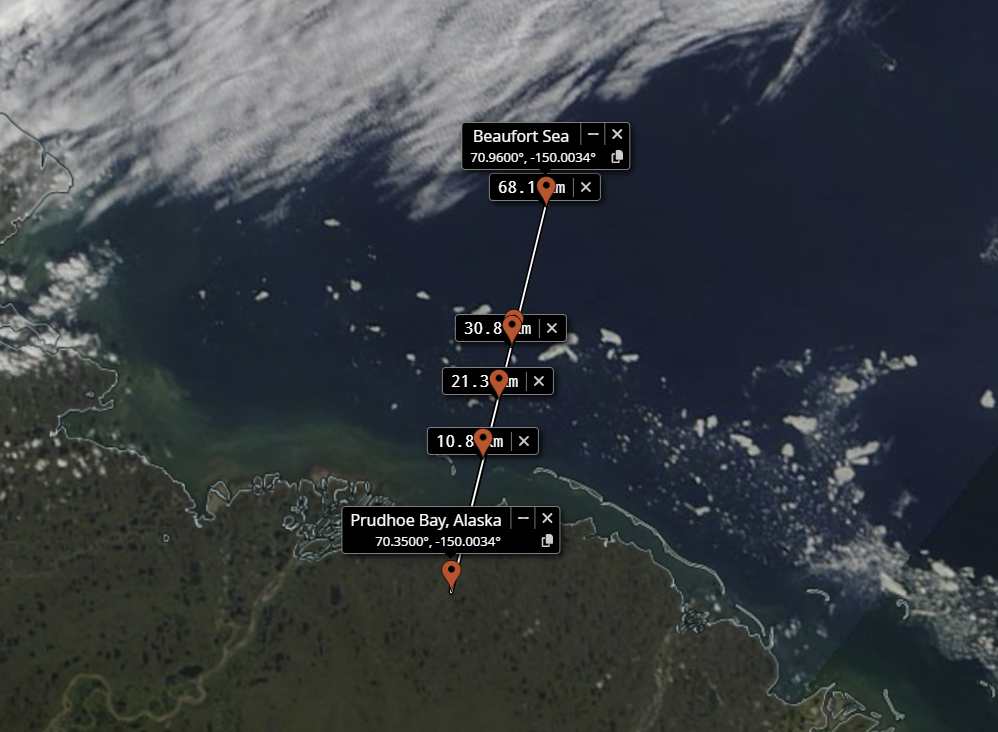

# Time

In [ ]:
print('Data starts at', moor_1['ds'].time[0])
print('Data ends at', moor_1['ds'].time[-1])

Data starts at <xarray.DataArray 'time' ()>
array('2023-04-18T18:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2023-04-18T18:00:00
Data ends at <xarray.DataArray 'time' ()>
array('2023-09-20T20:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2023-09-20T20:00:00


In [ ]:
# MANUAL DECISION of Mooring 1's start and end dates
moor_1['moor_start'] = dt.datetime(2023, 4, 18, 18, 0, 0)
moor_1['moor_end'] = dt.datetime(2023, 9, 20, 20, 0, 0)

In [ ]:
print('Data starts at', moor_2['ds'].time[0])
print('Data ends at', moor_2['ds'].time[-1])

Data starts at <xarray.DataArray 'time' ()>
array('2023-04-18T19:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2023-04-18T19:00:00
Data ends at <xarray.DataArray 'time' ()>
array('2023-09-20T21:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2023-09-20T21:00:00


In [ ]:
# MANUAL DECISION of Mooring 2's start and end dates
moor_2['moor_start'] = dt.datetime(2023, 4, 18, 19, 0, 0)
moor_2['moor_end'] = dt.datetime(2023, 9, 20, 21, 0, 0)

In [ ]:
print('Data starts at', moor_3['ds'].time[0])
print('Data ends at', moor_3['ds'].time[-1])

Data starts at <xarray.DataArray 'time' ()>
array('2023-04-18T20:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2023-04-18T20:00:00
Data ends at <xarray.DataArray 'time' ()>
array('2023-09-20T22:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2023-09-20T22:00:00


In [ ]:
# MANUAL DECISION of Mooring 3's start and end dates
moor_3['moor_start'] = dt.datetime(2023, 4, 18, 20, 0, 0)
moor_3['moor_end'] = dt.datetime(2023, 9, 20, 22, 0, 0)

In [ ]:
for site in sites:
  print(site['Moor'], 'data spans from ', site['moor_start'], ' to ', site['moor_end'])

Mooring 1 data spans from  2023-04-18 18:00:00  to  2023-09-20 20:00:00
Mooring 2 data spans from  2023-04-18 19:00:00  to  2023-09-20 21:00:00
Mooring 3 data spans from  2023-04-18 20:00:00  to  2023-09-20 22:00:00


In [ ]:
for site in sites:
  site['era5'] = sel_time(site['era5'], site['moor_start'], site['moor_end'])

# Depth Filtered

<Axes: ylabel='depth (m)'>

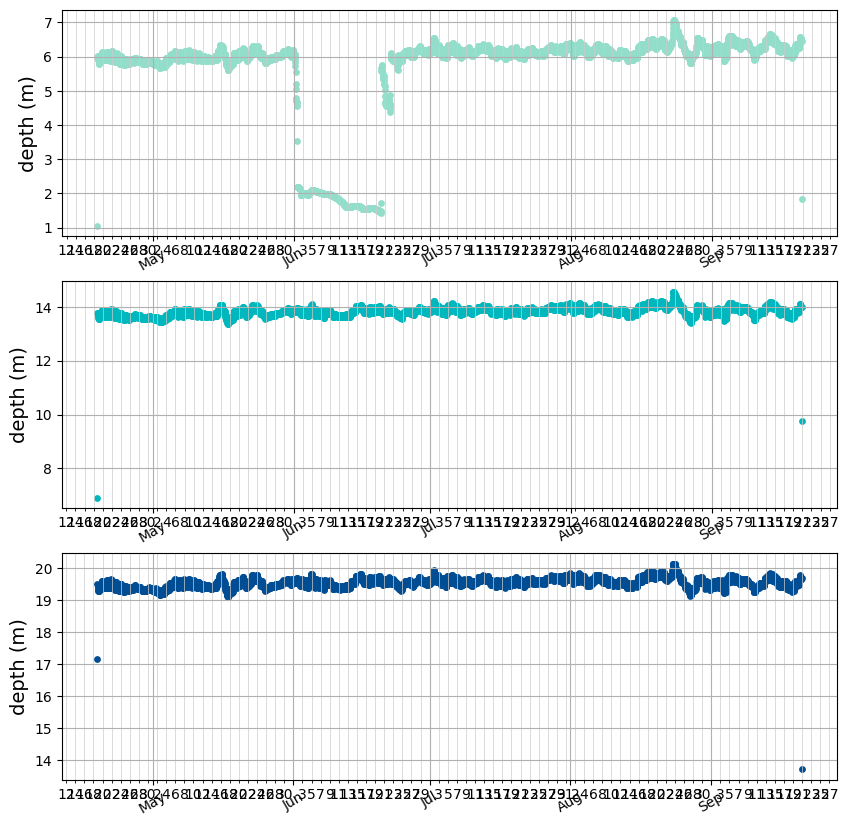

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
time_series_singular(ax1, moor_1, 'ds', 'D')
time_series_singular(ax2, moor_2, 'ds', 'D')
time_series_singular(ax3, moor_3, 'ds', 'D')

In [ ]:
# MANUAL DECISION of each moorings depth filter cut off from observations of the output from cell above
moor_1['depth filter'] = 5.57
moor_2['depth filter'] = 13
moor_3['depth filter'] = 19
for site in sites:
  site['depth filtered'] = site['ds'].where(site['ds']['D'] > site['depth filter'])

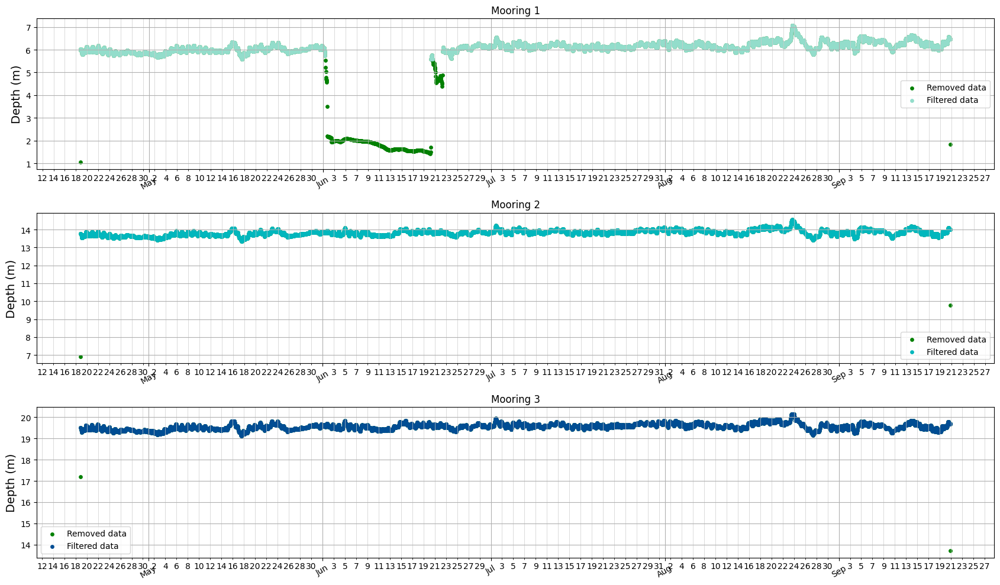

In [ ]:
fig, axes = fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(17, 10))

for di, site in enumerate(sites):
  ax = axes[di]
  ax.scatter(site['ds'].time, site['ds'].D, marker='.', s=60, color='green', label='Removed data')
  ax.scatter(site['depth filtered'].time, site['depth filtered'].D, marker='.', s=60, color=site['fig color'], label='Filtered data')
  time_series_axis(ax)
  ax.set_title(site['Moor'])
  y_label = 'Depth (m)'
  ax.set_ylabel(y_label, fontsize=14)
  ax.legend()
plt.tight_layout()

<Axes: ylabel='depth (m)'>

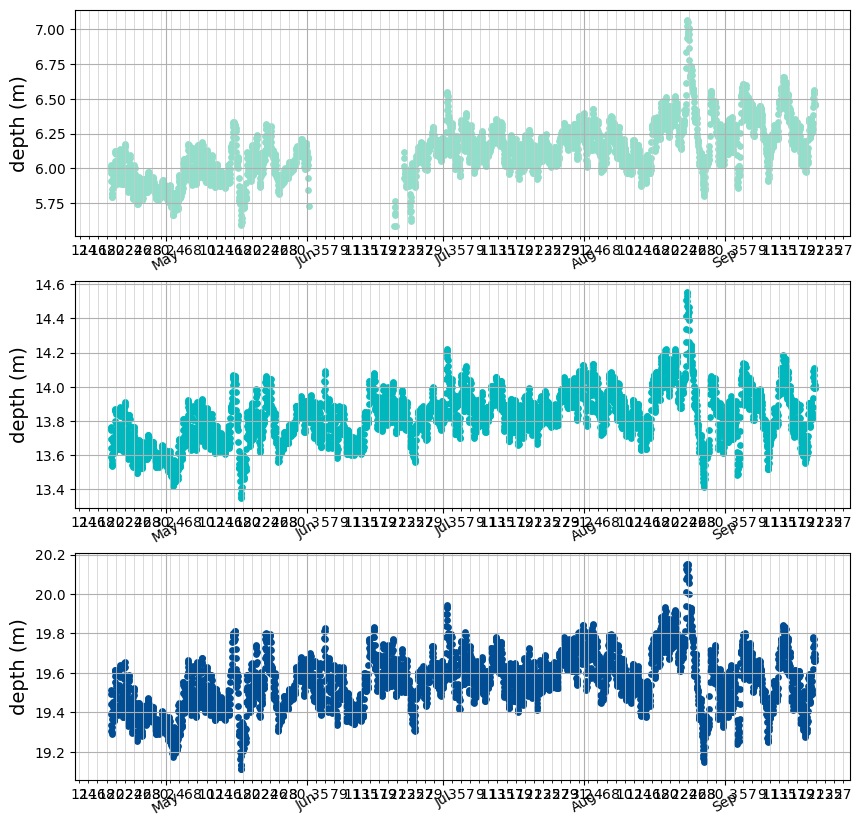

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
time_series_singular(ax1, moor_1, 'depth filtered', 'D')
time_series_singular(ax2, moor_2, 'depth filtered', 'D')
time_series_singular(ax3, moor_3, 'depth filtered', 'D')

In [ ]:
for site in sites:
  av = np.nanmean(site['depth filtered']['D'])
  print(site['Moor'] + ' average depth ' + str(av))
  min = np.nanmin(site['depth filtered']['Hs'])
  print(site['Moor'] + ' minimum significant wave height ' + str(min))

Mooring 1 average depth 6.124684617323941
Mooring 1 minimum significant wave height 0.002019940849224246
Mooring 2 average depth 13.821949430445427
Mooring 2 minimum significant wave height 0.02444442208881535
Mooring 3 average depth 19.553318195800138
Mooring 3 minimum significant wave height 0.014158235671447299


# Merge mooring and ERA5 data into one xarray
successfully merged data by rounding the mooring data in the xarray code to hours because a few were decimals off

In [ ]:
for site in sites:
  site['combined'] = site['depth filtered'].combine_first(site['era5'])
  # To check
  print('For', site['Moor'])
  print('Mooring data length: ', len(site['depth filtered'].time))
  print('ERA5 data length: ', len(site['era5'].time))
  print('Combined data length: ', len(site['combined'].time), '\n')

For Mooring 1
Mooring data length:  3723
ERA5 data length:  3723
Combined data length:  3723 

For Mooring 2
Mooring data length:  3723
ERA5 data length:  3723
Combined data length:  3723 

For Mooring 3
Mooring data length:  3723
ERA5 data length:  3723
Combined data length:  3723 



# Fetch Estimation


$E=\frac{g^2{H_s}^2}{16U^4}$<br>

$X = \frac{gx}{U^2}\rightarrow x = \frac{XU^2}{g}$<br>

$E= AX^a$<br>

$H_s=sig wave height$<br>
$g=9.81 \frac{m}{s^2}$<br>
$U=windspeed (\frac{m}{s})$<br>
$x=fetch(m)$<br>
$A=1.6 × 10^{-7} → 1.3 × 10^{-6}$<br>
$a=0.75 \rightarrow 1.00$

In [ ]:
g = 9.8 # [m/s^2]
A = 1.7 * 10**-7
a = 0.98

for site in sites:
  comb = site['combined']

  comb['E_nondim'] = g**2 * comb.Hs**2 / (16 * comb.wspd**4)
  comb['E_nondim'].attrs['units'] = ''
  comb['E_nondim'].attrs['long_name'] = 'Nondimensional Wave Energy'
  comb['E_nondim'].attrs['calculated from'] = '(g^2)(Hs^2)/16(U^4)'

  comb['X_nondim'] = (comb.E_nondim / A)**(1/a)
  comb['X_nondim'].attrs['units'] = ''
  comb['X_nondim'].attrs['long_name'] = 'Nondimensional Fetch'
  comb['X_nondim'].attrs['calculated from'] = '(E_nondim/A)^(1/a)'

  comb['x'] = comb.X_nondim * comb.wspd**2 / g
  comb['x'].attrs['units'] = 'm'
  comb['x'].attrs['long_name'] = 'Estimated Fetch Length'
  comb['x'].attrs['calculated from'] = '(XU^2)/g'

  comb['x_km'] = comb.x / 1000
  comb['x_km'].attrs['units'] = 'km'
  comb['x_km'].attrs['long_name'] = 'Estimated Fetch Length'
  comb['x_km'].attrs['calculated from'] = 'x/1000'

# Onshore & Offshore Angles

In [ ]:
# Locations from Worldview

lat_west = 70.8771
lon_west = -152.4314
west = [lat_west, lon_west]

lat_east = 70.4282
lon_east = -148.5185
east = [lat_east, lon_east]
print("Western point: ", west)
print('Eastern point: ', east)

low_onshore = angle_between2((lon_east-lon_west, lat_east-lat_west))
high_onshore = low_onshore + 180
print('Angles between', low_onshore,'° and', high_onshore, '° are offshore winds')
print('Angles outside of', low_onshore,'° and', high_onshore, '° are onshore winds')

Western point:  [70.8771, -152.4314]
Eastern point:  [70.4282, -148.5185]
Angles between 96.54453752616757 ° and 276.5445375261676 ° are offshore winds
Angles outside of 96.54453752616757 ° and 276.5445375261676 ° are onshore winds


Times where all three moorings have estimated fetches<br>
- 2023-08-19T06
- 2023-08-20T09
- 2023-09-05T08
- 2023-09-19T02

# Calculating Celerity & Wave Age

In [ ]:
def calculate_wavelength(T, d, g=9.81, tolerance=1e-6, max_iterations=1000):
    """
    Calculate wavelength using the dispersion relation for gravity waves.

    Parameters:
    - T: Wave period (in seconds)
    - d: Water depth (in meters)
    - g: Acceleration due to gravity (m/s^2), default is 9.81 m/s^2
    - tolerance: Tolerance for the iterative solution convergence
    - max_iterations: Maximum number of iterations to prevent infinite loops

    Returns:
    - L: Wavelength (in meters)
    """
    if np.isnan(T) == True:
      return np.nan
    elif np.isnan(d) == True:
      return np.nan
    else:
      L_guess = g * T**2 / (2 * np.pi)  # Initial guess based on deep water
      for _ in range(max_iterations):
          L_next = (g * T**2 / (2 * np.pi)) * np.tanh(2 * np.pi * d / L_guess)
          if abs(L_next - L_guess) < tolerance:
              return L_next
          L_guess = L_next
      raise Exception("Failed to converge after maximum number of iterations")

# Example usage
T = 20  # Wave period in seconds
d = np.nan  # Water depth in meters
wavelength = calculate_wavelength(T, d)
print(f"Wavelength: {wavelength} meters")

Wavelength: nan meters


In [ ]:
for site in sites:
  comb = site['combined']

  comb['L'] = 0*comb.x_km # Placeholder for the for loop to become time dependent
  comb['L'].attrs['units'] = 'm'
  comb['L'].attrs['long_name'] = 'Wavelength'
  comb['L'].attrs['calculated from'] = 'L = (g*Tp**2/(2*np.pi))*np.tanh(2*np.pi*D/L)'
  for di, i in enumerate(comb.time):
    comb.L[di] = calculate_wavelength(comb.Tp[di], comb.D[di])

  comb['C'] = comb.L/comb.Tp
  comb['C'].attrs['units'] = 'm/s'
  comb['C'].attrs['long_name'] = 'Wave celerity'
  comb['C'].attrs['calculated from'] = 'L/T'

  comb['C/wspd'] = comb.C/comb.wspd
  comb['C/wspd'].attrs['units'] = ''
  comb['C/wspd'].attrs['long_name'] = 'Nondimensional wave age'
  comb['C/wspd'].attrs['calculated from'] = 'C/wspd'

In [ ]:
moor_1['combined']

<xarray.Dataset>
Dimensions:    (time: 3723, frequency: 1799)
Coordinates:
  * time       (time) datetime64[ns] 2023-04-18T18:00:00 ... 2023-09-20T20:00:00
  * frequency  (frequency) float64 0.0008333 0.001389 0.001944 ... 0.9992 0.9997
    longitude  float32 -150.0
    latitude   float32 70.75
Data variables: (12/24)
    E          (time, frequency) float64 nan nan nan nan nan ... nan nan nan nan
    Lat        (time) float64 nan 70.56 70.56 70.56 ... 70.56 70.56 70.56 nan
    Lon        (time) float64 nan -150.0 -150.0 -150.0 ... -150.0 -150.0 nan
    Temp       (time) float64 nan -1.957 -1.974 -1.972 ... 2.184 2.184 2.184 nan
    Hs         (time) float64 nan 0.004156 0.006829 ... 0.5351 0.5836 nan
    Tp         (time) float64 nan nan nan nan nan ... 6.99 7.045 6.091 6.883 nan
    ...         ...
    X_nondim   (time) float64 nan 100.8 120.0 31.68 ... 2.976e+03 3.4e+03 nan
    x          (time) float64 nan 26.5 47.58 16.95 ... 1.918e+04 2.238e+04 nan
    x_km       (time) float64 nan 0.0265 0.04758 0.01695 ... 19.18 22.38 nan
    L          (time) float64 nan nan nan nan nan ... 50.73 51.16 42.8 49.76 nan
    C          (time) float64 nan nan nan nan nan ... 7.261 7.026 7.229 nan
    C/wspd     (time) float64 nan nan nan nan nan ... 0.9401 0.8843 0.9001 nan
Attributes:
    creation_date:  2024/02/08
    author:         M Sangillo
    email:          mcsangillo@wpi.edu
    Site:           Site 1

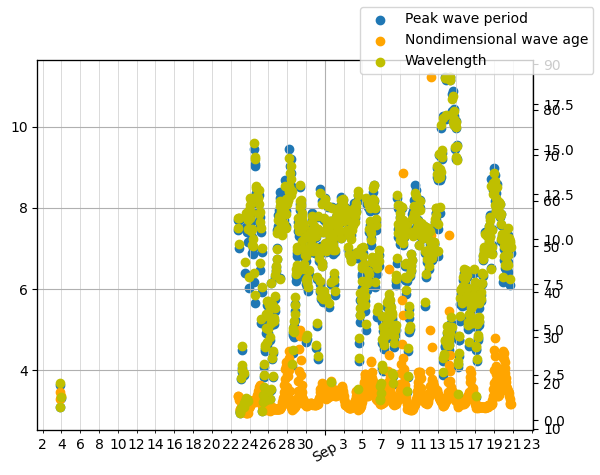

In [ ]:
fig, ax1 = plt.subplots()

ax1.scatter(moor_1['combined'].time, moor_1['combined'].Tp, label='Peak wave period')
#ax3 = ax1.twinx()
#ax3.scatter(moor_1['combined'].time, moor_1['combined'].D, color='r', label='Depth')
ax4 = ax1.twinx()
ax4.scatter(moor_1['combined'].time, moor_1['combined']['C/wspd'], color='orange', label='Nondimensional wave age')
ax2 = ax1.twinx()
ax2.scatter(moor_1['combined'].time, moor_1['combined'].L, color='y', label='Wavelength')
time_series_axis(ax1)
fig.legend()

# Shortening time frame

In [ ]:
Aug01 = dt.datetime(2023, 7, 31, 0, 0, 0)
Jul15 = dt.datetime(2023, 7, 15, 0, 0, 0)
Aug15 = dt.datetime(2023, 8, 15, 0, 0, 0)
end = dt.datetime(2023, 9, 20, 0, 0, 0)

for site in sites:
  site['Jul-end moor'] = sel_time(site['ds'], Jul15, end)
  site['Aug-end moor'] = sel_time(site['ds'], Aug01, end)
  site['Jul-end era5'] = sel_time(site['era5'], Jul15, end)
  site['Aug-end era5'] = sel_time(site['era5'], Aug01, end)
  site['Jul-end'] = sel_time(site['combined'], Jul15, end)
  site['Aug-end'] = sel_time(site['combined'], Aug01, end)

# Time Series | Individual Moorings

In [ ]:
'''
site = moor_1
fig = time_series(2, 2, site['ds'], ['Hs', 'Tp', 'Temp', 'D'])
fig.suptitle(site['Moor'])
'''

"\nsite = moor_1\nfig = time_series(2, 2, site['ds'], ['Hs', 'Tp', 'Temp', 'D'])\nfig.suptitle(site['Moor'])\n"

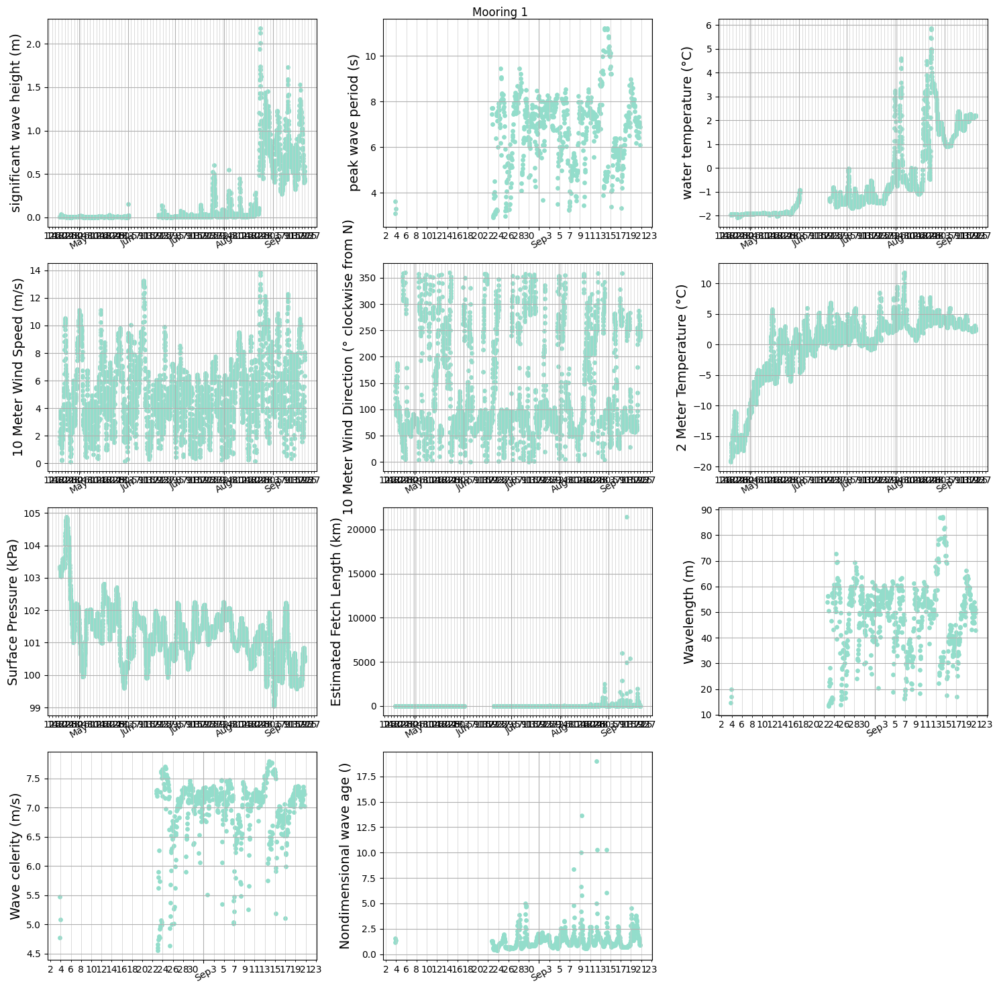

In [ ]:
moor_dict = moor_1
fig = time_series(4, 3, moor_dict, 'combined', ['Hs', 'Tp', 'Temp', 'wspd', 'wdir', 't2m_C', 'sp_kPa', 'x_km', 'L', 'C', 'C/wspd'])
fig.suptitle(moor_dict['Moor'])
plt.tight_layout()

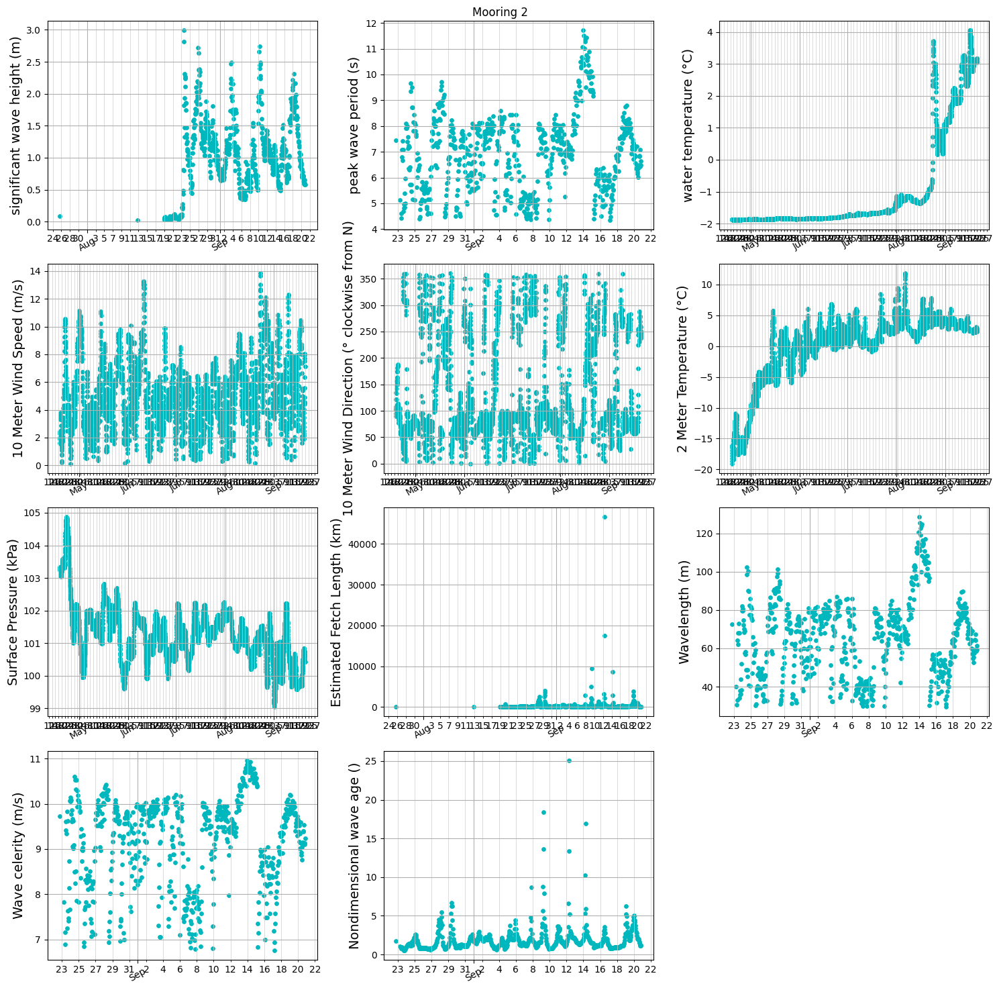

In [ ]:
moor_dict = moor_2
fig = time_series(4, 3, moor_dict, 'combined', ['Hs', 'Tp', 'Temp', 'wspd', 'wdir', 't2m_C', 'sp_kPa', 'x_km', 'L', 'C', 'C/wspd'])
fig.suptitle(moor_dict['Moor'])
plt.tight_layout()

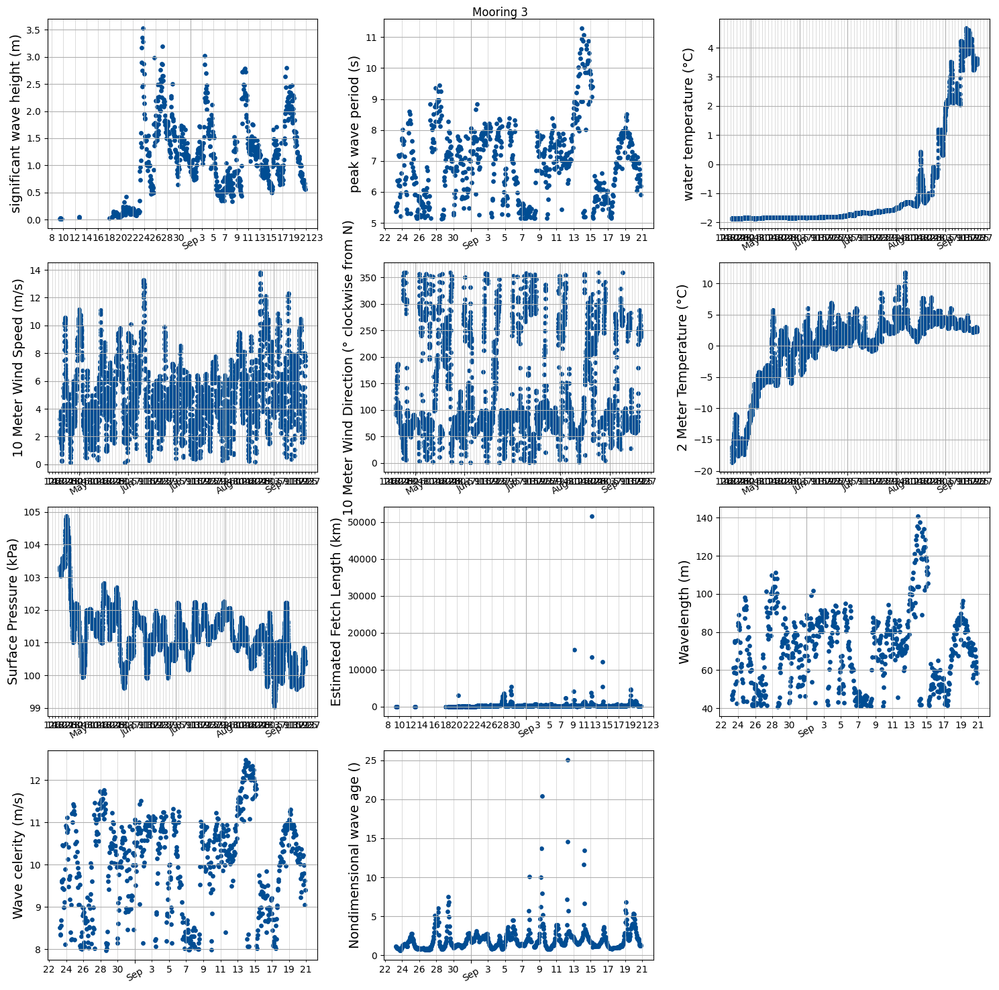

In [ ]:
moor_dict = moor_3
fig = time_series(4, 3, moor_dict, 'combined', ['Hs', 'Tp', 'Temp', 'wspd', 'wdir', 't2m_C', 'sp_kPa', 'x_km', 'L', 'C', 'C/wspd'])
fig.suptitle(moor_dict['Moor'])
plt.tight_layout()

In [ ]:
'''
fig, ax = plt.subplots(1,1)
ax.scatter(moor_1['era5'].time, moor_1['era5'].sp_kPa, marker='.', label=moor_1['Moor'])
ax.scatter(moor_2['era5'].time, moor_2['era5'].sp_kPa, marker='.', label=moor_2['Moor'])
ax.scatter(moor_3['era5'].time, moor_3['era5'].sp_kPa, marker='.', label=moor_3['Moor'])
ax.set_title('Comparison of ERA5 Data')
time_series_axis(ax)
ax.legend()
'''

"\nfig, ax = plt.subplots(1,1)\nax.scatter(moor_1['era5'].time, moor_1['era5'].sp_kPa, marker='.', label=moor_1['Moor'])\nax.scatter(moor_2['era5'].time, moor_2['era5'].sp_kPa, marker='.', label=moor_2['Moor'])\nax.scatter(moor_3['era5'].time, moor_3['era5'].sp_kPa, marker='.', label=moor_3['Moor'])\nax.set_title('Comparison of ERA5 Data')\ntime_series_axis(ax)\nax.legend()\n"

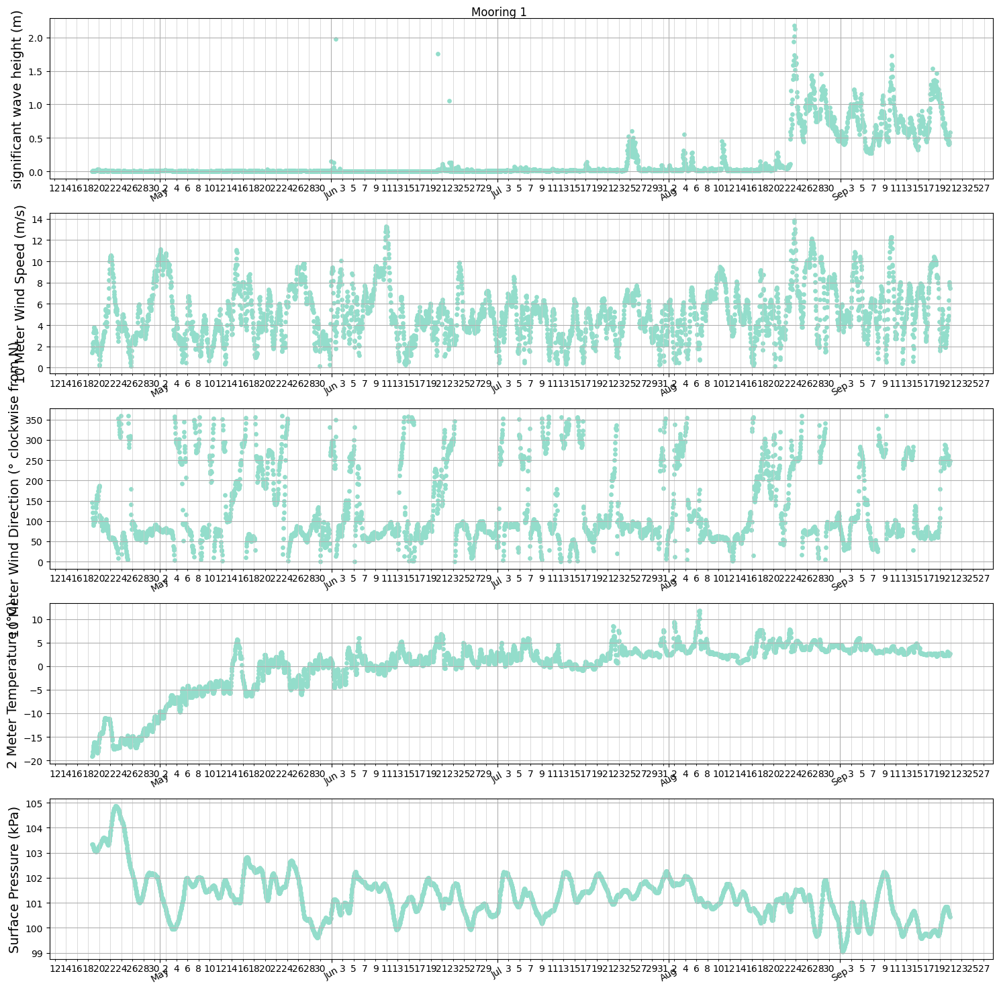

In [ ]:
moor_dict = moor_1
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(15, 15))
time_series_singular(ax1, moor_dict, 'ds', 'Hs')

time_series_singular(ax2, moor_dict, 'era5', 'wspd')
time_series_singular(ax3, moor_dict, 'era5', 'wdir')
time_series_singular(ax4, moor_dict, 'era5', 't2m_C')
time_series_singular(ax5, moor_dict ,'era5', 'sp_kPa')
for ax in (ax1, ax2, ax3, ax4, ax5):
  time_series_axis(ax)
fig.suptitle(moor_dict['Moor'])
plt.tight_layout()

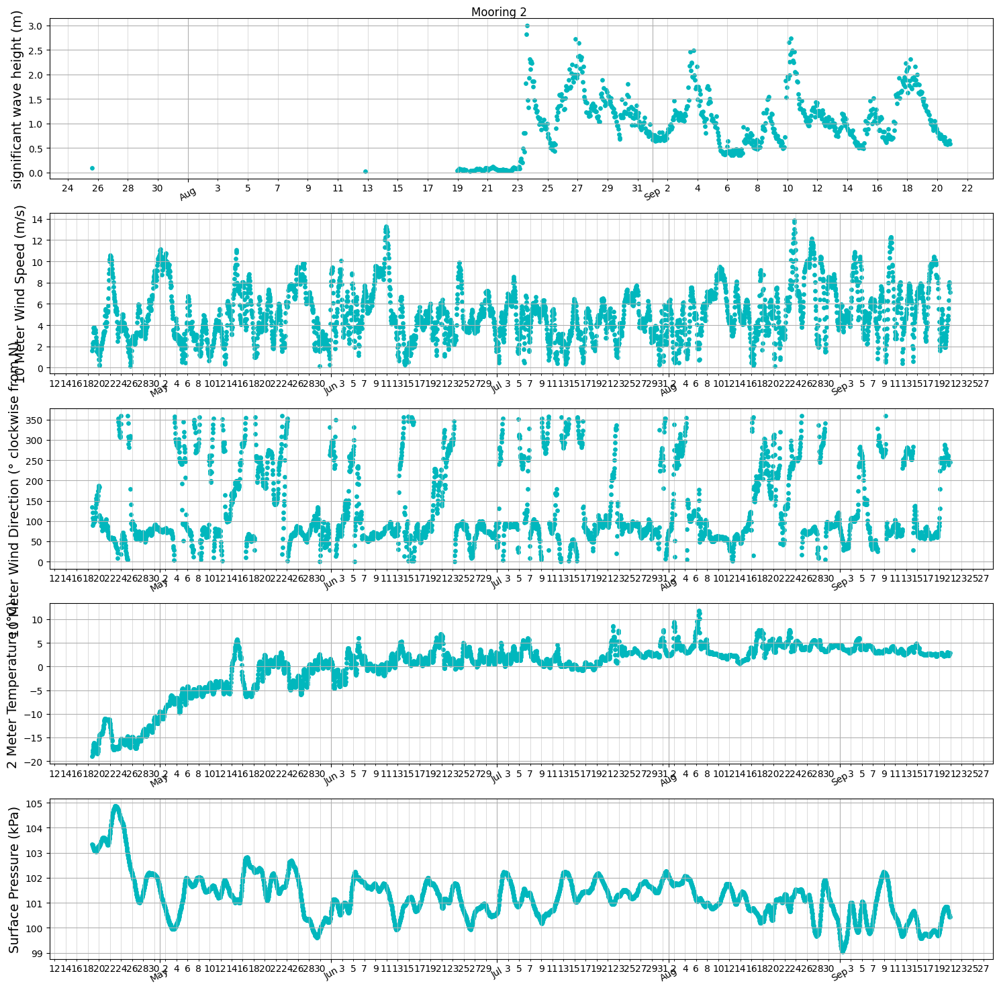

In [ ]:
moor_dict = moor_2
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(15, 15))
time_series_singular(ax1, moor_dict, 'ds', 'Hs')

time_series_singular(ax2, moor_dict, 'era5', 'wspd')
time_series_singular(ax3, moor_dict, 'era5', 'wdir')
time_series_singular(ax4, moor_dict, 'era5', 't2m_C')
time_series_singular(ax5, moor_dict, 'era5', 'sp_kPa')
for ax in (ax1, ax2, ax3, ax4, ax5):
  time_series_axis(ax)
fig.suptitle(moor_dict['Moor'])
plt.tight_layout()

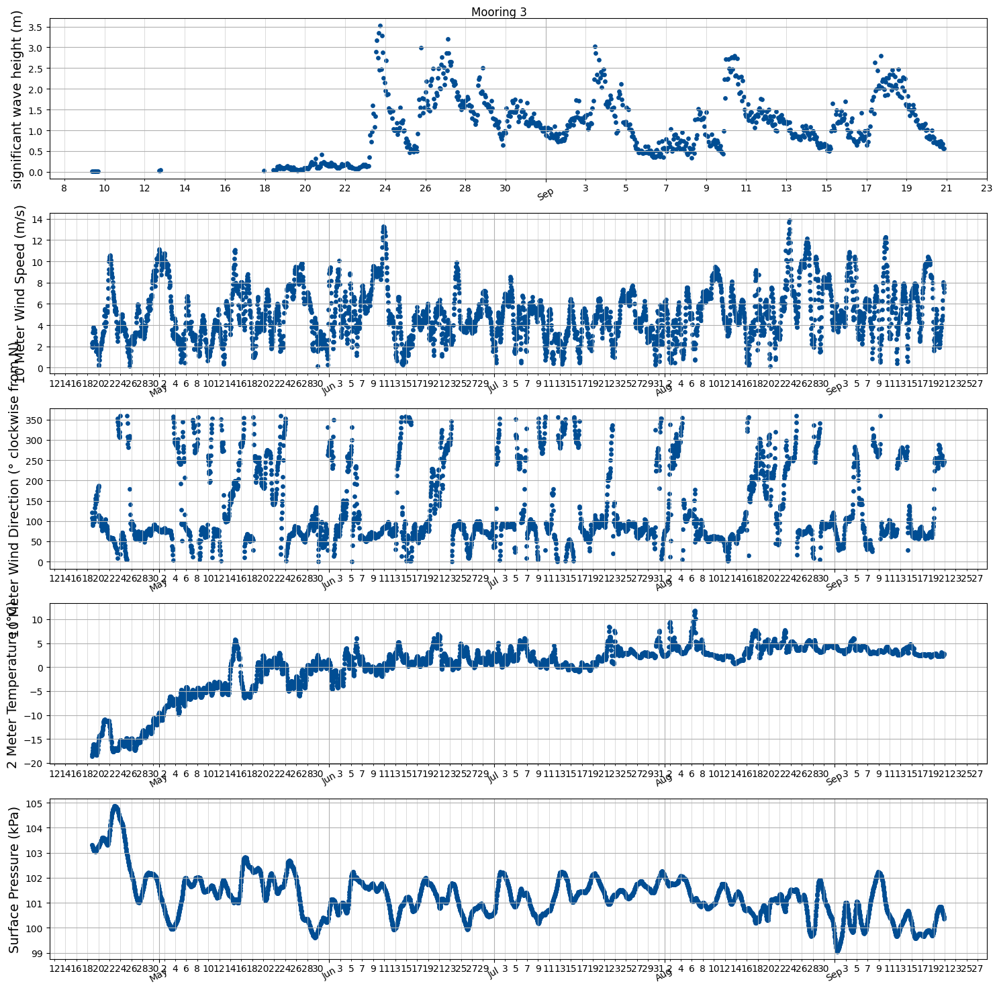

In [ ]:
moor_dict = moor_3
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(15, 15))
time_series_singular(ax1, moor_dict, 'ds', 'Hs')

time_series_singular(ax2, moor_dict, 'era5', 'wspd')
time_series_singular(ax3, moor_dict, 'era5', 'wdir')
time_series_singular(ax4, moor_dict, 'era5', 't2m_C')
time_series_singular(ax5, moor_dict, 'era5', 'sp_kPa')
for ax in (ax1, ax2, ax3, ax4, ax5):
  time_series_axis(ax)
fig.suptitle(moor_dict['Moor'])
plt.tight_layout()

In [ ]:
moor_1['combined']

<xarray.Dataset>
Dimensions:    (time: 3723, frequency: 1799)
Coordinates:
  * time       (time) datetime64[ns] 2023-04-18T18:00:00 ... 2023-09-20T20:00:00
  * frequency  (frequency) float64 0.0008333 0.001389 0.001944 ... 0.9992 0.9997
    longitude  float32 -150.0
    latitude   float32 70.75
Data variables: (12/24)
    E          (time, frequency) float64 nan nan nan nan nan ... nan nan nan nan
    Lat        (time) float64 nan 70.56 70.56 70.56 ... 70.56 70.56 70.56 nan
    Lon        (time) float64 nan -150.0 -150.0 -150.0 ... -150.0 -150.0 nan
    Temp       (time) float64 nan -1.957 -1.974 -1.972 ... 2.184 2.184 2.184 nan
    Hs         (time) float64 nan 0.004156 0.006829 ... 0.5351 0.5836 nan
    Tp         (time) float64 nan nan nan nan nan ... 6.99 7.045 6.091 6.883 nan
    ...         ...
    X_nondim   (time) float64 nan 100.8 120.0 31.68 ... 2.976e+03 3.4e+03 nan
    x          (time) float64 nan 26.5 47.58 16.95 ... 1.918e+04 2.238e+04 nan
    x_km       (time) float64 nan 0.0265 0.04758 0.01695 ... 19.18 22.38 nan
    L          (time) float64 nan nan nan nan nan ... 50.73 51.16 42.8 49.76 nan
    C          (time) float64 nan nan nan nan nan ... 7.261 7.026 7.229 nan
    C/wspd     (time) float64 nan nan nan nan nan ... 0.9401 0.8843 0.9001 nan
Attributes:
    creation_date:  2024/02/08
    author:         M Sangillo
    email:          mcsangillo@wpi.edu
    Site:           Site 1

# Time Series | Fetch v Variables | Mooring 1

In [ ]:
moor_dict = site = moor_1

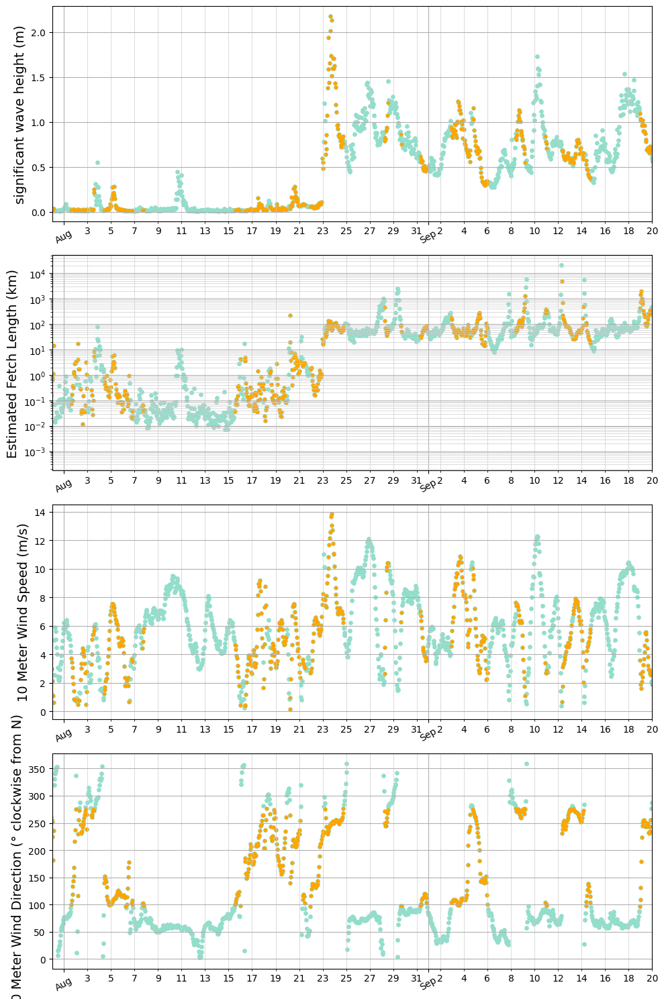

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(10, 15))
time_series_singular(ax1, moor_dict, 'combined', 'Hs')
time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')
time_series_singular(ax3, moor_dict, 'combined', 'wspd')
time_series_singular(ax4, moor_dict, 'combined', 'wdir')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['Hs'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), marker='.', color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), marker='.', color='orange')

ax3.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['wspd'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), marker='.', color='orange')

ax4.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['wdir'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), marker='.', color='orange')

for ax in (ax1, ax2, ax3, ax4):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

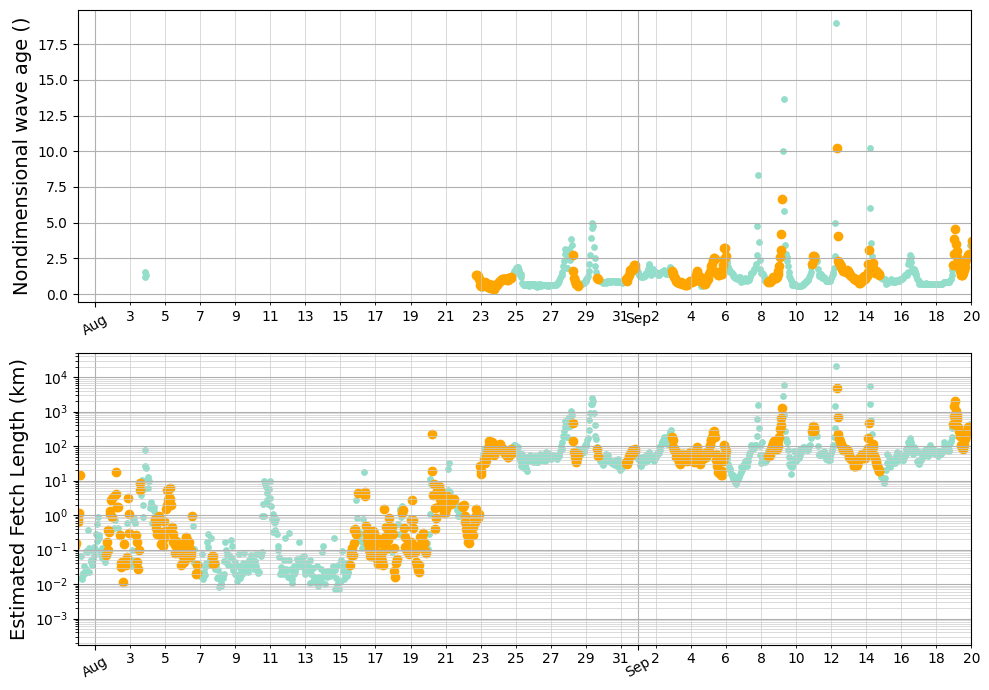

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'C/wspd')

time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['C/wspd'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

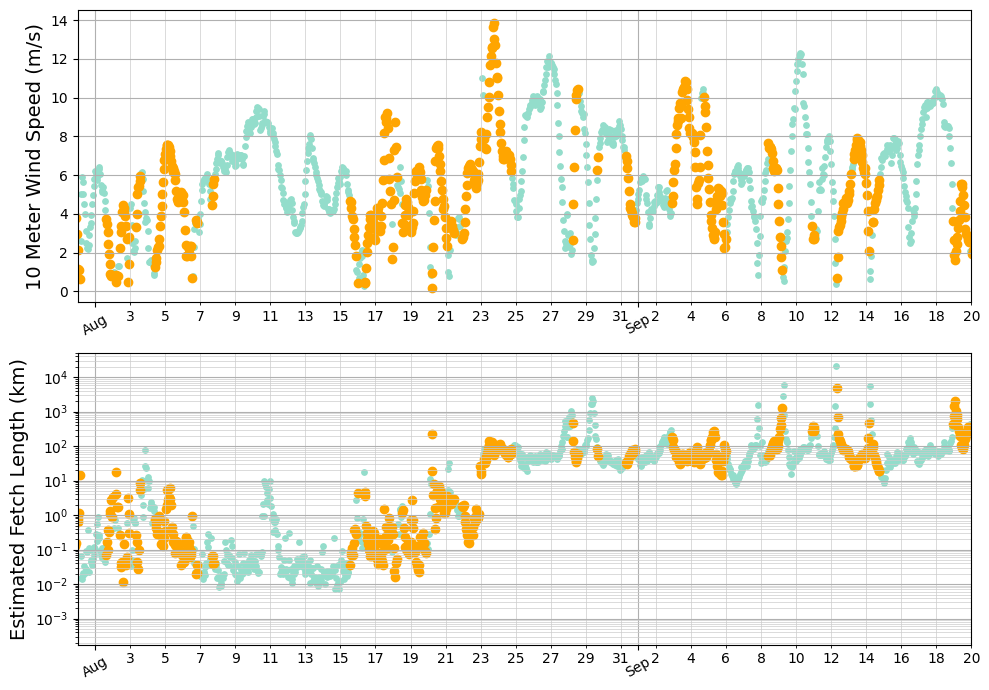

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'wspd')

time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['wspd'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

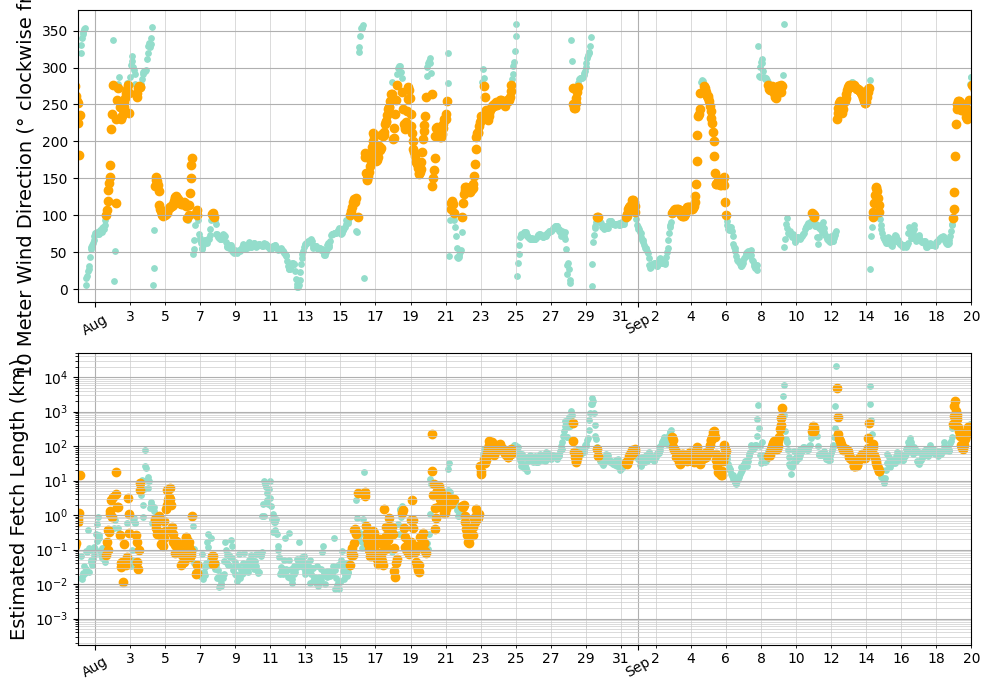

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'wdir')

time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['wdir'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

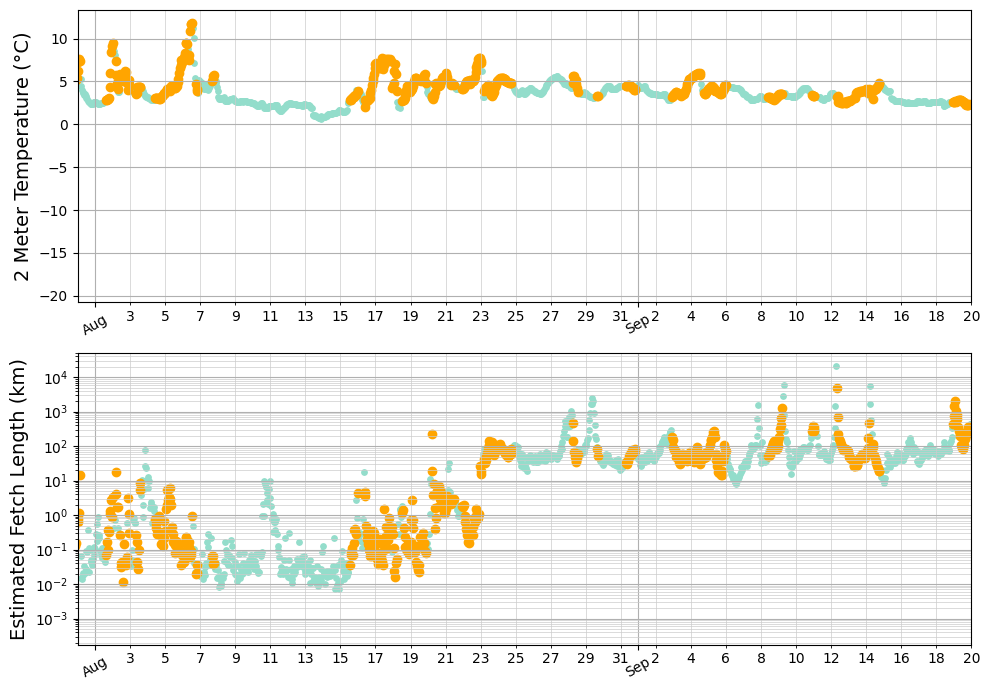

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 't2m_C')

time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['t2m_C'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

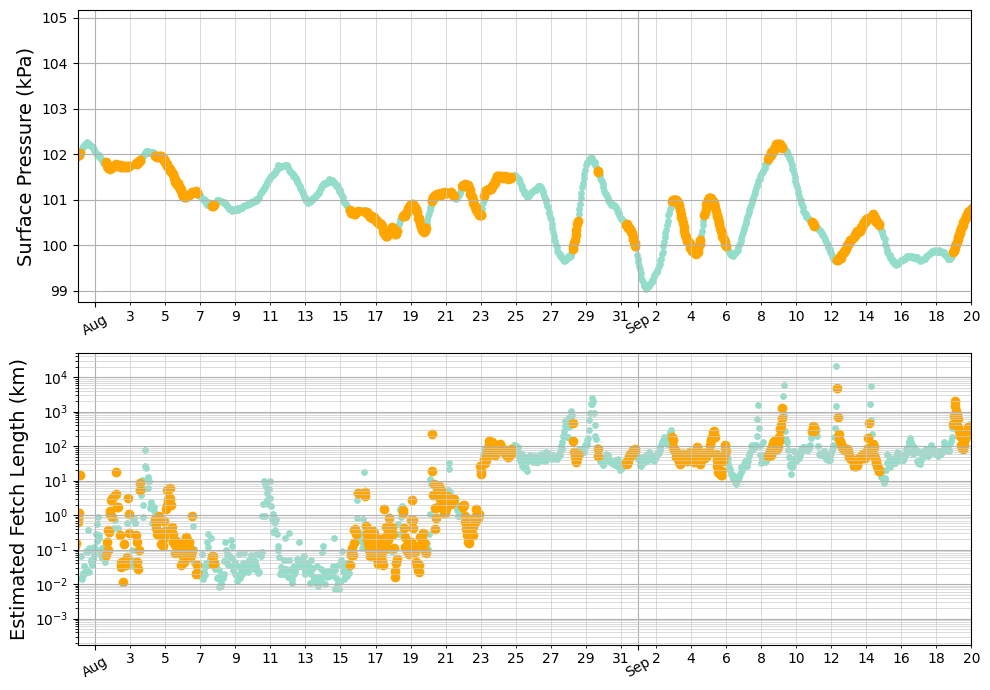

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'sp_kPa')

time_series_singular(ax2, moor_dict, 'combined', 'x_km')
ax2.set_yscale('log')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['sp_kPa'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

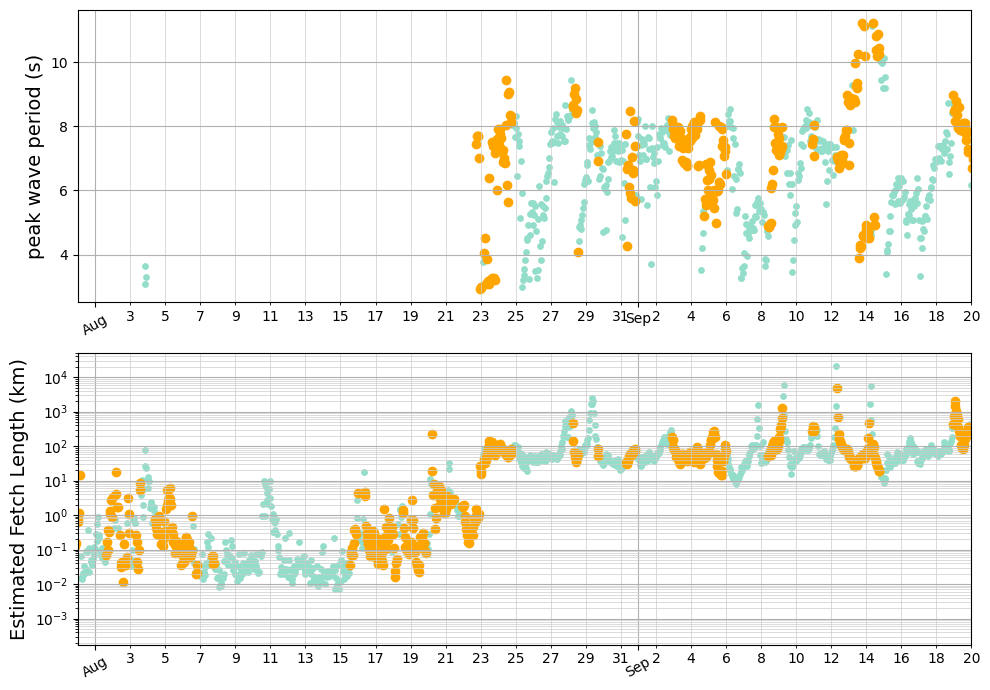

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'Tp')

time_series_singular(ax2, moor_dict, 'combined', 'x_km')
ax2.set_yscale('log')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['Tp'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

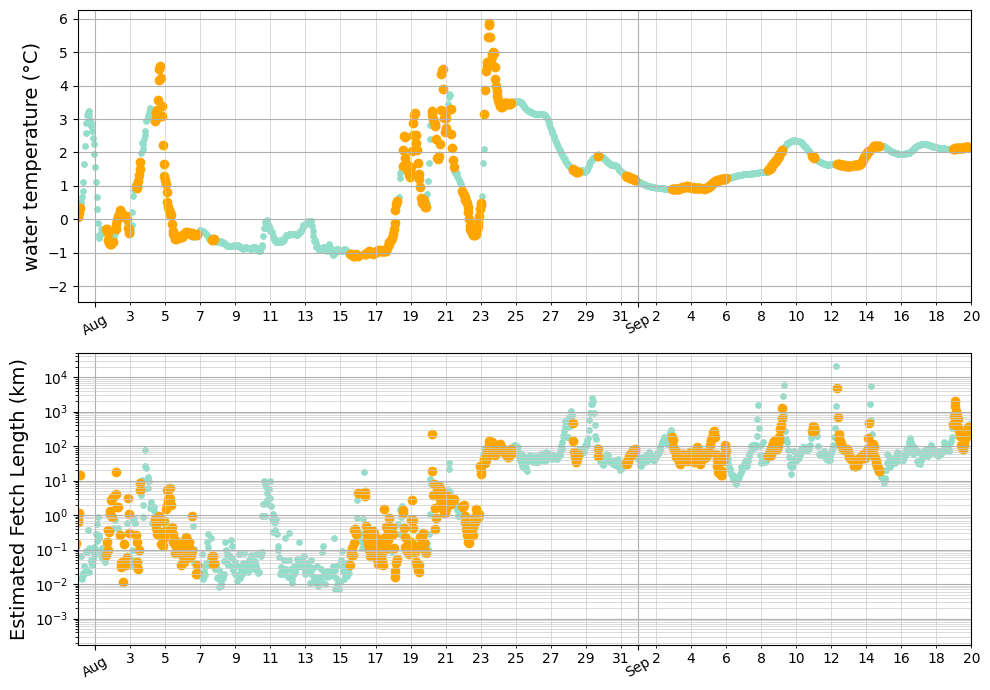

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'Temp')

time_series_singular(ax2, moor_dict, 'combined', 'x_km')
ax2.set_yscale('log')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['Temp'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

# Time Series | Fetch v Variables | Mooring 2

In [ ]:
moor_dict = site = moor_2

In [ ]:
# Locations from Worldview

lat_west = 70.8771
lon_west = -152.4314
west = [lat_west, lon_west]

lat_east = 70.4282
lon_east = -148.5185
east = [lat_east, lon_east]
print("Western point: ", west)
print('Eastern point: ', east)

low_onshore = angle_between2((lon_east-lon_west, lat_east-lat_west))
high_onshore = low_onshore + 180
print('Angles between', low_onshore,'° and', high_onshore, '° are offshore winds')
print('Angles outside of', low_onshore,'° and', high_onshore, '° are onshore winds')

Western point:  [70.8771, -152.4314]
Eastern point:  [70.4282, -148.5185]
Angles between 96.54453752616757 ° and 276.5445375261676 ° are offshore winds
Angles outside of 96.54453752616757 ° and 276.5445375261676 ° are onshore winds


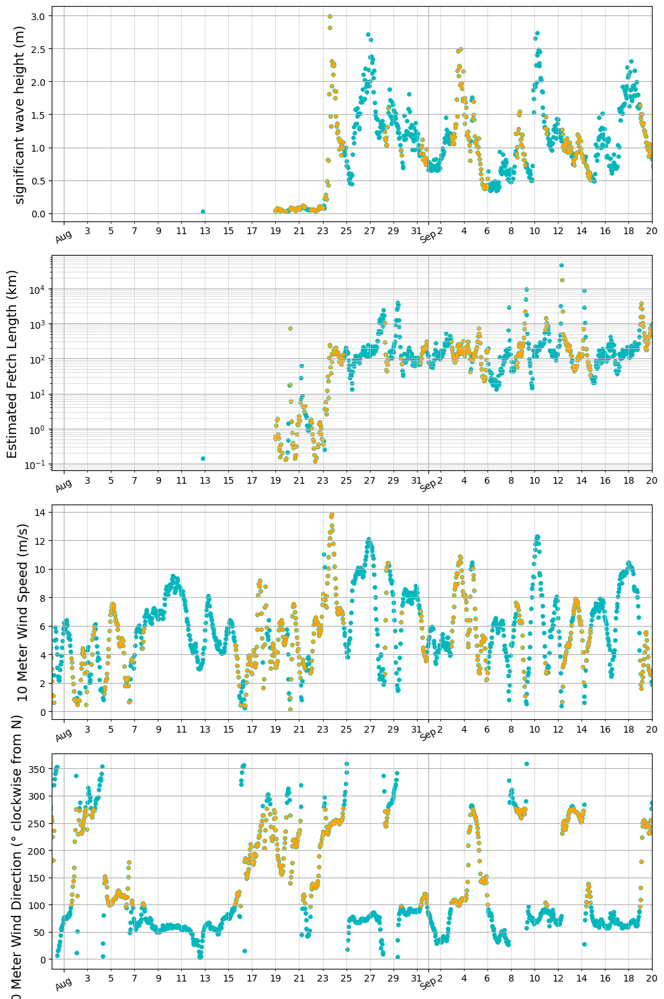

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(10, 15))
time_series_singular(ax1, moor_dict, 'combined', 'Hs')
time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')
time_series_singular(ax3, moor_dict, 'combined', 'wspd')
time_series_singular(ax4, moor_dict, 'combined', 'wdir')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['Hs'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), marker='.', color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), marker='.', color='orange')

ax3.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['wspd'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), marker='.', color='orange')

ax4.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['wdir'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), marker='.', color='orange')

for ax in (ax1, ax2, ax3, ax4):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

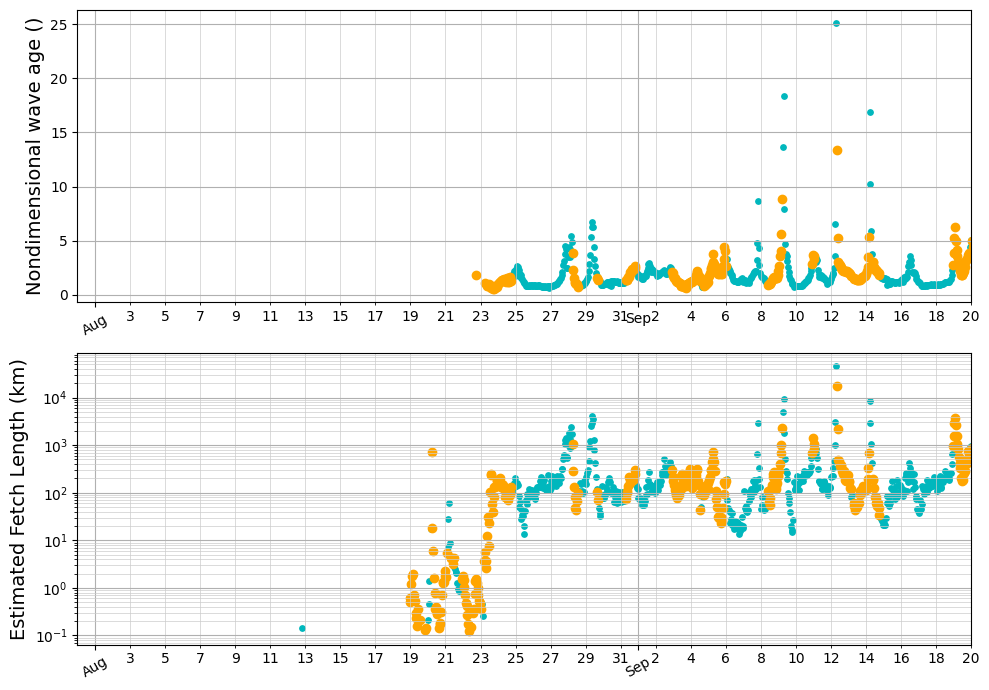

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'C/wspd')

time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['C/wspd'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

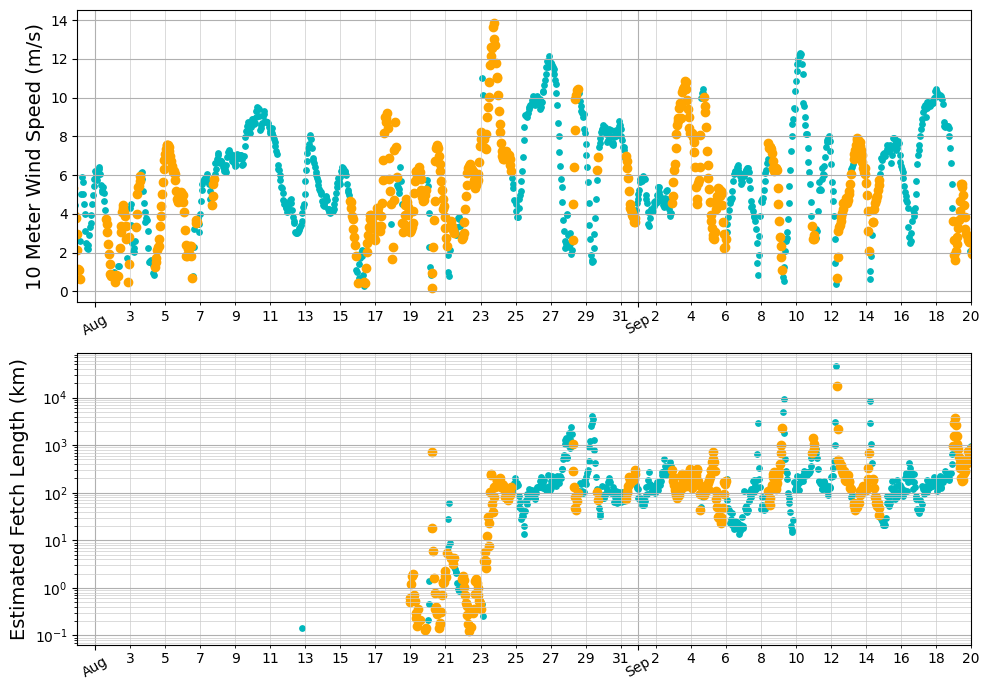

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'wspd')

time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['wspd'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

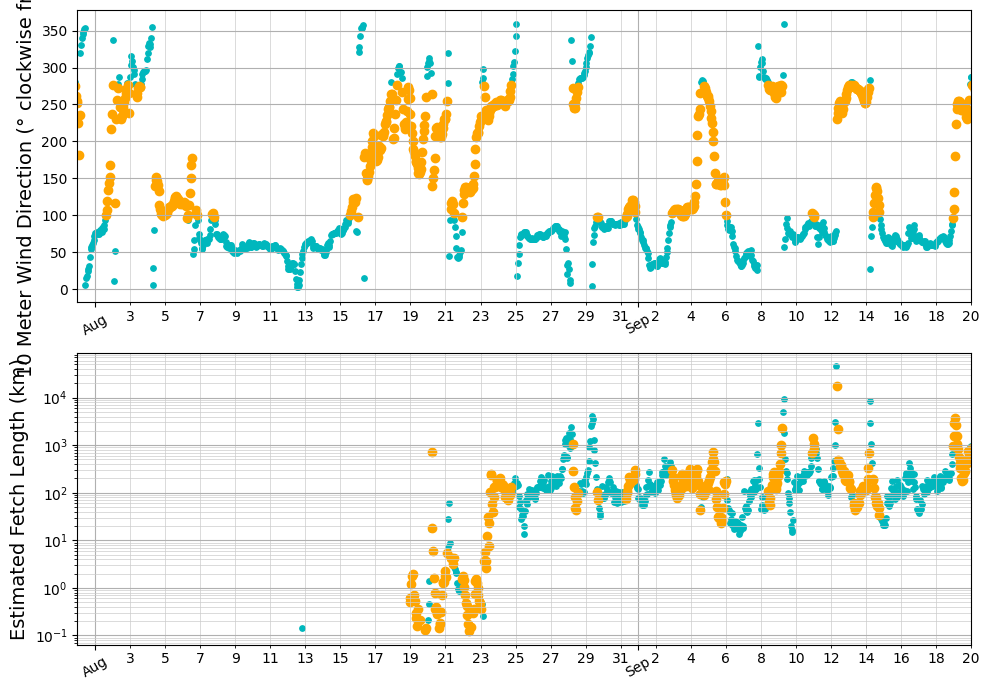

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'wdir')

time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['wdir'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

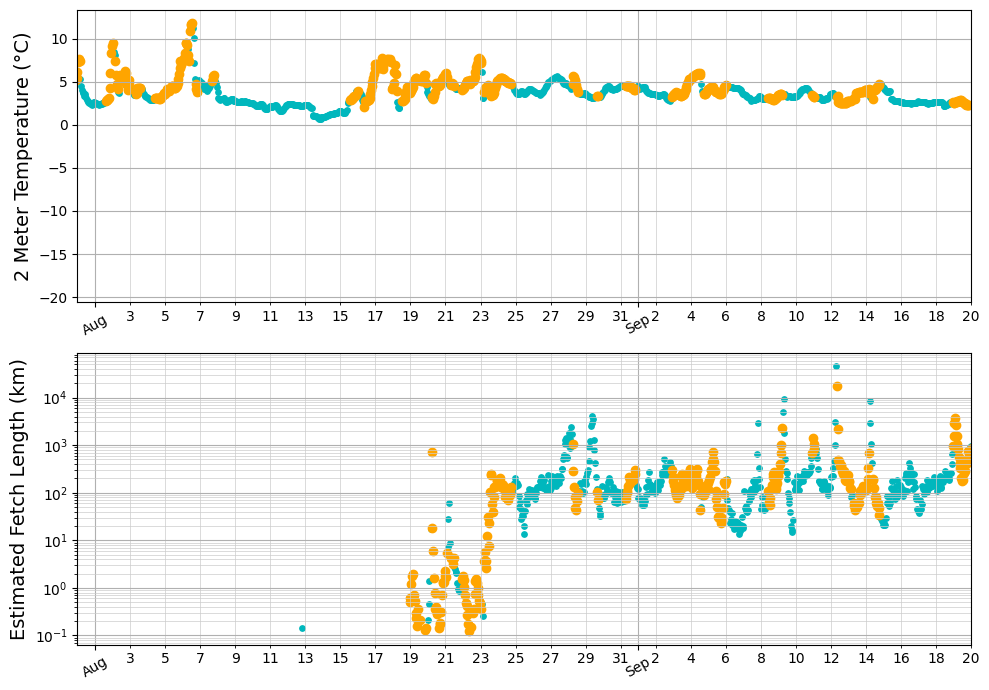

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 't2m_C')

time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['t2m_C'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

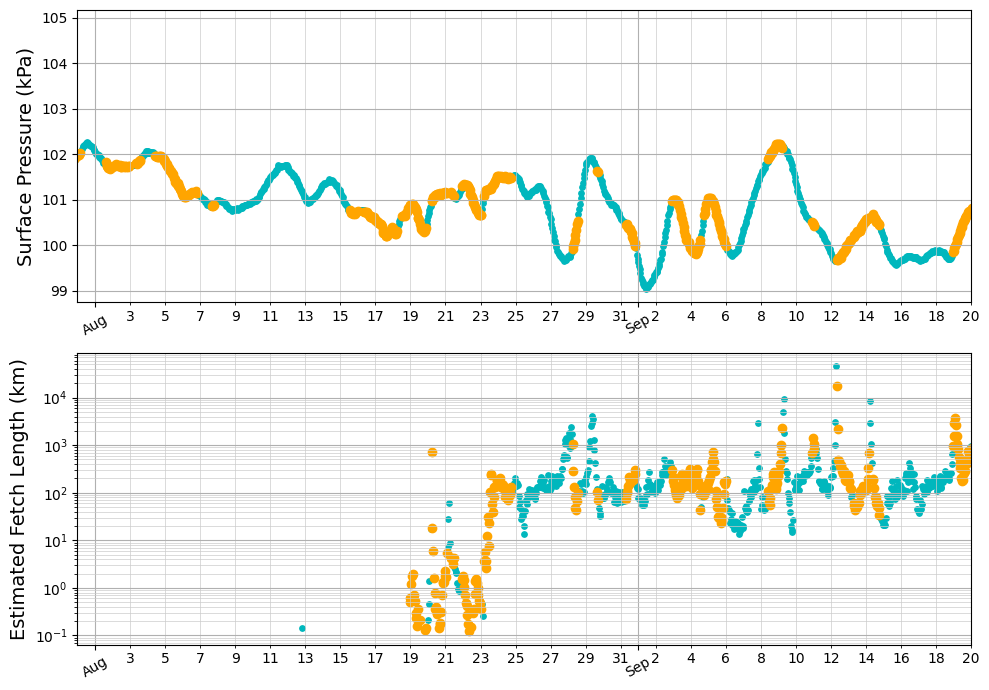

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'sp_kPa')

time_series_singular(ax2, moor_dict, 'combined', 'x_km')
ax2.set_yscale('log')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['sp_kPa'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

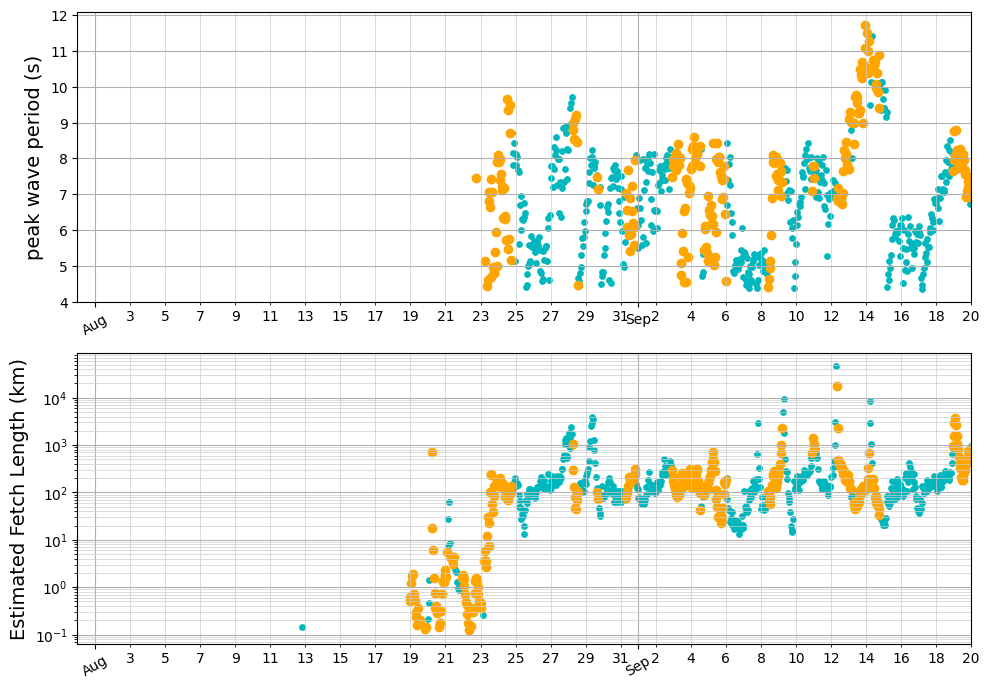

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'Tp')

time_series_singular(ax2, moor_dict, 'combined', 'x_km')
ax2.set_yscale('log')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['Tp'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

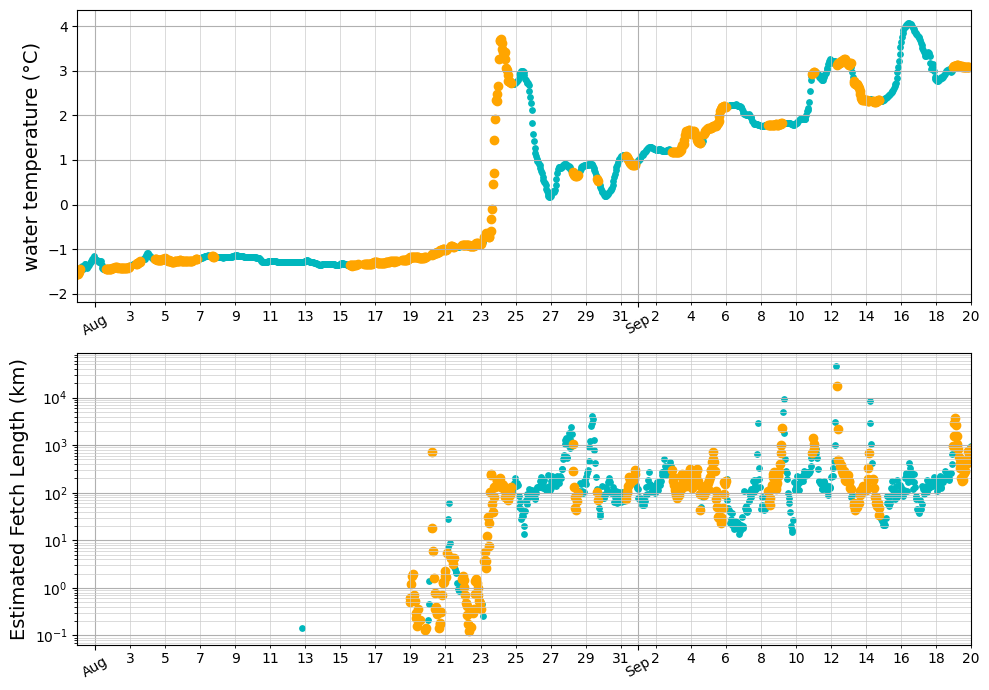

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'Temp')

time_series_singular(ax2, moor_dict, 'combined', 'x_km')
ax2.set_yscale('log')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['Temp'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

# Time Series | Fetch v Variables | Mooring 3

In [ ]:
moor_dict = site = moor_3

In [ ]:
# Locations from Worldview

lat_west = 70.8771
lon_west = -152.4314
west = [lat_west, lon_west]

lat_east = 70.4282
lon_east = -148.5185
east = [lat_east, lon_east]
print("Western point: ", west)
print('Eastern point: ', east)

low_onshore = angle_between2((lon_east-lon_west, lat_east-lat_west))
high_onshore = low_onshore + 180
print('Angles between', low_onshore,'° and', high_onshore, '° are offshore winds')
print('Angles outside of', low_onshore,'° and', high_onshore, '° are onshore winds')

Western point:  [70.8771, -152.4314]
Eastern point:  [70.4282, -148.5185]
Angles between 96.54453752616757 ° and 276.5445375261676 ° are offshore winds
Angles outside of 96.54453752616757 ° and 276.5445375261676 ° are onshore winds


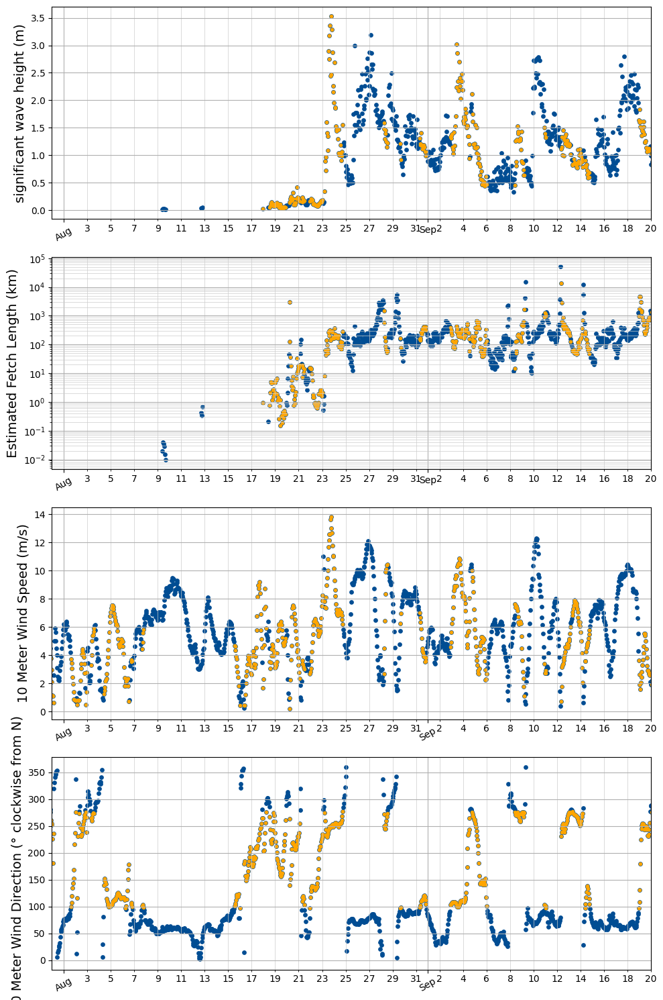

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(10, 15))
time_series_singular(ax1, moor_dict, 'combined', 'Hs')
time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')
time_series_singular(ax3, moor_dict, 'combined', 'wspd')
time_series_singular(ax4, moor_dict, 'combined', 'wdir')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['Hs'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), marker='.', color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), marker='.', color='orange')

ax3.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['wspd'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), marker='.', color='orange')

ax4.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['wdir'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), marker='.', color='orange')

for ax in (ax1, ax2, ax3, ax4):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

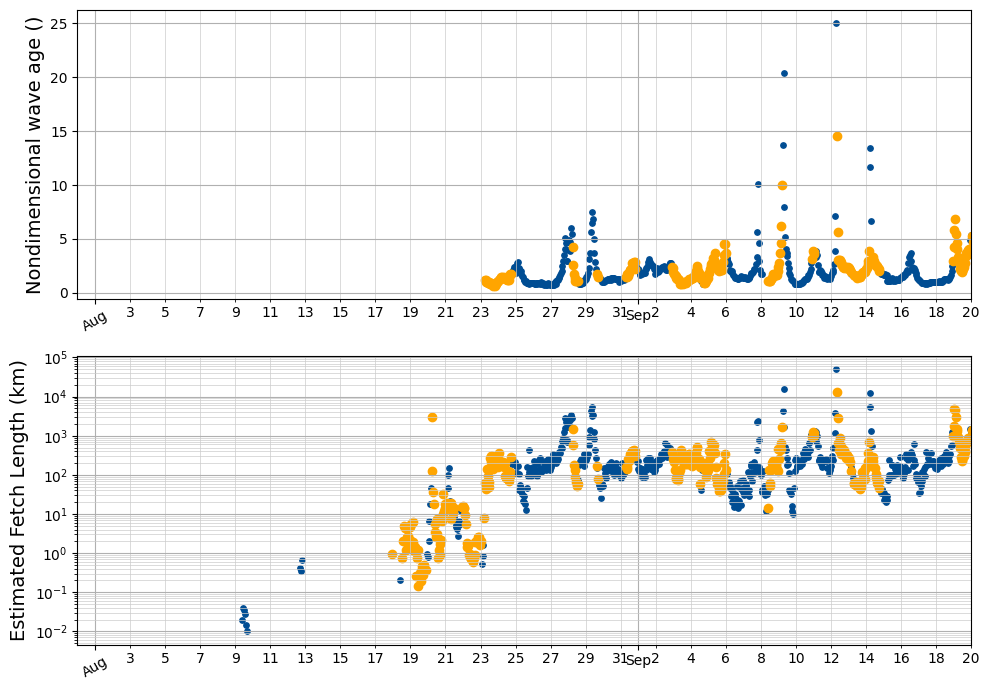

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'C/wspd')

time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['C/wspd'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

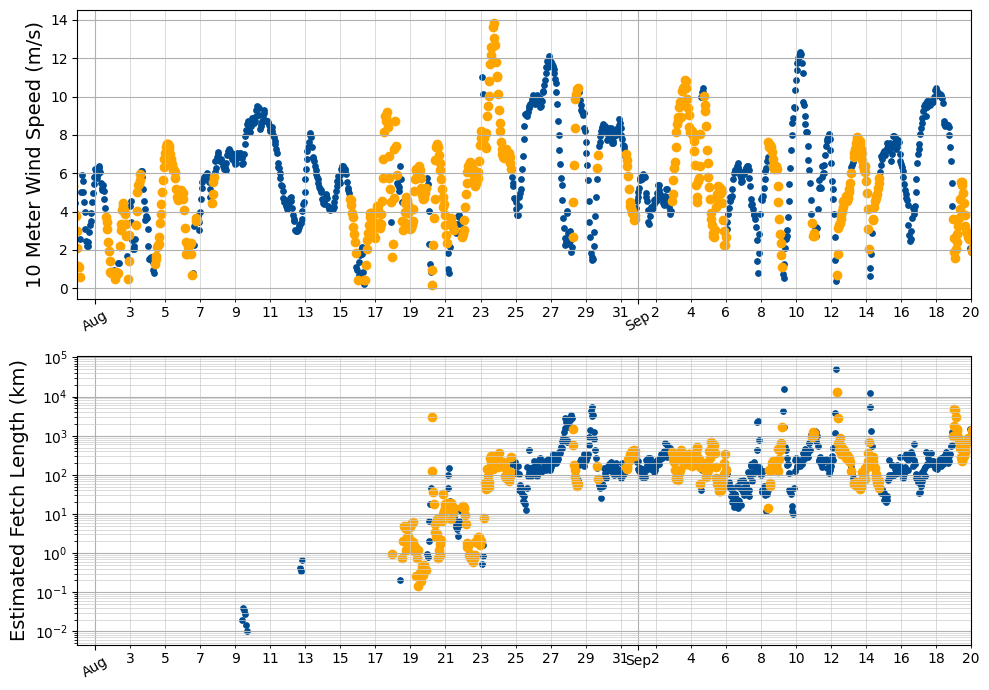

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'wspd')

time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['wspd'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

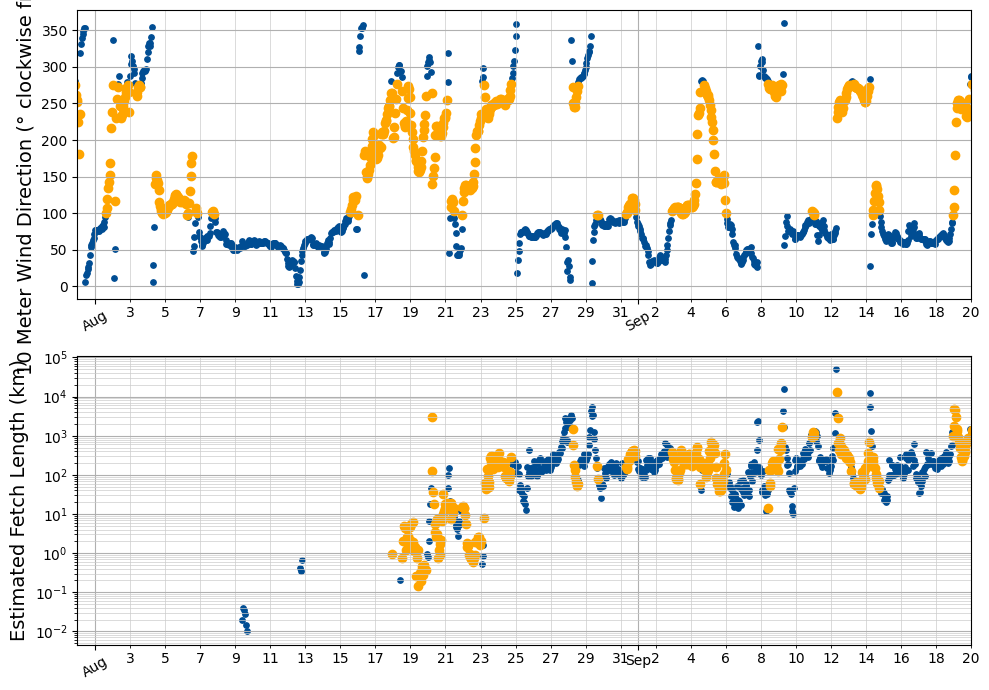

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'wdir')

time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['wdir'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

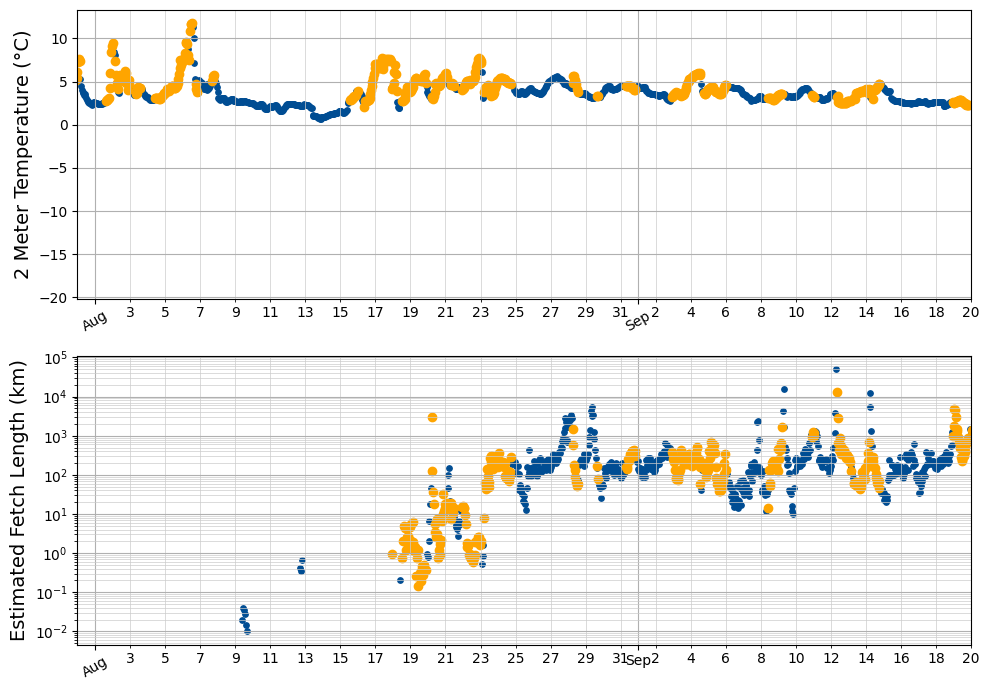

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 't2m_C')

time_series_singular_log(ax2, moor_dict, 'combined', 'x_km')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['t2m_C'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

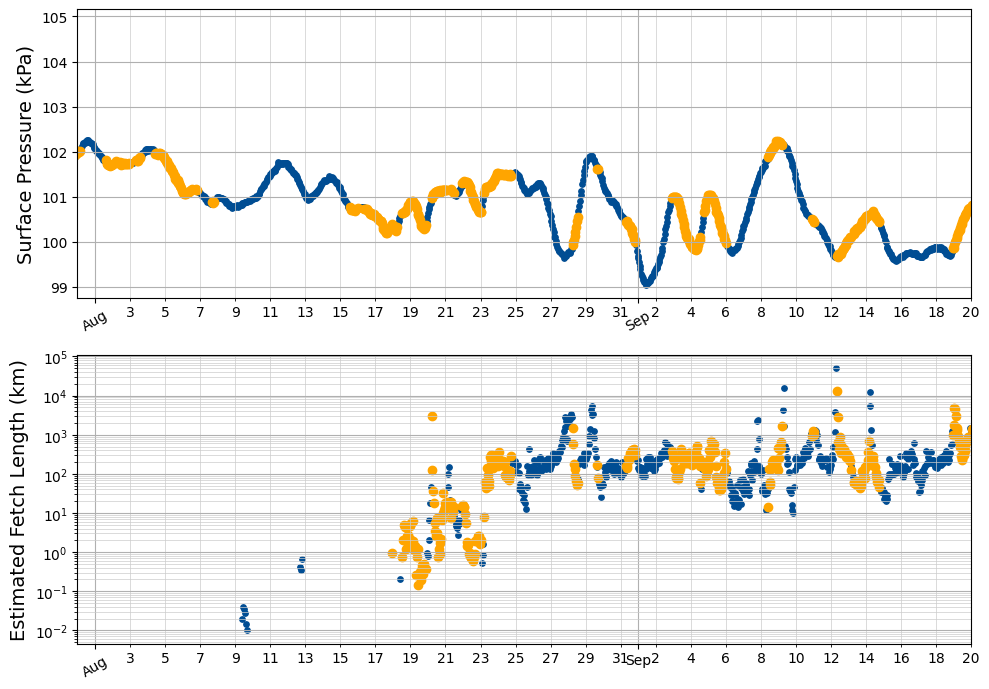

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'sp_kPa')

time_series_singular(ax2, moor_dict, 'combined', 'x_km')
ax2.set_yscale('log')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['sp_kPa'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

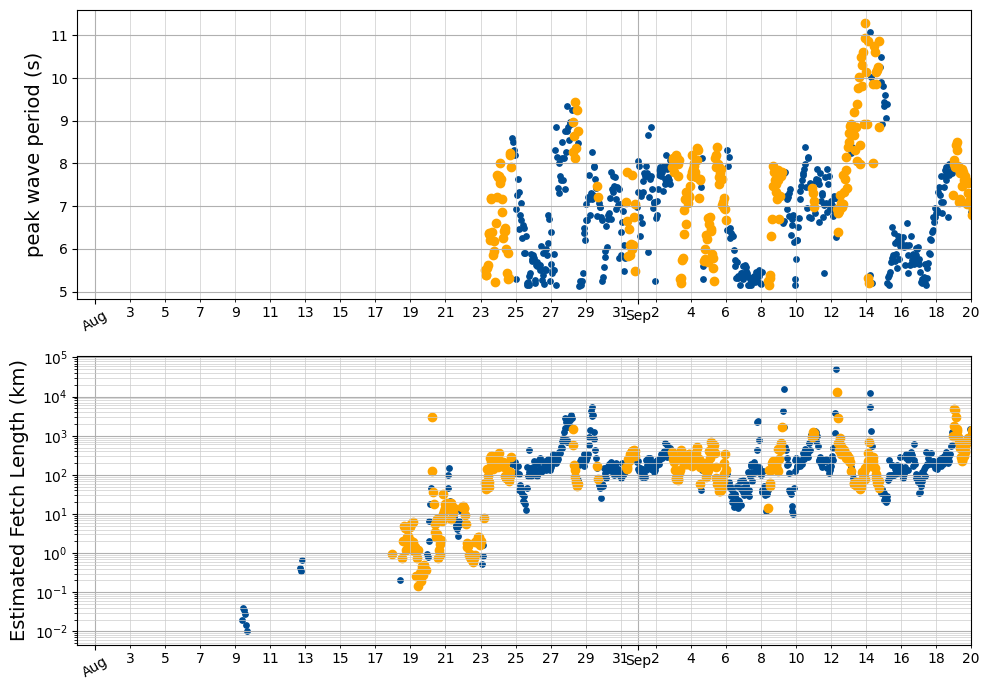

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'Tp')

time_series_singular(ax2, moor_dict, 'combined', 'x_km')
ax2.set_yscale('log')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['Tp'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

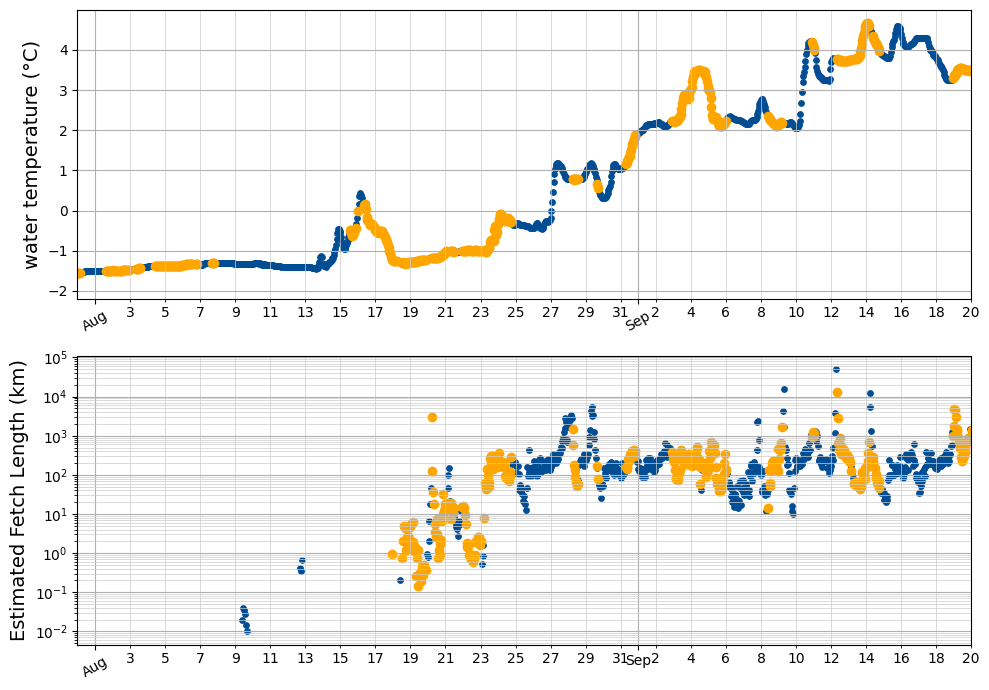

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_dict, 'combined', 'Temp')

time_series_singular(ax2, moor_dict, 'combined', 'x_km')
ax2.set_yscale('log')

ax1.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['Temp'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

ax2.scatter(moor_dict['combined']['time'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)),
            moor_dict['combined']['x_km'].where((moor_dict['combined']['wdir']>low_onshore) & (moor_dict['combined']['wdir']<high_onshore)), color='orange')

for ax in (ax1, ax2):
  time_series_axis(ax)
  #ax.legend()
  #ax = plt.gca()
  ax.set_xlim([Aug01, end])
plt.tight_layout()

# Time Series | Moorings & ERA5

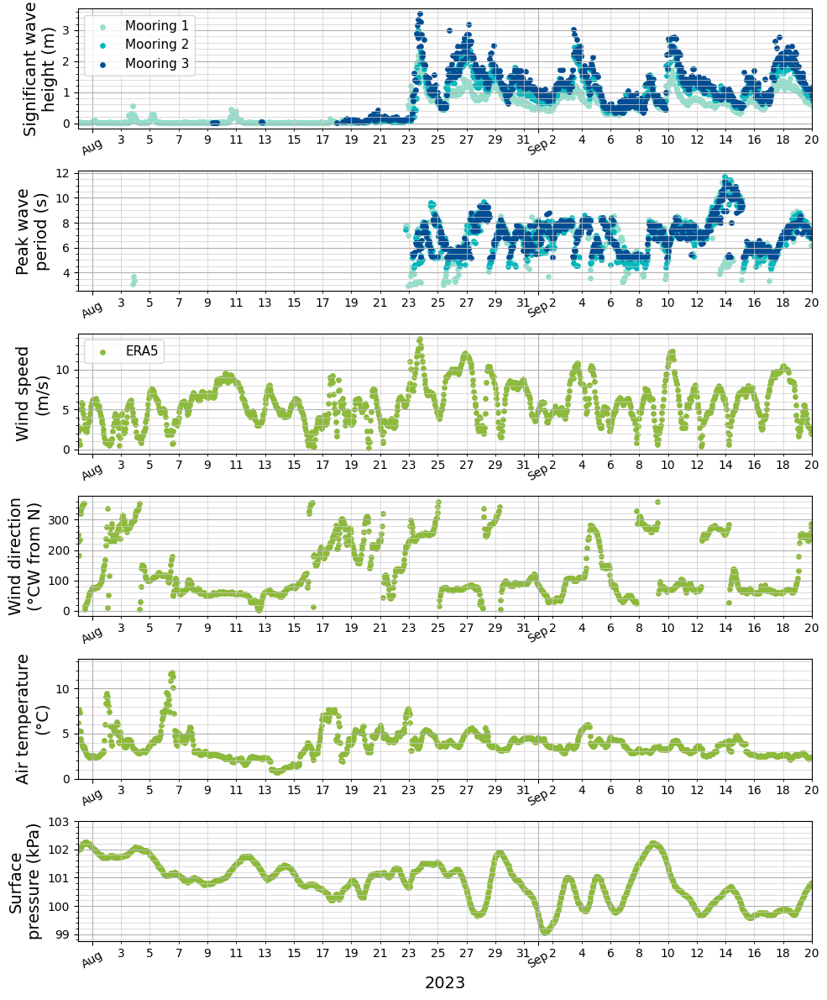

In [ ]:
# FOR REPORT

moor_dict = moor_2
fig, axes = fig, (ax1, ax6, ax2, ax3, ax4, ax5) = plt.subplots(6, 1, figsize=(10, 12))

for site in sites:
  time_series_singular(ax1, site, 'ds', 'Hs')
  time_series_singular(ax6, site, 'ds', 'Tp')
time_series_singular_era5(ax2, moor_dict, 'era5', 'wspd')
time_series_singular_era5(ax3, moor_dict, 'era5', 'wdir')
time_series_singular_era5(ax4, moor_dict, 'era5', 't2m_C')
time_series_singular_era5(ax5, moor_dict, 'era5', 'sp_kPa')

for ax in axes.flatten():
  ax.minorticks_on()
  ax.set_xlim([Aug01, end])
  time_series_axis(ax)
ax1.legend(('Mooring 1', 'Mooring 2', 'Mooring 3'), fontsize=11)
ax2.legend(('ERA5','_nolegend_'), loc='upper left', fontsize=11)

ax1.set_ylabel('Significant wave\nheight (m)')
ax6.set_ylabel('Peak wave\nperiod (s)')
ax2.set_ylabel('Wind speed\n(m/s)')
ax3.set_ylabel('Wind direction\n(°CW from N)')
ax4.set_ylabel('Air temperature\n(°C)')
ax5.set_ylabel('Surface\npressure (kPa)')

ax5.set_xlabel('2023', fontsize=14)

ax4.set_ylim([0, None])
ax5.set_ylim([None, 103])

plt.tight_layout()

#plt.savefig(save_direct + 'hs_era5_REPORT.jpg', bbox_inches='tight', dpi=400)

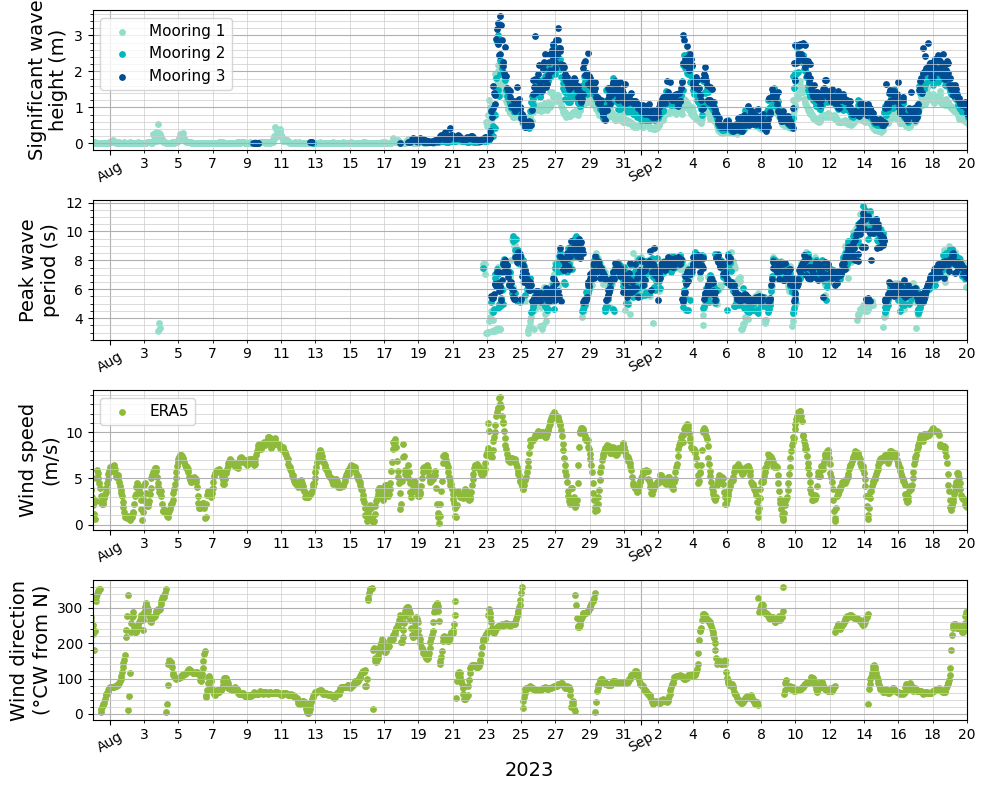

In [ ]:
# FOR PRESENTATION

moor_dict = moor_2
fig, axes = fig, (ax1, ax4, ax2, ax3) = plt.subplots(4, 1, figsize=(10, 8))

for site in sites:
  time_series_singular(ax1, site, 'ds', 'Hs')
  time_series_singular(ax4, site, 'ds', 'Tp')
time_series_singular_era5(ax2, moor_dict, 'era5', 'wspd')
time_series_singular_era5(ax3, moor_dict, 'era5', 'wdir')

for ax in axes.flatten():
  ax.minorticks_on()
  ax.set_xlim([Aug01, end])
  time_series_axis(ax)
ax1.legend(('Mooring 1', 'Mooring 2', 'Mooring 3'), fontsize=11)
ax2.legend(('ERA5','_nolegend_'), loc='upper left', fontsize=11)

ax1.set_ylabel('Significant wave\nheight (m)')
ax4.set_ylabel('Peak wave\nperiod (s)')
ax2.set_ylabel('Wind speed\n(m/s)')
ax3.set_ylabel('Wind direction\n(°CW from N)')
ax3.set_xlabel('2023', fontsize=14)

plt.tight_layout()

#plt.savefig(save_direct + 'hs_era5_PRESENTATION.jpg', bbox_inches='tight', dpi=400)

# Time Series | Wave Age

In [ ]:
Aug22 = dt.datetime(2023, 8, 22, 0, 0, 0)

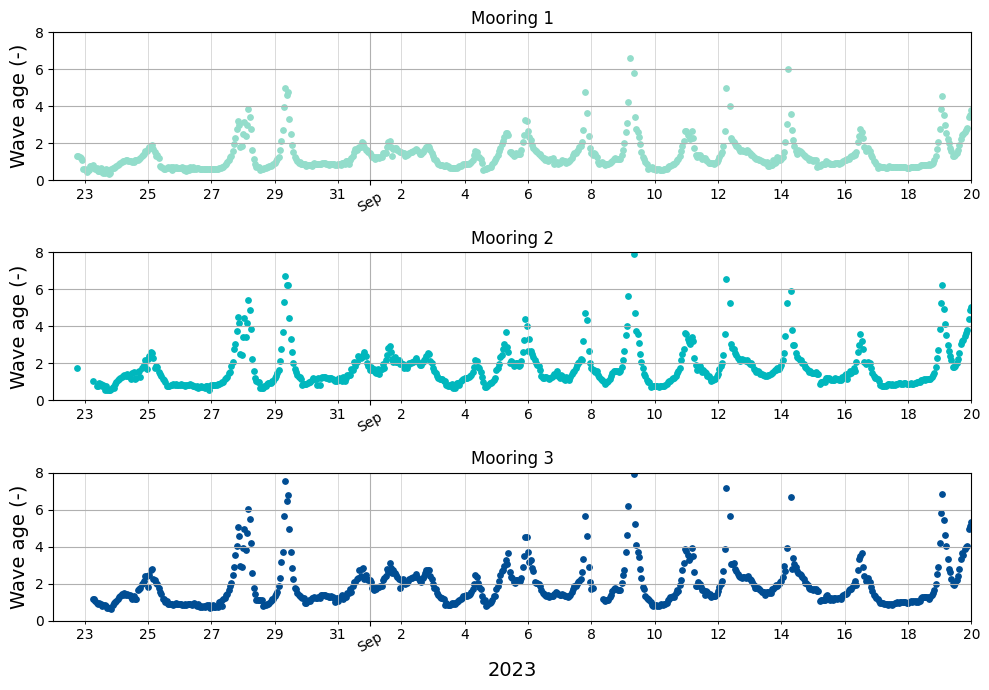

In [ ]:
fig, axes = fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 7))
time_series_singular(ax1, moor_1, 'combined', 'C/wspd')
time_series_singular(ax2, moor_2, 'combined', 'C/wspd')
time_series_singular(ax3, moor_3, 'combined', 'C/wspd')

for ax in axes:
  time_series_axis(ax)
  ax.set_xlim(Aug22, end)
  ax.set_ylabel('Wave age (-)', fontsize=14)
  ax.set_ylim([0, 8])

ax1.set_title(moor_1['Moor'])
ax2.set_title(moor_2['Moor'])
ax3.set_title(moor_3['Moor'])
ax3.set_xlabel('2023', fontsize=14)
plt.tight_layout()

# plt.savefig(save_direct + 'age_timeseries.jpg', bbox_inches='tight', dpi=400)

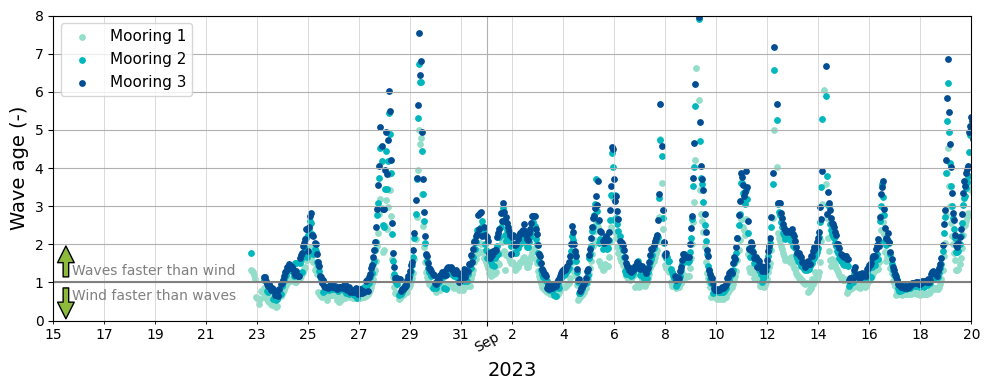

In [ ]:
fig, axes = fig, ax1 = plt.subplots(1, 1, figsize=(10, 4))
ax = ax1
for site in sites:
  time_series_singular(ax, site, 'combined', 'C/wspd')

time_series_axis(ax)
ax.set_xlim(Aug15, end)
ax.set_ylim([0, 8])

ax1.axhline(1, color='gray')
ax1.annotate('Waves faster than wind', xy=(dt.datetime(2023, 8, 15, 18), 1.2), color='gray')
ax1.annotate('', xy=(dt.datetime(2023, 8, 15, 12), 2), xytext=(dt.datetime(2023, 8, 15, 12), 1.1), arrowprops = dict(facecolor=era5_color, shrink=0.05))
ax1.annotate('Wind faster than waves', xy=(dt.datetime(2023, 8, 15, 18), 0.55), color='gray')
ax1.annotate('', xy=(dt.datetime(2023, 8, 15, 12), 0), xytext=(dt.datetime(2023, 8, 15, 12), 0.9), arrowprops = dict(facecolor=era5_color, shrink=0.05))

ax.set_ylabel('Wave age (-)', fontsize=14)
ax1.set_xlabel('2023', fontsize=14)

plt.legend(('Mooring 1', 'Mooring 2', 'Mooring 3'), fontsize=11)

plt.tight_layout()

#plt.savefig(save_direct + 'age_timeseries.jpg', bbox_inches='tight', dpi=400)

# Time Series | Fetch

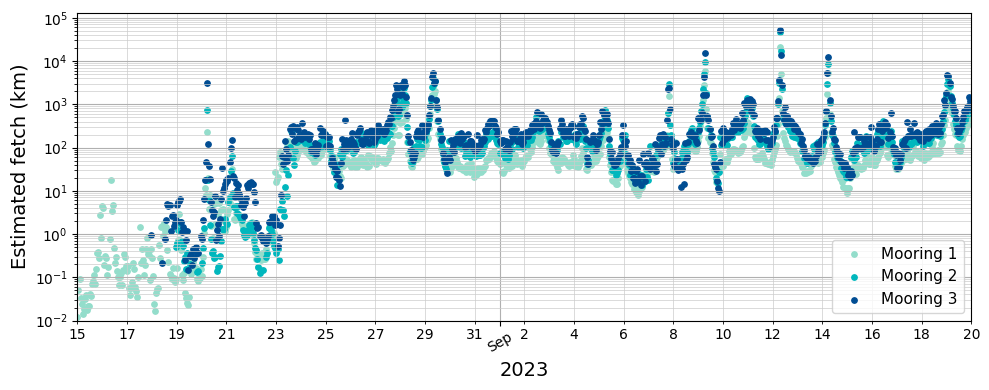

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(10, 4))
ax = ax1
for site in sites:
  time_series_singular_log(ax, site, 'combined', 'x_km')

time_series_axis(ax)
log_axis(ax)
ax.set_xlim(Aug15, end) # Narrowed because there was very little fetch activity for Moorings 2 & 3
ax.set_ylim(10**-2, None)

ax.set_ylabel('Estimated fetch (km)', fontsize=14)
ax.set_xlabel('2023', fontsize=14)

plt.legend(('Mooring 1', 'Mooring 2', 'Mooring 3'), fontsize=11)

plt.tight_layout()

#plt.savefig(save_direct + 'fetch_timeseries.jpg', bbox_inches='tight', dpi=400)

For offshore wind conditions, do the fetches increase as

Mid Jul or Aug to end

In [ ]:
moor_1['combined']

<xarray.Dataset>
Dimensions:    (time: 3723, frequency: 1799)
Coordinates:
  * time       (time) datetime64[ns] 2023-04-18T18:00:00 ... 2023-09-20T20:00:00
  * frequency  (frequency) float64 0.0008333 0.001389 0.001944 ... 0.9992 0.9997
    longitude  float32 -150.0
    latitude   float32 70.75
Data variables: (12/24)
    E          (time, frequency) float64 nan nan nan nan nan ... nan nan nan nan
    Lat        (time) float64 nan 70.56 70.56 70.56 ... 70.56 70.56 70.56 nan
    Lon        (time) float64 nan -150.0 -150.0 -150.0 ... -150.0 -150.0 nan
    Temp       (time) float64 nan -1.957 -1.974 -1.972 ... 2.184 2.184 2.184 nan
    Hs         (time) float64 nan 0.004156 0.006829 ... 0.5351 0.5836 nan
    Tp         (time) float64 nan nan nan nan nan ... 6.99 7.045 6.091 6.883 nan
    ...         ...
    X_nondim   (time) float64 nan 100.8 120.0 31.68 ... 2.976e+03 3.4e+03 nan
    x          (time) float64 nan 26.5 47.58 16.95 ... 1.918e+04 2.238e+04 nan
    x_km       (time) float64 nan 0.0265 0.04758 0.01695 ... 19.18 22.38 nan
    L          (time) float64 nan nan nan nan nan ... 50.73 51.16 42.8 49.76 nan
    C          (time) float64 nan nan nan nan nan ... 7.261 7.026 7.229 nan
    C/wspd     (time) float64 nan nan nan nan nan ... 0.9401 0.8843 0.9001 nan
Attributes:
    creation_date:  2024/02/08
    author:         M Sangillo
    email:          mcsangillo@wpi.edu
    Site:           Site 1

# Time Series | Fetch & Wave Age

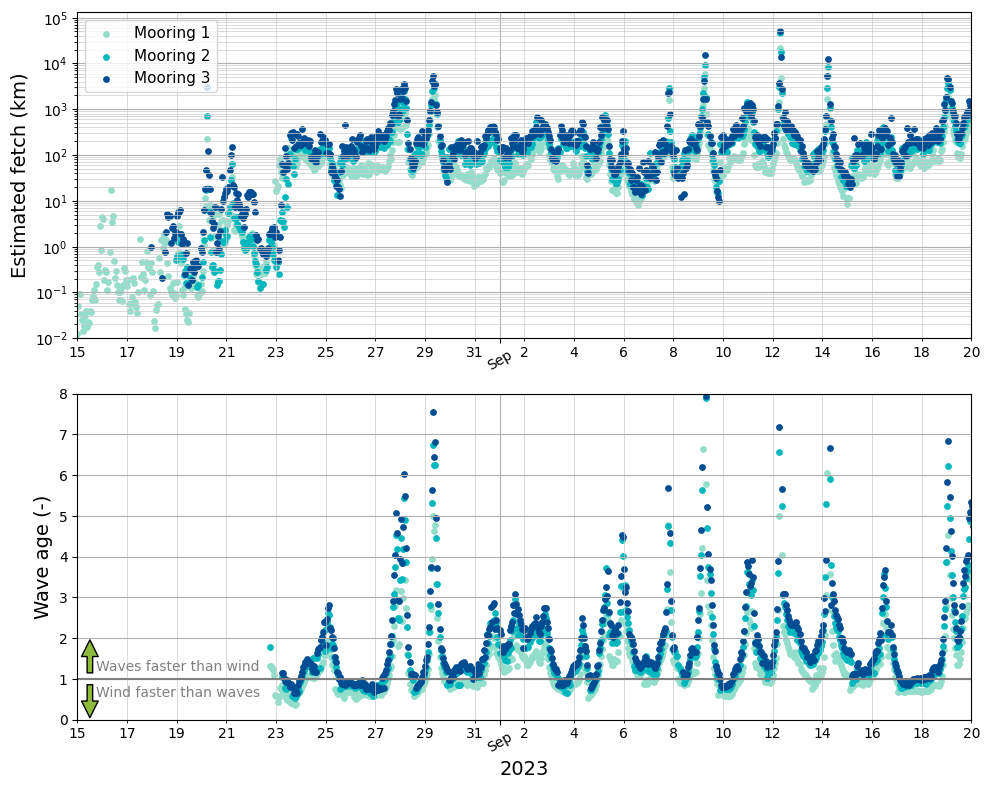

In [ ]:
fig, axes = fig, (ax2, ax1) = plt.subplots(2, 1, figsize=(10, 8))
for site in sites:
  time_series_singular(ax1, site, 'combined', 'C/wspd')
  time_series_singular_log(ax2, site, 'combined', 'x_km')

for ax in axes:
  time_series_axis(ax)
  ax.set_xlim(Aug15, end)

log_axis(ax2)
ax2.set_ylim(10**-2, None)
ax2.set_ylabel('Estimated fetch (km)', fontsize=14)
ax2.legend(('Mooring 1', 'Mooring 2', 'Mooring 3'),loc='upper left', fontsize=11)

ax1.axhline(1, color='gray')
ax1.set_ylim([0, 8])
ax1.annotate('Waves faster than wind', xy=(dt.datetime(2023, 8, 15, 18), 1.2), color='gray')
ax1.annotate('', xy=(dt.datetime(2023, 8, 15, 12), 2), xytext=(dt.datetime(2023, 8, 15, 12), 1.1), arrowprops = dict(facecolor=era5_color, shrink=0.05))
ax1.annotate('Wind faster than waves', xy=(dt.datetime(2023, 8, 15, 18), 0.55), color='gray')
ax1.annotate('', xy=(dt.datetime(2023, 8, 15, 12), 0), xytext=(dt.datetime(2023, 8, 15, 12), 0.9), arrowprops = dict(facecolor=era5_color, shrink=0.05))
ax1.set_ylabel('Wave age (-)', fontsize=14)
ax1.set_xlabel('2023', fontsize=14)

plt.tight_layout()

#plt.savefig(save_direct + 'fetchyage_timeseries.jpg', bbox_inches='tight', dpi=400)

# Fetch with 180 degree winds | 179->181

In [ ]:
# Prints list of time when wind direction is almost 180 degrees
'''
moor_dict = moor_1
counter = 0
for di, i in enumerate(moor_dict['180 2 wide']['time']):
  if np.isnan(moor_dict['180 2 wide']['wdir'][di]) == False:
    counter = counter + 1
    print(i)
    print(moor_dict['180 2 wide']['wdir'][di])
counter
'''

"\nmoor_dict = moor_1\ncounter = 0\nfor di, i in enumerate(moor_dict['180 2 wide']['time']):\n  if np.isnan(moor_dict['180 2 wide']['wdir'][di]) == False:\n    counter = counter + 1\n    print(i)\n    print(moor_dict['180 2 wide']['wdir'][di])\ncounter\n"

In [ ]:
for site in sites:
  site['180 2 wide'] = site['combined'].where((site['combined']['wdir']>179) & (site['combined']['wdir']<181))
  counter = 0
  time_list = []
  for di, i in enumerate(site['180 2 wide']['time']):
    if np.isnan(site['180 2 wide']['wdir'][di]) == False:
      sel = site['180 2 wide'].sel(time=i)
      if counter == 0:
        new_xarray = sel
      else:
        new_xarray = xr.concat((new_xarray, sel), dim='time')
      counter=counter+1
  site['180 2 wide'] = new_xarray

In [ ]:
moor_2['180 2 wide']

<xarray.Dataset>
Dimensions:    (time: 15, frequency: 1799)
Coordinates:
  * time       (time) datetime64[ns] 2023-04-19T22:00:00 ... 2023-09-19T02:00:00
  * frequency  (frequency) float64 0.0008333 0.001389 0.001944 ... 0.9992 0.9997
    longitude  float32 -150.0
    latitude   float32 70.75
Data variables: (12/24)
    E          (time, frequency) float64 0.01339 0.005006 ... 0.0003925
    Lat        (time) float64 70.65 70.65 70.65 70.65 ... 70.65 70.65 70.65
    Lon        (time) float64 -150.0 -150.0 -150.0 ... -150.0 -150.0 -150.0
    Temp       (time) float64 -1.888 -1.872 -1.862 -1.866 ... -1.181 1.763 3.111
    Hs         (time) float64 nan nan nan nan nan ... nan 0.06623 0.8217 1.385
    Tp         (time) float64 nan nan nan nan nan nan ... nan nan nan 5.035 8.09
    ...         ...
    X_nondim   (time) float64 nan nan nan nan ... nan 161.3 5.996e+05 1.443e+07
    x          (time) float64 nan nan nan nan ... nan 536.6 4.407e+05 3.763e+06
    x_km       (time) float64 nan nan nan nan nan ... nan 0.5366 440.7 3.763e+03
    L          (time) float64 nan nan nan nan nan ... nan nan nan 38.74 80.48
    C          (time) float64 nan nan nan nan nan ... nan nan nan 7.694 9.948
    C/wspd     (time) float64 nan nan nan nan nan ... nan nan nan 2.867 6.224
Attributes:
    creation_date:  2024/02/08
    author:         M Sangillo
    email:          mcsangillo@wpi.edu
    Site:           Site 2

Text(0.5, 1.0, 'Estimated fetches when the wind blew from 179 degrees to 181 degrees')

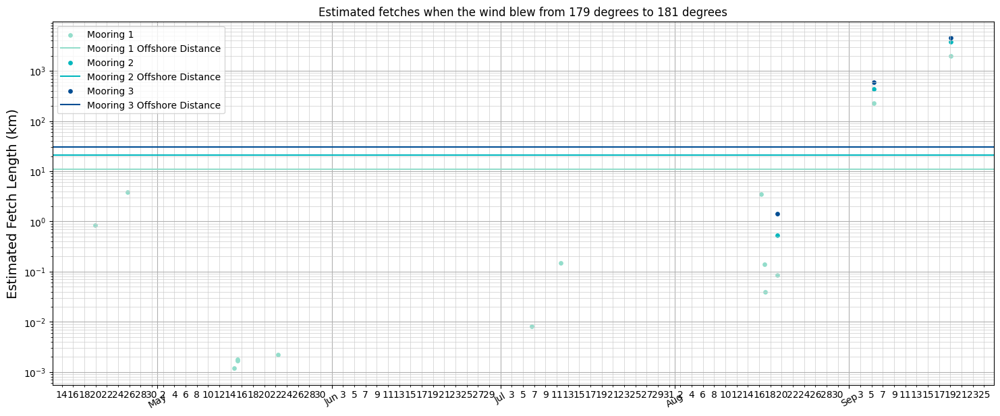

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(18, 7))
for site in sites:
  time_series_singular_log(ax1, site, '180 2 wide', 'x_km')
  plt.axhline(site['x_offshore km'], color=site['fig color'])
plt.legend(('Mooring 1', 'Mooring 1 Offshore Distance', 'Mooring 2', 'Mooring 2 Offshore Distance', 'Mooring 3', 'Mooring 3 Offshore Distance'))
ax1.set_title("Estimated fetches when the wind blew from 179 degrees to 181 degrees")

(19569.0, 19620.0)

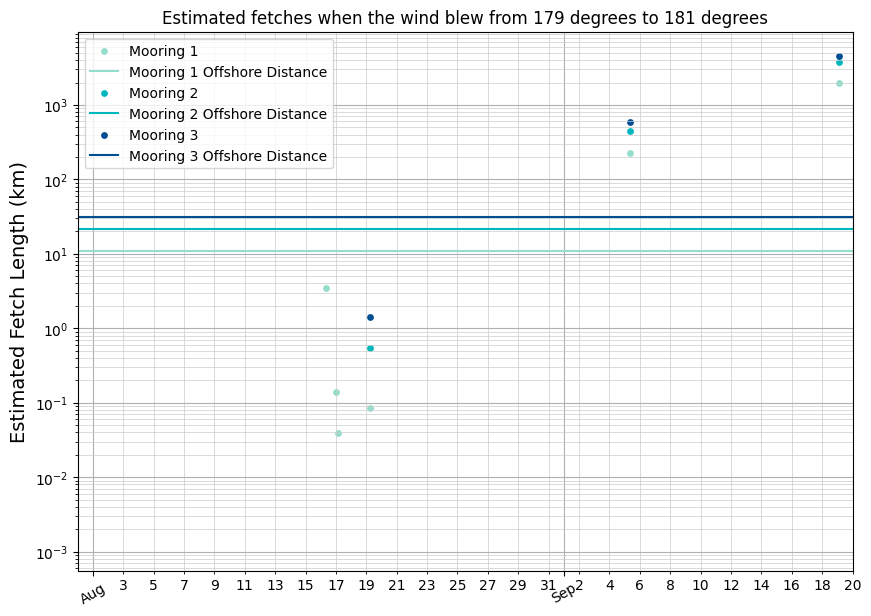

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(10, 7))
for site in sites:
  time_series_singular_log(ax1, site, '180 2 wide', 'x_km')
  plt.axhline(site['x_offshore km'], color=site['fig color'])
plt.legend(('Mooring 1', 'Mooring 1 Offshore Distance', 'Mooring 2', 'Mooring 2 Offshore Distance', 'Mooring 3', 'Mooring 3 Offshore Distance'))
ax1.set_title("Estimated fetches when the wind blew from 179 degrees to 181 degrees")
ax1.set_xlim(Aug01, end)

# Fetch with 180 degree winds | 175->185

In [ ]:
for site in sites:
  site['180 10 wide'] = site['combined'].where((site['combined']['wdir']>175) & (site['combined']['wdir']<185))
  counter = 0
  time_list = []
  for di, i in enumerate(site['180 10 wide']['time']):
    if np.isnan(site['180 10 wide']['wdir'][di]) == False:
      sel = site['180 10 wide'].sel(time=i)
      if counter == 0:
        new_xarray = sel
      else:
        new_xarray = xr.concat((new_xarray, sel), dim='time')
      counter=counter+1
  site['180 10 wide'] = new_xarray

In [ ]:
moor_2['180 10 wide']

<xarray.Dataset>
Dimensions:    (time: 35, frequency: 1799)
Coordinates:
  * time       (time) datetime64[ns] 2023-04-19T22:00:00 ... 2023-09-19T02:00:00
  * frequency  (frequency) float64 0.0008333 0.001389 0.001944 ... 0.9992 0.9997
    longitude  float32 -150.0
    latitude   float32 70.75
Data variables: (12/24)
    E          (time, frequency) float64 0.01339 0.005006 ... 0.0003925
    Lat        (time) float64 70.65 70.65 70.65 70.65 ... 70.65 70.65 70.65
    Lon        (time) float64 -150.0 -150.0 -150.0 ... -150.0 -150.0 -150.0
    Temp       (time) float64 -1.888 -1.887 -1.886 -1.872 ... -1.096 1.763 3.111
    Hs         (time) float64 nan nan nan nan ... 0.06623 0.06441 0.8217 1.385
    Tp         (time) float64 nan nan nan nan nan nan ... nan nan nan 5.035 8.09
    ...         ...
    X_nondim   (time) float64 nan nan nan nan ... 344.3 5.996e+05 1.443e+07
    x          (time) float64 nan nan nan nan ... 768.3 4.407e+05 3.763e+06
    x_km       (time) float64 nan nan nan nan ... 0.5366 0.7683 440.7 3.763e+03
    L          (time) float64 nan nan nan nan nan ... nan nan nan 38.74 80.48
    C          (time) float64 nan nan nan nan nan ... nan nan nan 7.694 9.948
    C/wspd     (time) float64 nan nan nan nan nan ... nan nan nan 2.867 6.224
Attributes:
    creation_date:  2024/02/08
    author:         M Sangillo
    email:          mcsangillo@wpi.edu
    Site:           Site 2

In [ ]:
moor_dict = moor_3
for site in sites:
  counter = 0
  for di, i in enumerate(moor_3['180 10 wide']['time']):
    if np.isnan(moor_3['180 10 wide']['x_km'][di]) == False:
      sel = site['180 10 wide'].sel(time=i)
      if counter == 0:
        new_xarray = sel
      else:
        new_xarray = xr.concat((new_xarray, sel), dim='time')
      counter = counter + 1
  site['180 all moor'] = new_xarray

In [ ]:
moor_3['180 all moor']

<xarray.Dataset>
Dimensions:    (time: 4, frequency: 1799)
Coordinates:
  * time       (time) datetime64[ns] 2023-08-19T06:00:00 ... 2023-09-19T02:00:00
  * frequency  (frequency) float64 0.0008333 0.001389 0.001944 ... 0.9992 0.9997
    longitude  float32 -150.0
    latitude   float32 70.75
Data variables: (12/24)
    E          (time, frequency) float64 0.00476 0.004498 ... 0.0004452
    Lat        (time) float64 70.74 70.74 70.74 70.74
    Lon        (time) float64 -150.0 -150.0 -150.0 -150.0
    Temp       (time) float64 -1.274 -1.18 2.269 3.388
    Hs         (time) float64 0.1074 0.1679 0.9466 1.517
    Tp         (time) float64 nan nan 5.255 7.912
    ...         ...
    X_nondim   (time) float64 433.1 2.432e+03 8.004e+05 1.738e+07
    x          (time) float64 1.44e+03 5.426e+03 5.882e+05 4.53e+06
    x_km       (time) float64 1.44 5.426 588.2 4.53e+03
    L          (time) float64 nan nan 42.85 86.61
    C          (time) float64 nan nan 8.154 10.95
    C/wspd     (time) float64 nan nan 3.038 6.848
Attributes:
    creation_date:  2024/02/08
    author:         M Sangillo
    email:          mcsangillo@wpi.edu
    Site:           Site 3

Text(0.5, 1.0, 'Estimated fetches when the wind blew from 175 degrees to 185 degrees')

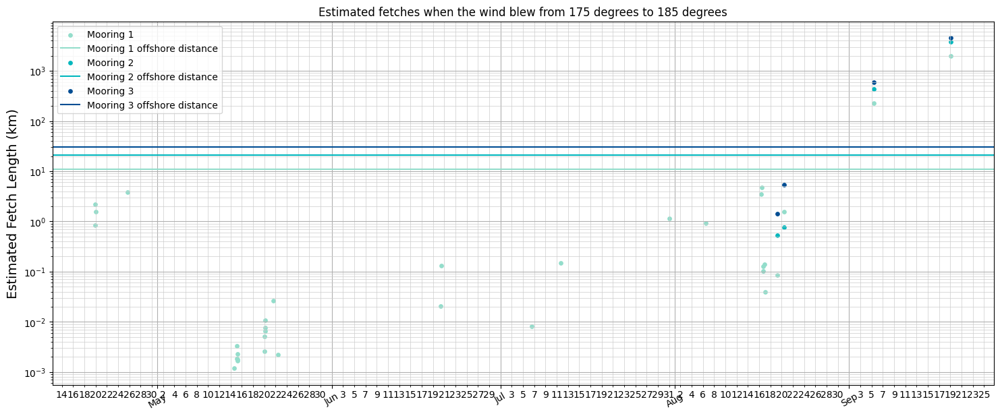

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(18, 7))
for site in sites:
  time_series_singular_log(ax1, site, '180 10 wide', 'x_km')
  plt.axhline(site['x_offshore km'], color=site['fig color'])
plt.legend(('Mooring 1', 'Mooring 1 offshore distance', 'Mooring 2', 'Mooring 2 offshore distance', 'Mooring 3', 'Mooring 3 offshore distance'))
ax1.set_title("Estimated fetches when the wind blew from 175 degrees to 185 degrees")

In [ ]:
# MANUAL DECISION of datetime from moor_3['180 all moor'] because I do not know how to code it
times_of_180 = [dt.datetime(2023, 8, 19, 6, 0, 0), dt.datetime(2023, 8, 20, 9, 0, 0), dt.datetime(2023, 9, 5, 8, 0, 0), dt.datetime(2023, 9, 19, 2, 0, 0)]
times_of_spectra = [dt.datetime(2023, 8, 19, 6, 0, 0), dt.datetime(2023, 9, 5, 8, 0, 0)]

<ipython-input-123-bddaa7d5b617>:26: UserWarning: The label '_nolegend_' of <matplotlib.lines.Line2D object at 0x7d2adf752da0> starts with '_'. It is thus excluded from the legend.
  plt.legend(('_nolegend_', '_nolegend_',
<ipython-input-123-bddaa7d5b617>:26: UserWarning: The label '_nolegend_' of <matplotlib.lines.Line2D object at 0x7d2ae09a5330> starts with '_'. It is thus excluded from the legend.
  plt.legend(('_nolegend_', '_nolegend_',


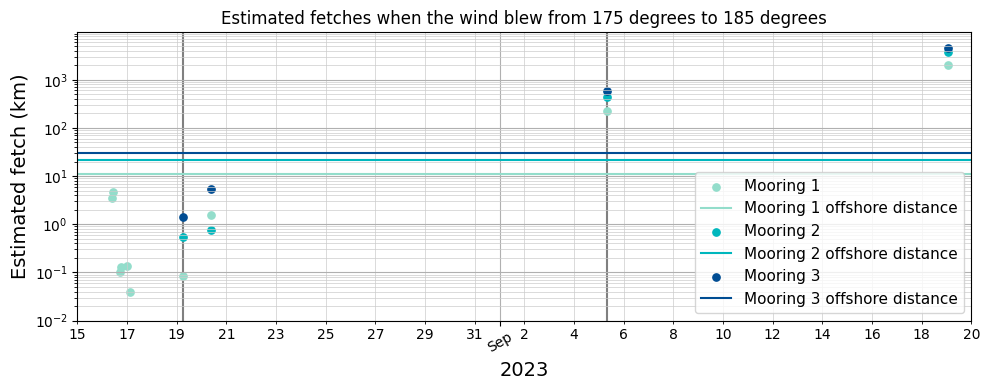

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(10, 4))

ax = ax1

for time in times_of_spectra:
  plt.axvline(time, color='gray', zorder=0)

for site in sites:
  moor = site
  dataset = '180 10 wide'
  variable = 'x_km'
  data = moor[dataset]
  ax.scatter(data.time, data[variable], marker='.', color=moor['fig color'], label=data[variable].attrs['long_name'], s = 110, zorder=1)
  plt.axhline(site['x_offshore km'], color=site['fig color'], zorder=2)

time_series_axis(ax1)
log_axis(ax1)

ax1.set_xlim(Aug15, end)
ax.set_ylim(10**-2, None)

ax1.set_title("Estimated fetches when the wind blew from 175 degrees to 185 degrees")
ax1.set_ylabel('Estimated fetch (km)', fontsize=14)
ax.set_xlabel('2023', fontsize=14)

plt.legend(('_nolegend_', '_nolegend_',
            'Mooring 1', 'Mooring 1 offshore distance',
            'Mooring 2', 'Mooring 2 offshore distance',
            'Mooring 3', 'Mooring 3 offshore distance'),
           fontsize=11)

plt.tight_layout()

#plt.savefig(save_direct + 'fetch_180timeseries.jpg', bbox_inches='tight', dpi=400)

# Wave age versus fetch | Fitting and $R^2$

In [ ]:
# NEWWWWW
for site in sites:
  site['offshore'] = site['combined'].where((site['combined']['wdir']>low_onshore) & (site['combined']['wdir']<high_onshore))
  counter = 0
  for di, i in enumerate(site['offshore']['time']):
    if np.isnan(site['offshore']['wdir'][di]) == False:
      sel = site['offshore'].sel(time=i)
      if counter == 0:
        new_xarray = sel
      else:
        new_xarray = xr.concat((new_xarray, sel), dim='time')
      counter=counter+1
  site['offshore'] = new_xarray

In [ ]:
# NEWWWW
for site in sites:
  site['onshore_low'] = site['combined'].where(site['combined']['wdir']<low_onshore)
  counter = 0
  for di, i in enumerate(site['onshore_low']['time']):
    if np.isnan(site['onshore_low']['wdir'][di]) == False:
      sel = site['onshore_low'].sel(time=i)
      if counter == 0:
        new_xarray = sel
      else:
        new_xarray = xr.concat((new_xarray, sel), dim='time')
      counter=counter+1

  site['onshore_high'] = site['combined'].where(site['combined']['wdir']>high_onshore)
  counter = 0
  for di, i in enumerate(site['onshore_high']['time']):
    if np.isnan(site['onshore_high']['wdir'][di]) == False:
      sel = site['onshore_high'].sel(time=i)
      new_xarray = xr.concat((new_xarray, sel), dim='time')
      counter=counter+1

  site['onshore'] = new_xarray

In [ ]:
# NEWWWW
for site in sites:
  xr_list = ['combined', 'offshore', 'onshore']
  mb_list = [('m_full', 'b_full'), ('m_offshore', 'b_offshore'), ('m_onshore', 'b_onshore')]
  R2_list = ['R2_full', 'R2_offshore', 'R2_onshore']
  for di, ds in enumerate(xr_list):
    b, m = exp_fit_agevfetch(site, ds)
    site[ds]['C/wspd_fit'] = exp_eq(site[ds]['x_km'], b, m)
    site[ds]['C/wspd_fit'].attrs['units'] = ''
    site[ds]['C/wspd_fit'].attrs['long_name'] = 'Fitted nondimensional wave age'
    site[ds]['C/wspd_fit'].attrs['calculated from'] = exp_print(b, m)
    site[ds]['C/wspd_fit'].attrs['log slope'] = str(m)
    site[ds]['C/wspd_fit'].attrs['log intercept'] = str(b)
    site[mb_list[di][0]] = m
    site[mb_list[di][1]] = b

    site[ds]['SSR'] = (site[ds]['C/wspd'] - site[ds]['C/wspd_fit'])**2
    site[ds]['SSR'].attrs['long_name'] = 'Sum squared regression'
    site[ds]['SSR'].attrs['calculated from'] = '(C/wspd - C/wspd_fit)^2'

    avg = np.nanmean(site[ds]['C/wspd'])
    site[ds]['SST'] = (site[ds]['C/wspd'] - avg)**2
    site[ds]['SST'].attrs['long_name'] = 'Total sum of squares'
    site[ds]['SST'].attrs['calculated from'] = '(C/wspd - np.nanmean(C/wspd_fit))^2'

    R2 = 1 - (np.nansum(site[ds]['SSR'])/np.nansum(site[ds]['SST']))
    site[R2_list[di]] = R2

    site[ds]['C/wspd_fit'].attrs['R^2'] = str(R2)

In [ ]:
for site in sites:
  R2_list = ['R2_full', 'R2_offshore', 'R2_onshore']
  for R2 in R2_list:
    print(site['Moor'] + ' : ' + R2 + ' : ' + str(site[R2]))

Mooring 1 : R2_full : 0.833829983319967
Mooring 1 : R2_offshore : 0.7041939991938853
Mooring 1 : R2_onshore : 0.8683858786875505
Mooring 2 : R2_full : 0.8008136322512627
Mooring 2 : R2_offshore : 0.719366859689467
Mooring 2 : R2_onshore : 0.8331280136457044
Mooring 3 : R2_full : 0.7715800904475633
Mooring 3 : R2_offshore : 0.6512136394204155
Mooring 3 : R2_onshore : 0.8078052804608267


In [ ]:
3723-1118

2605

In [ ]:
moor_1['onshore']

<xarray.Dataset>
Dimensions:     (time: 2605, frequency: 1799)
Coordinates:
  * time        (time) datetime64[ns] 2023-04-18T22:00:00 ... 2023-09-20T04:0...
  * frequency   (frequency) float64 0.0008333 0.001389 ... 0.9992 0.9997
    longitude   float32 -150.0
    latitude    float32 70.75
Data variables: (12/27)
    E           (time, frequency) float64 0.001723 0.0005728 ... 6.676e-05
    Lat         (time) float64 70.56 70.56 70.56 70.56 ... 70.56 70.56 70.56
    Lon         (time) float64 -150.0 -150.0 -150.0 ... -150.0 -150.0 -150.0
    Temp        (time) float64 -1.969 -1.964 -1.943 -1.943 ... 2.172 2.176 2.178
    Hs          (time) float64 0.005861 0.005637 0.006892 ... 0.5057 0.4915
    Tp          (time) float64 nan nan nan nan nan ... 6.175 7.273 7.157 6.51
    ...          ...
    L           (time) float64 nan nan nan nan nan ... 43.29 52.77 51.54 45.95
    C           (time) float64 nan nan nan nan nan ... 7.011 7.255 7.201 7.059
    C/wspd      (time) float64 nan nan nan nan nan ... 3.53 3.793 3.187 2.857
    C/wspd_fit  (time) float64 0.02993 0.02241 0.0363 ... 2.991 2.168 1.924
    SSR         (time) float64 nan nan nan nan ... 0.3416 0.6431 1.038 0.8711
    SST         (time) float64 nan nan nan nan nan ... 4.475 5.653 3.139 2.079
Attributes:
    creation_date:  2024/02/08
    author:         M Sangillo
    email:          mcsangillo@wpi.edu
    Site:           Site 1

# Original

In [ ]:
for site in sites:
  site['offshore'] = site['combined'].where((site['combined']['wdir']>low_onshore) & (site['combined']['wdir']<high_onshore))
  lower_onshore = site['combined'].where(site['combined']['wdir']<low_onshore)
  higher_onshore =  site['combined'].where(site['combined']['wdir']>high_onshore)
  site['onshore'] = xr.concat((lower_onshore, higher_onshore), dim='time') # Concat is not the best choice

In [ ]:
for site in sites:
  xr_list = ['combined', 'offshore', 'onshore']
  mb_list = [('m_full', 'b_full'), ('m_offshore', 'b_offshore'), ('m_onshore', 'b_onshore')]
  R2_list = ['R2_full', 'R2_offshore', 'R2_onshore']
  for di, ds in enumerate(xr_list):
    b, m = exp_fit_agevfetch(site, ds)
    site[ds]['C/wspd_fit'] = exp_eq(site[ds]['x_km'], b, m)
    site[ds]['C/wspd_fit'].attrs['units'] = ''
    site[ds]['C/wspd_fit'].attrs['long_name'] = 'Fitted nondimensional wave age'
    site[ds]['C/wspd_fit'].attrs['calculated from'] = exp_print(b, m)
    site[ds]['C/wspd_fit'].attrs['log slope'] = str(m)
    site[ds]['C/wspd_fit'].attrs['log intercept'] = str(b)
    site[mb_list[di][0]] = m
    site[mb_list[di][1]] = b

    site[ds]['SSR'] = (site[ds]['C/wspd'] - site[ds]['C/wspd_fit'])**2
    site[ds]['SSR'].attrs['long_name'] = 'Sum squared regression'
    site[ds]['SSR'].attrs['calculated from'] = '(C/wspd - C/wspd_fit)^2'

    avg = np.nanmean(site[ds]['C/wspd'])
    site[ds]['SST'] = (site[ds]['C/wspd'] - avg)**2
    site[ds]['SST'].attrs['long_name'] = 'Total sum of squares'
    site[ds]['SST'].attrs['calculated from'] = '(C/wspd - np.nanmean(C/wspd_fit))^2'

    R2 = 1 - (np.nansum(site[ds]['SSR'])/np.nansum(site[ds]['SST']))
    site[R2_list[di]] = R2

    site[ds]['C/wspd_fit'].attrs['R^2'] = str(R2)

In [ ]:
moor_1['onshore']

<xarray.Dataset>
Dimensions:     (time: 7446, frequency: 1799)
Coordinates:
  * time        (time) datetime64[ns] 2023-04-18T18:00:00 ... 2023-09-20T20:0...
  * frequency   (frequency) float64 0.0008333 0.001389 ... 0.9992 0.9997
    longitude   float32 -150.0
    latitude    float32 70.75
Data variables: (12/27)
    E           (time, frequency) float64 nan nan nan nan ... nan nan nan nan
    Lat         (time) float64 nan nan nan nan 70.56 ... nan nan nan nan nan
    Lon         (time) float64 nan nan nan nan -150.0 ... nan nan nan nan nan
    Temp        (time) float64 nan nan nan nan -1.969 ... nan nan nan nan nan
    Hs          (time) float64 nan nan nan nan 0.005861 ... nan nan nan nan nan
    Tp          (time) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    ...          ...
    L           (time) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    C           (time) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    C/wspd      (time) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    C/wspd_fit  (time) float64 nan nan nan nan 0.02993 ... nan nan nan nan nan
    SSR         (time) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    SST         (time) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Attributes:
    creation_date:  2024/02/08
    author:         M Sangillo
    email:          mcsangillo@wpi.edu
    Site:           Site 1

In [ ]:
for site in sites:
  R2_list = ['R2_full', 'R2_offshore', 'R2_onshore']
  for R2 in R2_list:
    print(site['Moor'] + ' : ' + R2 + ' : ' + str(site[R2]))

Mooring 1 : R2_full : 0.833829983319967
Mooring 1 : R2_offshore : 0.7041939991938853
Mooring 1 : R2_onshore : 0.8683858786875505
Mooring 2 : R2_full : 0.8008136322512627
Mooring 2 : R2_offshore : 0.7193668596894671
Mooring 2 : R2_onshore : 0.8331280136457044
Mooring 3 : R2_full : 0.7715800904475633
Mooring 3 : R2_offshore : 0.6512136394204155
Mooring 3 : R2_onshore : 0.8078052804608267


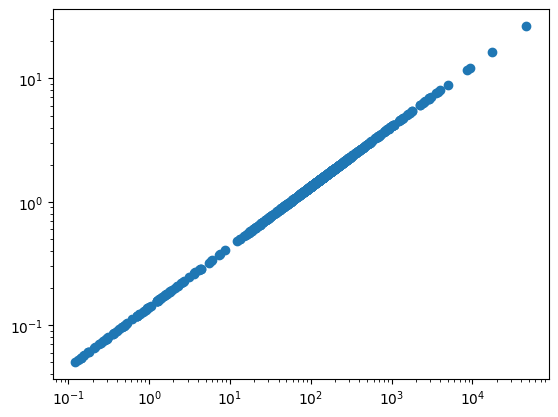

In [ ]:
site = moor_2
plt.scatter(site['combined']['x_km'], site['combined']['C/wspd_fit'])
plt.xscale('log')
plt.yscale('log')

# Wave age versus fetch | Plotting

In [ ]:
def agevfetch_plot_colored(moor_dict):
  fig, ax_list = fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))

  for ax in ax_list:
    ax.scatter(moor_dict['combined']['x_km'],
              moor_dict['combined']['C/wspd'], color=moor_dict['fig color'])
    ax.set_xscale('log')
    ax.set_yscale('log')

    y_label = moor_dict['combined']['C/wspd'].attrs['long_name']
    ax.set_ylabel(y_label, fontsize=12)
    ax.set_xlim(5*10**(-1), 3*10**(4))
    ax.set_ylim(3*10**(-1), 3*10**(1))

  ax1.plot(moor_dict['combined']['x_km'],
           moor_dict['combined']['C/wspd_fit'],
           color=moor_dict['darker color'],
           label=moor_dict['combined']['C/wspd_fit'].attrs['calculated from']+'\n$R^2$ = '+str(round(moor_dict['R2_full'], 4)))


  ax2.axhline(1, color='black')
  ax2.scatter(moor_dict['combined']['x_km'].where(moor_dict['combined']['C/wspd']<1),
              moor_dict['combined']['C/wspd'].where(moor_dict['combined']['C/wspd']<1),
              color='orange')
  ax2.text(5*10**3, 1.1, 'Swells', color=moor_dict['fig color'])
  ax2.text(5*10**3, 0.75, 'Wind seas', color='orange')

  ax3.scatter(moor_dict['onshore']['x_km'],
              moor_dict['onshore']['C/wspd'],
              color=moor_dict['darker color'],
              label='Data with onshore winds')
  ax3.scatter(moor_dict['offshore']['x_km'],
              moor_dict['offshore']['C/wspd'],
              color=moor_dict['lighter color'],
              label='Data with offshore winds')
  ax3.plot(moor_dict['onshore']['x_km'],
              moor_dict['onshore']['C/wspd_fit'],
              color=moor_dict['darker color'],
              label=moor_dict['onshore']['C/wspd_fit'].attrs['calculated from']+'\n$R^2$ = '+str(round(moor_dict['R2_onshore'], 4)))
  ax3.plot(moor_dict['offshore']['x_km'],
              moor_dict['offshore']['C/wspd_fit'],
              color=moor_dict['lighter color'],
              label=moor_dict['offshore']['C/wspd_fit'].attrs['calculated from']+'\n$R^2$ = '+str(round(moor_dict['R2_offshore'], 4)))

  ax1.set_title(moor_dict['Moor']+': Full time')
  ax2.set_title('Swell versus wind sea')
  ax3.set_title('Offshore versus onshore winds')

  x_label = moor_dict['combined']['x_km'].attrs['long_name']
  ax3.set_xlabel(x_label, fontsize=12)
  ax1.legend()
  ax3.legend()

In [ ]:
def agevfetch_plot_colored(moor_dict):
  fig, ax_list = fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

  for ax in ax_list:
    ax.set_xscale('log')
    ax.set_yscale('log')

    y_label = 'Wave age (-)'
    ax.set_ylabel(y_label, fontsize=14)
    ax.set_xlim(5*10**(-1), 3*10**(4))
    ax.set_ylim(3*10**(-1), 3*10**(1))

  ax1.scatter(moor_dict['combined']['x_km'],
            moor_dict['combined']['C/wspd'], color=moor_dict['fig color'])
  ax1.plot(moor_dict['combined']['x_km'],
           moor_dict['combined']['C/wspd_fit'],
           color=moor_dict['darker color'],
           label=moor_dict['combined']['C/wspd_fit'].attrs['calculated from']+'\n$R^2$ = '+str(round(moor_dict['R2_full'], 2)))
  ax1.axhline(1, color='black')
  ax1.text(5*10**3, 1.1, 'Swells', color='black')
  ax1.text(5*10**3, 0.75, 'Wind seas', color='black')

  ax2.scatter(moor_dict['onshore']['x_km'],
              moor_dict['onshore']['C/wspd'],
              color=moor_dict['darker color'],
              label='During onshore winds')
  ax2.scatter(moor_dict['offshore']['x_km'],
              moor_dict['offshore']['C/wspd'],
              color=moor_dict['fig color'],
              alpha=.9,
              label='During offshore winds')
  ax2.plot(moor_dict['onshore']['x_km'],
              moor_dict['onshore']['C/wspd_fit'],
              color=moor_dict['darker color'],
              label=moor_dict['onshore']['C/wspd_fit'].attrs['calculated from']+'\n$R^2$ = '+str(round(moor_dict['R2_onshore'], 2)))
  ax2.plot(moor_dict['offshore']['x_km'],
              moor_dict['offshore']['C/wspd_fit'],
              color=moor_dict['fig color'],
              alpha=.9,
              label=moor_dict['offshore']['C/wspd_fit'].attrs['calculated from']+'\n$R^2$ = '+str(round(moor_dict['R2_offshore'], 2)))

  ax1.set_title(moor_dict['Moor'])

  x_label = 'Estimated fetch (km)'
  ax2.set_xlabel(x_label, fontsize=14)
  for ax in ax_list:
    ax.legend()
    # Show the major grid and style it slightly.
    ax.grid(which='major', linewidth=0.8)
    # Show the minor grid as well. Style it in very light gray as a thin,
    # dotted line.
    ax.grid(which='minor', color='#CCCCCC', linewidth=0.5)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()

  plt.tight_layout()

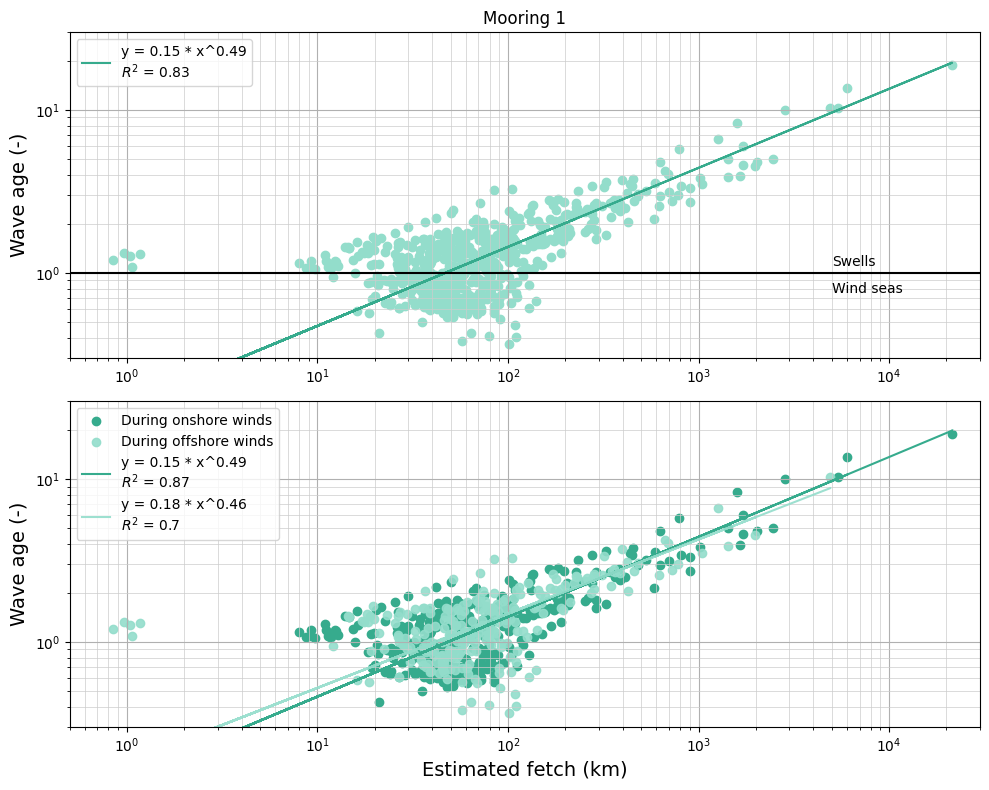

In [ ]:
agevfetch_plot_colored(moor_1)
#plt.savefig(save_direct + 'agevfetch_moor1.jpg', bbox_inches='tight', dpi=400)

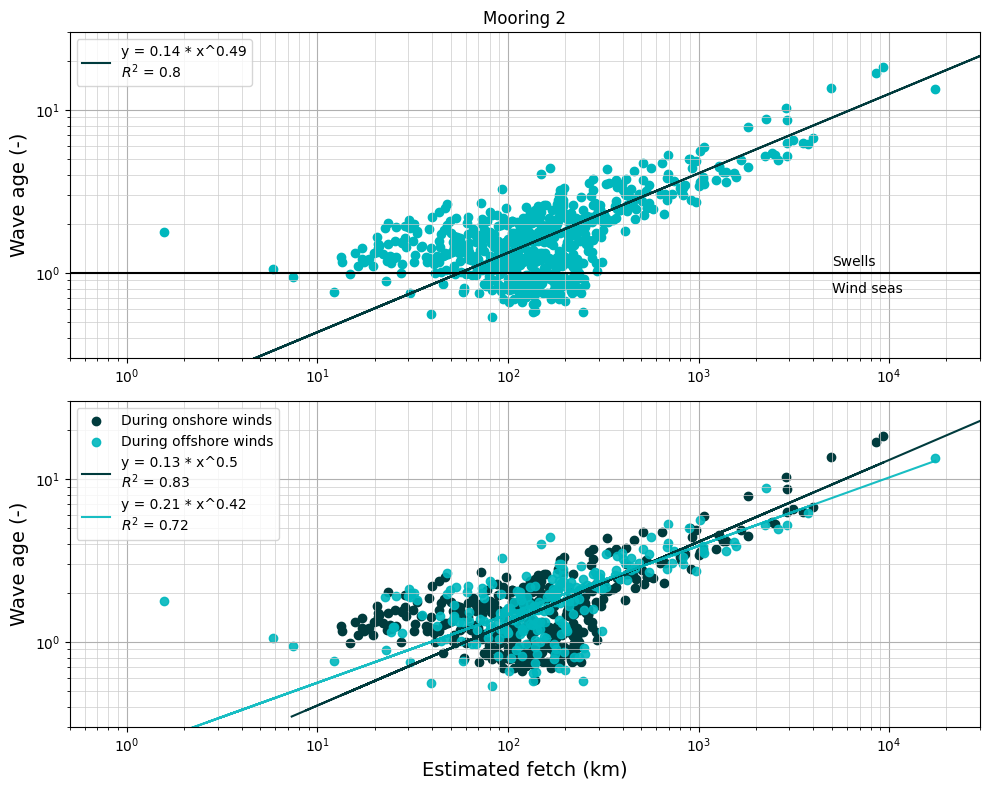

In [ ]:
agevfetch_plot_colored(moor_2)
#plt.savefig(save_direct + 'agevfetch_moor2.jpg', bbox_inches='tight', dpi=400)

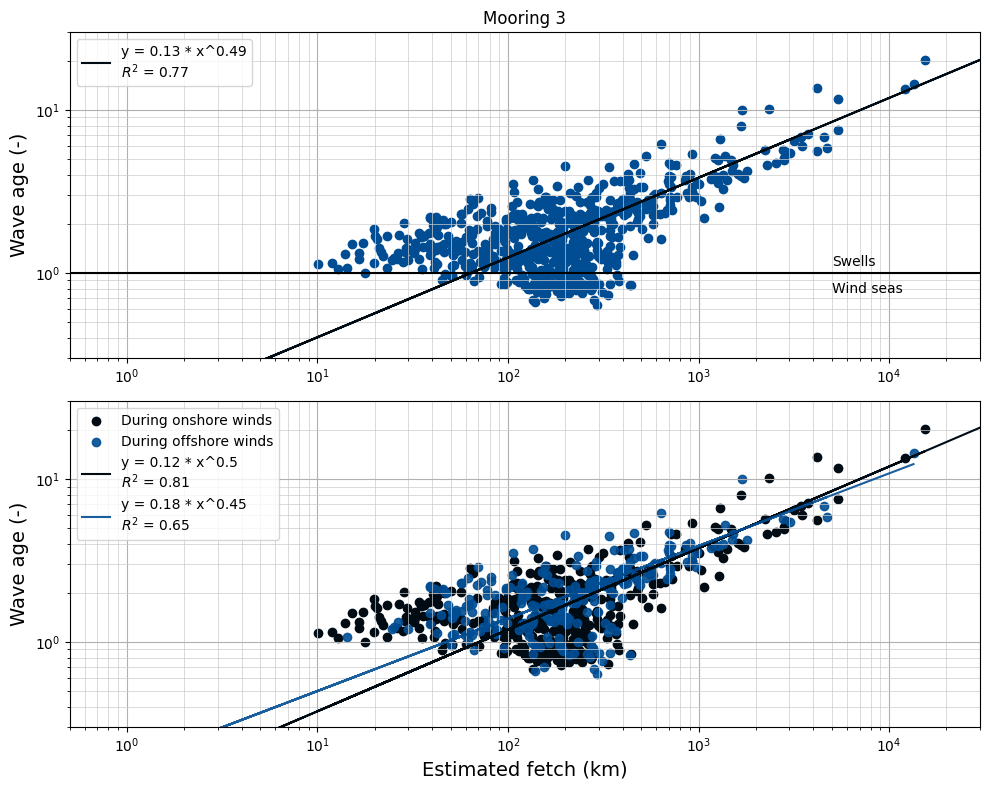

In [ ]:
agevfetch_plot_colored(moor_3)
#plt.savefig(save_direct + 'agevfetch_moor3.jpg', bbox_inches='tight', dpi=400)

In [ ]:
def agevfetch_plot_singular(moor_dict):
  fig, ax_list = fig, ax1 = plt.subplots(1, 1, figsize=(10, 3.5))

  ax=ax1
  ax.set_xscale('log')
  ax.set_yscale('log')

  y_label = 'Wave age (-)'
  ax.set_ylabel(y_label, fontsize=14)
  ax.set_xlim(5*10**(-1), 3*10**(4))
  ax.set_ylim(3*10**(-1), 3*10**(1))

  ax1.scatter(moor_dict['combined']['x_km'],
            moor_dict['combined']['C/wspd'], color=moor_dict['fig color'])
  ax1.plot(moor_dict['combined']['x_km'],
           moor_dict['combined']['C/wspd_fit'],
           color=moor_dict['darker color'],
           label=moor_dict['combined']['C/wspd_fit'].attrs['calculated from']+'\n$R^2$ = '+str(round(moor_dict['R2_full'], 2)))
  ax1.axhline(1, color='black')
  ax1.text(5*10**3, 1.1, 'Swells', color='black')
  ax1.text(5*10**3, 0.75, 'Wind seas', color='black')

  x_label = 'Estimated fetch (km)'
  ax1.set_xlabel(x_label, fontsize=14)
  # Show the major grid and style it slightly.
  ax.grid(which='major', linewidth=0.8)
  # Show the minor grid as well. Style it in very light gray as a thin,
  # dotted line.
  ax.grid(which='minor', color='#CCCCCC', linewidth=0.5)
  # Make the minor ticks and gridlines show.
  ax.minorticks_on()

  plt.tight_layout()

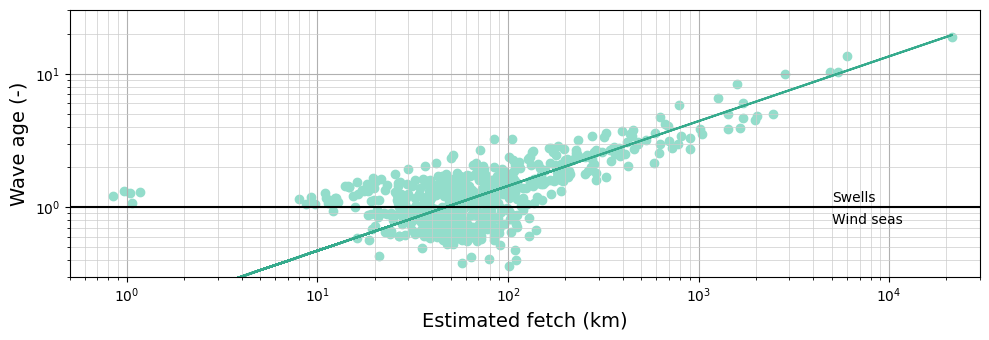

In [ ]:
agevfetch_plot_singular(moor_1)
#plt.savefig(save_direct + 'agevfetch_singular_moor1.png', bbox_inches='tight', dpi=400, transparent=True)

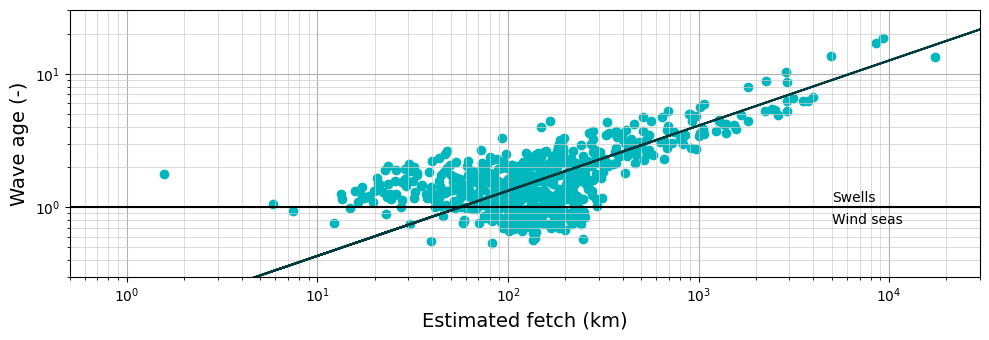

In [ ]:
agevfetch_plot_singular(moor_2)
#plt.savefig(save_direct + 'agevfetch_singular_moor2.png', bbox_inches='tight', dpi=400, transparent=True)

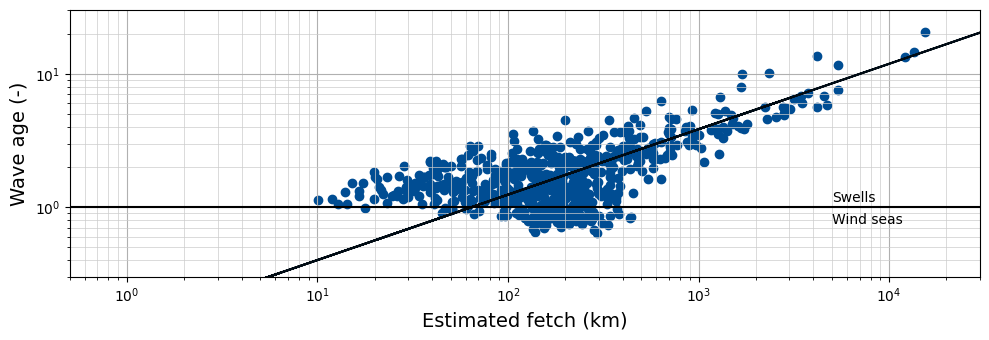

In [ ]:
agevfetch_plot_singular(moor_3)
#plt.savefig(save_direct + 'agevfetch_singular_moor3.png', bbox_inches='tight', dpi=400, transparent=True)

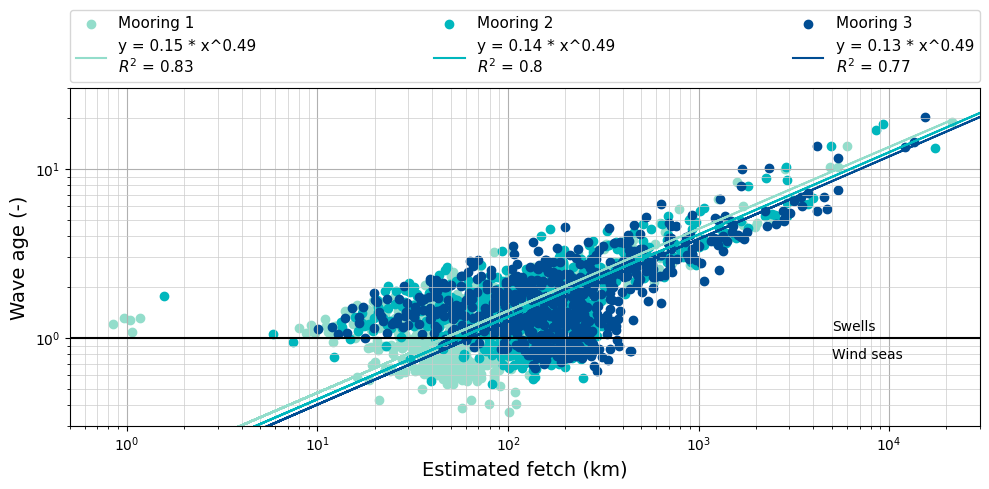

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5)) # For POSTER used (7, 3.5)

ax.set_xscale('log')
ax.set_yscale('log')

y_label = 'Wave age (-)'
ax.set_ylabel(y_label, fontsize=14)
ax.set_xlim(5*10**(-1), 3*10**(4))
ax.set_ylim(3*10**(-1), 3*10**(1))

x_label = 'Estimated fetch (km)'
ax.set_xlabel(x_label, fontsize=14)
ax.grid(which='major', linewidth=0.8)
ax.grid(which='minor', color='#CCCCCC', linewidth=0.5)
ax.minorticks_on()

for site in sites:
  ax.scatter(site['combined']['x_km'],
            site['combined']['C/wspd'], color=site['fig color'],
            label=site['Moor'])

  ax.plot(site['combined']['x_km'],
           site['combined']['C/wspd_fit'],
           color=site['fig color'],
           label=site['combined']['C/wspd_fit'].attrs['calculated from']+'\n$R^2$ = '+str(round(site['R2_full'], 2)))

# Place a legend above this subplot, expanding itself to fully use the given bounding box.
ax.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc='lower left',
                      ncols=3, mode="expand", borderaxespad=0., fontsize=11)

ax.axhline(1, color='black')
ax.text(5*10**3, 1.1, 'Swells', color='black')
ax.text(5*10**3, 0.75, 'Wind seas', color='black')

plt.tight_layout()

#plt.savefig(save_direct + 'agevfetch_singular.png', bbox_inches='tight', dpi=400)

In [ ]:
# Plots Aug-end time frame instead of full time frame, only a small difference between the two

'''
moor_dict =
fig, ax_list = fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))

for ax in ax_list:
  ax.scatter(moor_dict['Aug-end']['x_km'],
            moor_dict['Aug-end']['C/wspd'], color=moor_dict['fig color'])
  ax.set_xscale('log')
  ax.set_yscale('log')

  y_label = moor_dict['Aug-end']['C/wspd'].attrs['long_name']
  ax.set_ylabel(y_label, fontsize=12)

ax2.axhline(1, color='black')
ax2.scatter(moor_dict['Aug-end']['x_km'].where(moor_dict['Aug-end']['C/wspd']<1),
            moor_dict['Aug-end']['C/wspd'].where(moor_dict['Aug-end']['C/wspd']<1),
            color='orange')
ax2.text(5*10**3, 1.1, 'Swells', color=moor_dict['fig color'])
ax2.text(5*10**3, 0.75, 'Wind seas', color='orange')

ax3.scatter(moor_dict['Aug-end']['x_km'].where((moor_dict['Aug-end']['wdir']>low_onshore) & (moor_dict['Aug-end']['wdir']<high_onshore)),
            moor_dict['Aug-end']['C/wspd'].where((moor_dict['Aug-end']['wdir']>low_onshore) & (moor_dict['Aug-end']['wdir']<high_onshore)),
            color='green',
            label='Data with offshore winds')

ax1.set_title(moor_dict['Moor']+': Aug-Sep')
ax2.set_title('Swell versus wind sea')
ax3.set_title('Offshore versus onshore winds')

x_label = moor_dict['Aug-end']['x_km'].attrs['long_name']
ax3.set_xlabel(x_label, fontsize=12)
ax3.legend()
'''

"\nmoor_dict =\nfig, ax_list = fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))\n\nfor ax in ax_list:\n  ax.scatter(moor_dict['Aug-end']['x_km'],\n            moor_dict['Aug-end']['C/wspd'], color=moor_dict['fig color'])\n  ax.set_xscale('log')\n  ax.set_yscale('log')\n\n  y_label = moor_dict['Aug-end']['C/wspd'].attrs['long_name']\n  ax.set_ylabel(y_label, fontsize=12)\n\nax2.axhline(1, color='black')\nax2.scatter(moor_dict['Aug-end']['x_km'].where(moor_dict['Aug-end']['C/wspd']<1),\n            moor_dict['Aug-end']['C/wspd'].where(moor_dict['Aug-end']['C/wspd']<1),\n            color='orange')\nax2.text(5*10**3, 1.1, 'Swells', color=moor_dict['fig color'])\nax2.text(5*10**3, 0.75, 'Wind seas', color='orange')\n\nax3.scatter(moor_dict['Aug-end']['x_km'].where((moor_dict['Aug-end']['wdir']>low_onshore) & (moor_dict['Aug-end']['wdir']<high_onshore)),\n            moor_dict['Aug-end']['C/wspd'].where((moor_dict['Aug-end']['wdir']>low_onshore) & (moor_dict['Aug-end']['wdir']<hi

# Poster Figure

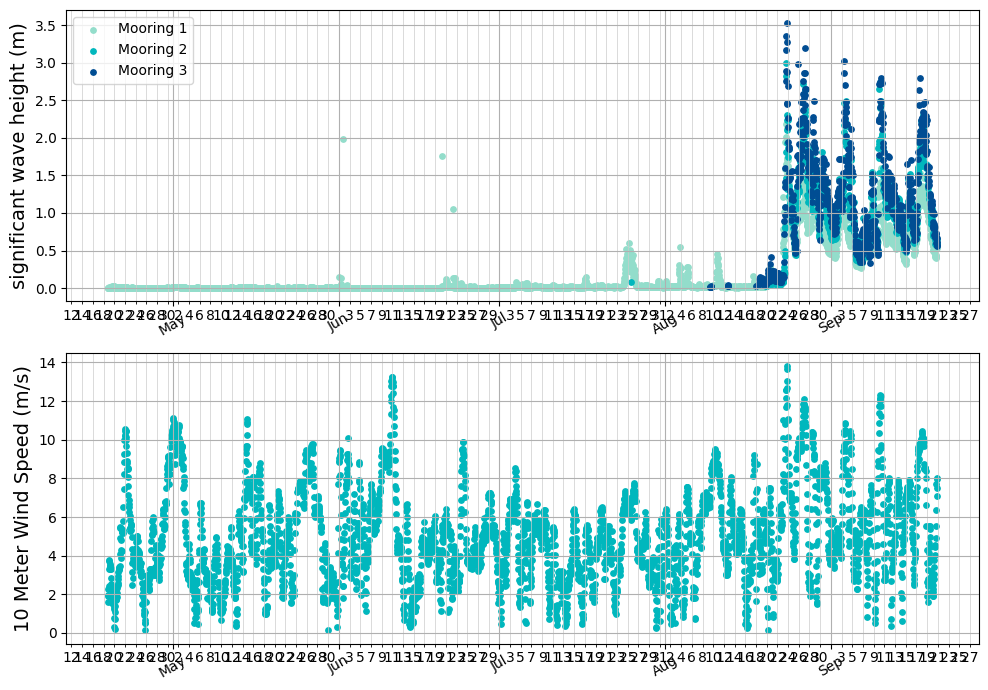

In [ ]:
moor_dict = moor_2
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7))
time_series_singular(ax1, moor_1, 'ds', 'Hs')
time_series_singular(ax1, moor_2, 'ds', 'Hs')
time_series_singular(ax1, moor_3, 'ds', 'Hs')
ax1.legend(('Mooring 1', 'Mooring 2', 'Mooring 3'))

time_series_singular(ax2, moor_dict, 'era5', 'wspd')

for ax in (ax1, ax2):
  time_series_axis(ax)
plt.tight_layout()

In [ ]:
moor_1.keys()

dict_keys(['Site', 'Moor', 'file', 'ds', 'fig color', 'darker color', 'lighter color', 'moor_lat', 'moor_lon', 'era5', 'era5_lat', 'era5_lon', 'x_offshore km', 'moor_start', 'moor_end', 'depth filter', 'depth filtered', 'combined', 'Jul-end moor', 'Aug-end moor', 'Jul-end era5', 'Aug-end era5', 'Jul-end', 'Aug-end', '180 2 wide', '180 10 wide', '180 all moor', 'offshore', 'onshore_low', 'onshore_high', 'onshore', 'm_full', 'b_full', 'R2_full', 'm_offshore', 'b_offshore', 'R2_offshore', 'm_onshore', 'b_onshore', 'R2_onshore'])

Text(0.5, 0, '2023')

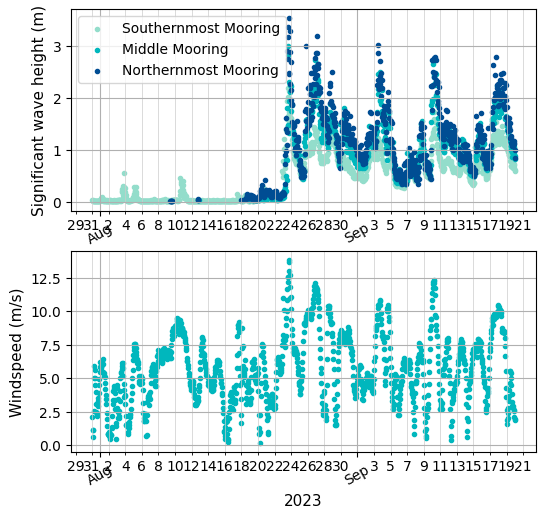

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 5.75))

ax1.scatter(moor_1['Aug-end moor'].time, moor_1['Aug-end moor']['Hs'], marker='.', label= "Southernmost Mooring", color=moor_1['fig color'])
ax1.scatter(moor_2['Aug-end moor'].time, moor_2['Aug-end moor']['Hs'], marker='.', label= "Middle Mooring", color=moor_2['fig color'])
ax1.scatter(moor_3['Aug-end moor'].time, moor_3['Aug-end moor']['Hs'], marker='.', label= "Northernmost Mooring", color=moor_3['fig color'])
ax1.legend()
ax1.set_ylabel('Significant wave height (m)', fontsize=11)
#ax.set_ylabel(y_label, fontsize=14)
ax2.scatter(moor_2['Aug-end era5'].time, moor_2['Aug-end era5']['wspd'], marker='.', color=moor_2['fig color'])
ax2.set_ylabel('Windspeed (m/s)', fontsize=11)
for ax in (ax1, ax2):
  time_series_axis(ax)
ax2.set_xlabel('2023', fontsize=11)

# Wave Spectra

In [ ]:
site['180 all moor']

<xarray.Dataset>
Dimensions:    (time: 4, frequency: 1799)
Coordinates:
  * time       (time) datetime64[ns] 2023-08-19T06:00:00 ... 2023-09-19T02:00:00
  * frequency  (frequency) float64 0.0008333 0.001389 0.001944 ... 0.9992 0.9997
    longitude  float32 -150.0
    latitude   float32 70.75
Data variables: (12/24)
    E          (time, frequency) float64 0.00476 0.004498 ... 0.0004452
    Lat        (time) float64 70.74 70.74 70.74 70.74
    Lon        (time) float64 -150.0 -150.0 -150.0 -150.0
    Temp       (time) float64 -1.274 -1.18 2.269 3.388
    Hs         (time) float64 0.1074 0.1679 0.9466 1.517
    Tp         (time) float64 nan nan 5.255 7.912
    ...         ...
    X_nondim   (time) float64 433.1 2.432e+03 8.004e+05 1.738e+07
    x          (time) float64 1.44e+03 5.426e+03 5.882e+05 4.53e+06
    x_km       (time) float64 1.44 5.426 588.2 4.53e+03
    L          (time) float64 nan nan 42.85 86.61
    C          (time) float64 nan nan 8.154 10.95
    C/wspd     (time) float64 nan nan 3.038 6.848
Attributes:
    creation_date:  2024/02/08
    author:         M Sangillo
    email:          mcsangillo@wpi.edu
    Site:           Site 3

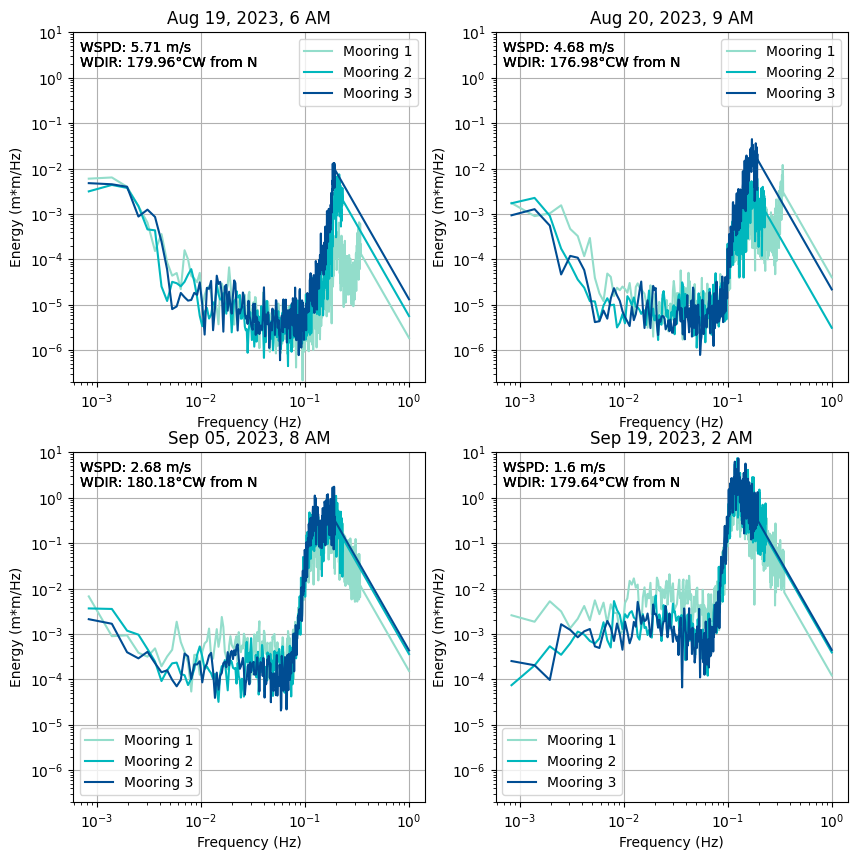

In [ ]:
# Original Plot

fig, axes = fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,  figsize=(10, 10))
axes = axes.flatten()
for site in sites:
  for counter in range(0, 4):
    ax = axes[counter]
    ax.loglog(site['180 all moor'].frequency, site['180 all moor'].E[counter], color=site['fig color'], label=site['Moor'])
    ax.set_title(site['180 all moor']['time'].dt.strftime('%b %d, %Y, %-I %p').item(counter))
    WSPD = 'WSPD: ' + str(round(site['180 all moor']['wspd'].item(counter), 2)) + ' m/s'
    WDIR = 'WDIR: '+ str(round(site['180 all moor']['wdir'].item(counter), 2)) + '°CW from N'
    Fetch = 'Fetch: ' + str(round(site['180 all moor']['x_km'].item(counter), 2)) + ' km'
    anno = WSPD + '\n' + WDIR
    ax.annotate(anno, xy=(.02, .9), xycoords='axes fraction')

for ax in axes:
  ax.set_xlabel('Frequency (Hz)')
  ax.set_ylabel('Energy (m*m/Hz)')
  ax.grid(True)
  ax.set_ylim([2*10**-7, 10**1])

for ax in (ax1, ax2):
  ax.legend()

for ax in (ax3, ax4):
  ax.legend(loc=3)

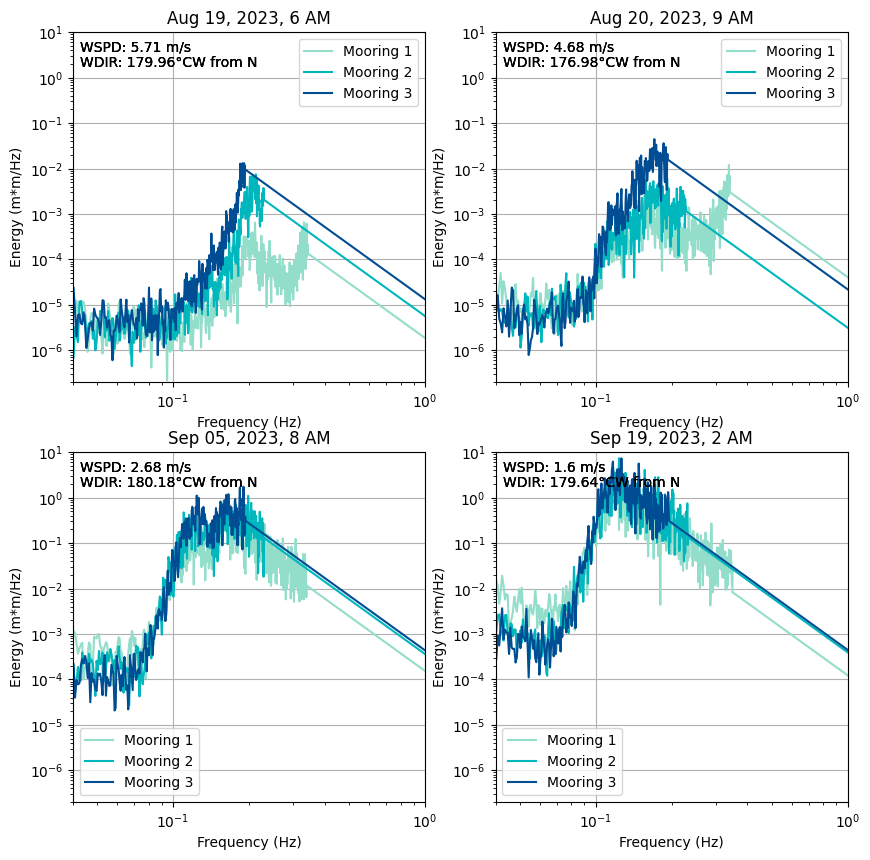

In [ ]:
# Frequency window narrowed

fig, axes = fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,  figsize=(10, 10))
axes = axes.flatten()
for site in sites:
  for counter in range(0, 4):
    ax = axes[counter]
    ax.loglog(site['180 all moor'].frequency, site['180 all moor'].E[counter], color=site['fig color'], label=site['Moor'])
    ax.set_title(site['180 all moor']['time'].dt.strftime('%b %d, %Y, %-I %p').item(counter))
    WSPD = 'WSPD: ' + str(round(site['180 all moor']['wspd'].item(counter), 2)) + ' m/s'
    WDIR = 'WDIR: '+ str(round(site['180 all moor']['wdir'].item(counter), 2)) + '°CW from N'
    anno = WSPD + '\n' + WDIR
    ax.annotate(anno, xy=(.02, .9), xycoords='axes fraction')

for ax in axes:
  ax.set_xlabel('Frequency (Hz)')
  ax.set_ylabel('Energy (m*m/Hz)')
  ax.grid(True)
  ax.set_ylim([2*10**-7, 10**1])
  ax.set_xlim([4*10**-2, 10**0])

for ax in (ax1, ax2):
  ax.legend()

for ax in (ax3, ax4):
  ax.legend(loc=3)

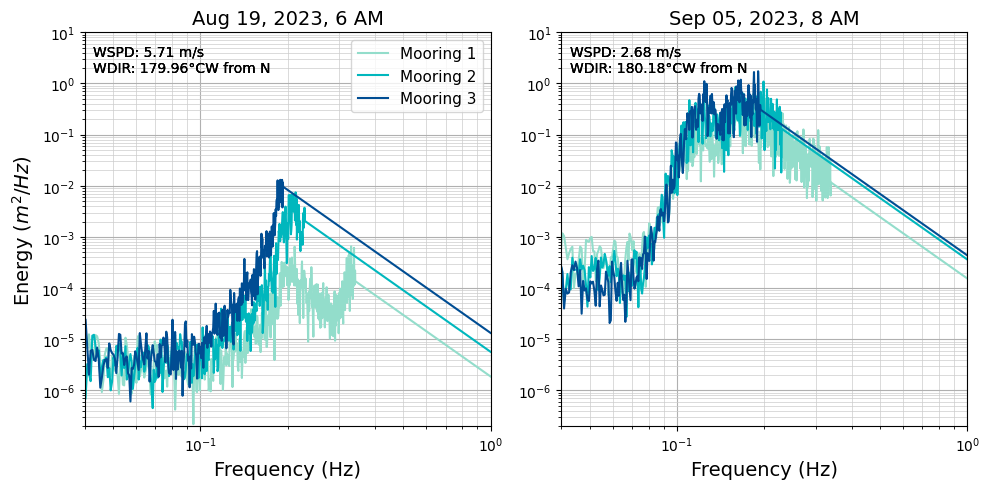

In [ ]:
# Frequency window narrowed and two good plots shown

fig, axes = fig, (ax1, ax2) = plt.subplots(1, 2,  figsize=(10, 5))
axes = axes.flatten()
for site in sites:
  plots = (0, 2) # Plot numbers from above
  for counter in range(0, 2):
    ax = axes[counter]
    ax.loglog(site['180 all moor'].frequency, site['180 all moor'].E[plots[counter]], color=site['fig color'], label=site['Moor'])
    ax.set_title(site['180 all moor']['time'].dt.strftime('%b %d, %Y, %-I %p').item(plots[counter]), fontsize=14)
    WSPD = 'WSPD: ' + str(round(site['180 all moor']['wspd'].item(plots[counter]), 2)) + ' m/s'
    WDIR = 'WDIR: '+ str(round(site['180 all moor']['wdir'].item(plots[counter]), 2)) + '°CW from N'
    anno = WSPD + '\n' + WDIR
    ax.annotate(anno, xy=(.02, .9), xycoords='axes fraction')

for ax in axes:
  ax.set_xlabel('Frequency (Hz)', fontsize=14)

  y_major = mpl.ticker.LogLocator(base = 10.0, numticks = 15)
  ax.yaxis.set_major_locator(y_major)
  y_minor = mpl.ticker.LogLocator(base = 10.0, subs = np.arange(1.0, 10.0) * 0.1, numticks = 10)
  ax.yaxis.set_minor_locator(y_minor)
  ax.yaxis.set_minor_formatter(mpl.ticker.NullFormatter())

  ax.grid(which='major', linewidth=0.8)
  ax.grid(which='minor', color='#CCCCCC', linewidth=0.5)
  ax.grid(True)

  ax.set_ylim([2*10**-7, 10**1])
  ax.set_xlim([4*10**-2, 10**0])

ax1.legend(fontsize=11)

ax1.set_ylabel('Energy ($m^2/Hz$)', fontsize=14)

plt.tight_layout()

#plt.savefig(save_direct + 'spectra_Aug19_Sep05.jpg', bbox_inches='tight', dpi=400)

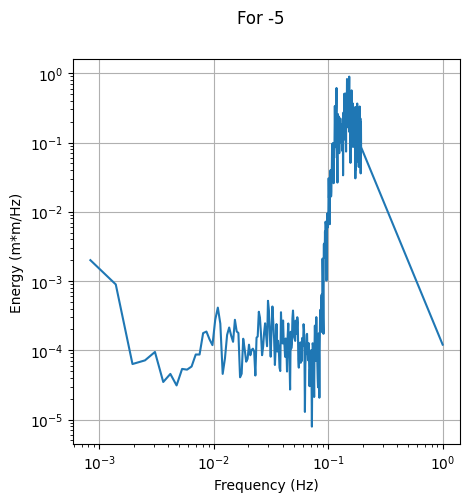

In [ ]:
fig, ax1 = plt.subplots(1, 1,  figsize=(5, 5))
ax1.loglog(moor_full.frequency, moor_full.E[-5])
fig.suptitle("For -5")
ax1.set_xlabel('Frequency (Hz)')
ax1.set_ylabel('Energy (m*m/Hz)')
ax1.grid(True)

In [ ]:
'''
fig, ax1 = plt.subplots(1, 1,  figsize=(5, 5))
fig.suptitle('Energy spectra')

#PLOT
colors1 = plt.cm.jet(np.linspace(0, 1, len(moor_full.time)))
for di, d in enumerate(moor_full.time):
  ax1.loglog(moor_full.frequency, moor_full.E[di], label='['+str(di)+']', color=colors1[di])

ax1.set_xlabel('Frequency (Hz)')
ax1.set_ylabel('Energy (m*m/Hz)')
ax1.grid(True)
'''

"\nfig, ax1 = plt.subplots(1, 1,  figsize=(5, 5))\nfig.suptitle('Energy spectra')\n\n#PLOT\ncolors1 = plt.cm.jet(np.linspace(0, 1, len(moor_full.time)))\nfor di, d in enumerate(moor_full.time):\n  ax1.loglog(moor_full.frequency, moor_full.E[di], label='['+str(di)+']', color=colors1[di])\n\nax1.set_xlabel('Frequency (Hz)')\nax1.set_ylabel('Energy (m*m/Hz)')\nax1.grid(True)\n"